In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, Conv1D, MaxPooling1D, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot
    
# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for specific humidity
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for specific humidity
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for specific humidity
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    #diff_values_training = np.array(diff_values_for_training)
    #diff_values_training = diff_values_training.reshape(1, -1) 
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (specific_humidity) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 12
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

# Swap columns 'temperatures' and 'specific_humidity' directly
df['A'] = df['temperatures']
df['temperatures'] = df['specific_humidity']
df['specific_humidity'] = df['A']
df = df.drop(columns=['A'])
# Rename columns
df = df.rename(columns={'temperatures': 'specific_humidity', 'specific_humidity': 'temperatures'})

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)

#Test model and accuracy when ONI is removed as a predictor
df_trimmed = df_trimmed.drop(['ONI'], axis=1)

n_vars = df_trimmed.shape[1]-1

X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['specific_humidity'].iloc[j])
    y.append(add_to_y)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df) 
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['specific_humidity']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df)

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['specific_humidity']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + n_vars*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 12
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  specific_humidity          slp  vapor_pressure  \
0      2006-01-31     6501           5.386935  1018.534543        8.674922   
1      2006-02-28     6501           4.299929  1021.230347        6.942276   
2      2006-03-31     6501           6.505135  1018.968548       10.468176   
3      2006-04-30     6501          10.211263  1014.686944       16.358802   
4      2006-05-31     6501          11.737971  1014.236828       18.798749   
...           ...      ...                ...          ...             ...   
24057  2024-07-31     9858          15.211417  1013.969355       23.769169   
24058  2024-08-31     9858          15.149811  1015.112097       23.699154   
24059  2024-09-30     9858          10.720199  1014.393750       16.790240   
24060  2024-10-31     9858           6.989922  1018.230376       1

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

12
179
(84, 1981)
(11, 1981)


[I 2025-05-26 15:09:18,329] A new study created in memory with name: no-name-4e02e757-c445-45d7-95cb-cb861e3821e2
[I 2025-05-26 15:14:39,765] Trial 0 finished with value: 0.9673495054244995 and parameters: {'lr': 0.3381836078210737, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.17672320384338144}. Best is trial 0 with value: 0.9673495054244995.


Cross Validation Accuracies:
[1.4250174760818481, 1.028427004814148, 0.8087629675865173, 0.7618436217308044, 0.8126964569091797]
Mean Cross Validation Accuracy:
0.9673495054244995
Standard Deviation of Cross Validation Accuracy:
0.246775345579154


[I 2025-05-26 15:19:30,273] Trial 1 finished with value: 0.06840890869498253 and parameters: {'lr': 0.01400650022645316, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.35586038598888925}. Best is trial 1 with value: 0.06840890869498253.


Cross Validation Accuracies:
[0.06615094095468521, 0.06374459713697433, 0.07523751258850098, 0.07945661246776581, 0.05745488032698631]
Mean Cross Validation Accuracy:
0.06840890869498253
Standard Deviation of Cross Validation Accuracy:
0.007943885043214098


[I 2025-05-26 15:23:40,740] Trial 2 finished with value: 0.09727923274040222 and parameters: {'lr': 0.0010074343315996258, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.2599852032451583}. Best is trial 1 with value: 0.06840890869498253.


Cross Validation Accuracies:
[0.08967205882072449, 0.10504474490880966, 0.10017526894807816, 0.10607726126909256, 0.08542682975530624]
Mean Cross Validation Accuracy:
0.09727923274040222
Standard Deviation of Cross Validation Accuracy:
0.008299928463677747


[I 2025-05-26 15:29:08,711] Trial 3 finished with value: 0.27627199292182925 and parameters: {'lr': 0.0016933011614936786, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.2571915230002233}. Best is trial 1 with value: 0.06840890869498253.


Cross Validation Accuracies:
[0.2935413420200348, 0.2693406045436859, 0.24197253584861755, 0.2934309244155884, 0.2830745577812195]
Mean Cross Validation Accuracy:
0.27627199292182925
Standard Deviation of Cross Validation Accuracy:
0.019305082943697364


[I 2025-05-26 15:33:50,062] Trial 4 finished with value: 11.12197437286377 and parameters: {'lr': 0.11488092584604932, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.42229392103752816}. Best is trial 1 with value: 0.06840890869498253.


Cross Validation Accuracies:
[11.745444297790527, 7.1623992919921875, 12.355487823486328, 12.610623359680176, 11.735917091369629]
Mean Cross Validation Accuracy:
11.12197437286377
Standard Deviation of Cross Validation Accuracy:
2.0090548259701637


[I 2025-05-26 15:40:54,482] Trial 5 finished with value: 0.4749838709831238 and parameters: {'lr': 0.9471458561207253, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.2864972820831301}. Best is trial 1 with value: 0.06840890869498253.


Cross Validation Accuracies:
[0.47765490412712097, 0.4440368413925171, 0.4866980314254761, 0.4687344431877136, 0.49779513478279114]
Mean Cross Validation Accuracy:
0.4749838709831238
Standard Deviation of Cross Validation Accuracy:
0.018229008296204424


[I 2025-05-26 15:46:20,559] Trial 6 finished with value: 0.07460758611559867 and parameters: {'lr': 0.0014644825172862792, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.4394969750654717}. Best is trial 1 with value: 0.06840890869498253.


Cross Validation Accuracies:
[0.07854287326335907, 0.0714368000626564, 0.0832868367433548, 0.08260050415992737, 0.057170916348695755]
Mean Cross Validation Accuracy:
0.07460758611559867
Standard Deviation of Cross Validation Accuracy:
0.009682912289302717


[I 2025-05-26 15:52:49,147] Trial 7 finished with value: 0.954715895652771 and parameters: {'lr': 0.2839028566267014, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.49449453019652323}. Best is trial 1 with value: 0.06840890869498253.


Cross Validation Accuracies:
[0.9147008657455444, 0.7726919054985046, 0.8940456509590149, 1.1356885433197021, 1.0564525127410889]
Mean Cross Validation Accuracy:
0.954715895652771
Standard Deviation of Cross Validation Accuracy:
0.1276841827804142


[I 2025-05-26 15:56:59,648] Trial 8 finished with value: 0.06568034291267395 and parameters: {'lr': 0.00968910222835809, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4907188287304828}. Best is trial 8 with value: 0.06568034291267395.


Cross Validation Accuracies:
[0.05192930996417999, 0.06912827491760254, 0.07548659294843674, 0.07761833816766739, 0.05423919856548309]
Mean Cross Validation Accuracy:
0.06568034291267395
Standard Deviation of Cross Validation Accuracy:
0.010682295602599453


[I 2025-05-26 16:02:21,856] Trial 9 finished with value: 0.06295266598463059 and parameters: {'lr': 0.016328334344695297, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.1986420414896339}. Best is trial 9 with value: 0.06295266598463059.


Cross Validation Accuracies:
[0.055710319429636, 0.05655372142791748, 0.07253949344158173, 0.07744565606117249, 0.05251413956284523]
Mean Cross Validation Accuracy:
0.06295266598463059
Standard Deviation of Cross Validation Accuracy:
0.01004305661607994


[I 2025-05-26 16:06:19,379] Trial 10 finished with value: 0.0627079501748085 and parameters: {'lr': 0.024264401528637798, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.14852603674766407}. Best is trial 10 with value: 0.0627079501748085.


Cross Validation Accuracies:
[0.0556018203496933, 0.05666206777095795, 0.07248055189847946, 0.07643837481737137, 0.052356936037540436]
Mean Cross Validation Accuracy:
0.0627079501748085
Standard Deviation of Cross Validation Accuracy:
0.009779791144161507


[I 2025-05-26 16:11:00,133] Trial 11 finished with value: 0.06270080655813218 and parameters: {'lr': 0.03772628888182626, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.10590064776525576}. Best is trial 11 with value: 0.06270080655813218.


Cross Validation Accuracies:
[0.05608781799674034, 0.05641457810997963, 0.0720028281211853, 0.07711560279130936, 0.05188320577144623]
Mean Cross Validation Accuracy:
0.06270080655813218
Standard Deviation of Cross Validation Accuracy:
0.009945679747499356


[I 2025-05-26 16:15:31,085] Trial 12 finished with value: 0.06143923401832581 and parameters: {'lr': 0.049140473209627965, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.10245688503863695}. Best is trial 12 with value: 0.06143923401832581.


Cross Validation Accuracies:
[0.052771344780921936, 0.056451234966516495, 0.0723390057682991, 0.0749637559056282, 0.05067082867026329]
Mean Cross Validation Accuracy:
0.06143923401832581
Standard Deviation of Cross Validation Accuracy:
0.010175349709907482


[I 2025-05-26 16:19:35,741] Trial 13 finished with value: 0.06452593356370925 and parameters: {'lr': 0.06747033219204289, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.10000178382899827}. Best is trial 12 with value: 0.06143923401832581.


Cross Validation Accuracies:
[0.05865584313869476, 0.05771857872605324, 0.07304539531469345, 0.07873370498418808, 0.05447614565491676]
Mean Cross Validation Accuracy:
0.06452593356370925
Standard Deviation of Cross Validation Accuracy:
0.009552363851512095


[I 2025-05-26 16:23:23,293] Trial 14 finished with value: 0.10638784170150757 and parameters: {'lr': 0.005970208337854583, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.10375745615792929}. Best is trial 12 with value: 0.06143923401832581.


Cross Validation Accuracies:
[0.07654187828302383, 0.20253996551036835, 0.08413954079151154, 0.10110802203416824, 0.06760980188846588]
Mean Cross Validation Accuracy:
0.10638784170150757
Standard Deviation of Cross Validation Accuracy:
0.04932060868678561


[I 2025-05-26 16:27:26,190] Trial 15 finished with value: 0.059882814437150954 and parameters: {'lr': 0.052839269529758114, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.20089362668537505}. Best is trial 15 with value: 0.059882814437150954.


Cross Validation Accuracies:
[0.04912314563989639, 0.056289780884981155, 0.07064632326364517, 0.07401077449321747, 0.04934404790401459]
Mean Cross Validation Accuracy:
0.059882814437150954
Standard Deviation of Cross Validation Accuracy:
0.010537536148240882


[I 2025-05-26 16:30:36,743] Trial 16 finished with value: 0.06108530014753342 and parameters: {'lr': 0.06212677475511509, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.2141655931370194}. Best is trial 15 with value: 0.059882814437150954.


Cross Validation Accuracies:
[0.051094043999910355, 0.056331612169742584, 0.06827325373888016, 0.07753634452819824, 0.052191246300935745]
Mean Cross Validation Accuracy:
0.06108530014753342
Standard Deviation of Cross Validation Accuracy:
0.010235531062624408


[I 2025-05-26 16:34:12,180] Trial 17 finished with value: 0.06917596310377121 and parameters: {'lr': 0.14229800258763634, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.23052384129665293}. Best is trial 15 with value: 0.059882814437150954.


Cross Validation Accuracies:
[0.07955603301525116, 0.04787738621234894, 0.07178007066249847, 0.07468286156654358, 0.0719834640622139]
Mean Cross Validation Accuracy:
0.06917596310377121
Standard Deviation of Cross Validation Accuracy:
0.011012398444075658


[I 2025-05-26 16:37:31,590] Trial 18 finished with value: 0.06272968947887421 and parameters: {'lr': 0.005445352070904027, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.3446388164932276}. Best is trial 15 with value: 0.059882814437150954.


Cross Validation Accuracies:
[0.05615265667438507, 0.05695509910583496, 0.0722583755850792, 0.0766640231013298, 0.051618292927742004]
Mean Cross Validation Accuracy:
0.06272968947887421
Standard Deviation of Cross Validation Accuracy:
0.009849141081502658


[I 2025-05-26 16:40:50,913] Trial 19 finished with value: 0.06196221634745598 and parameters: {'lr': 0.1366150499368024, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.3267774144084992}. Best is trial 15 with value: 0.059882814437150954.


Cross Validation Accuracies:
[0.04323707893490791, 0.06514176726341248, 0.07321757078170776, 0.07720579952001572, 0.05100886523723602]
Mean Cross Validation Accuracy:
0.06196221634745598
Standard Deviation of Cross Validation Accuracy:
0.01295967628507056


[I 2025-05-26 16:44:07,661] Trial 20 finished with value: 2.4387919664382935 and parameters: {'lr': 0.33948983097319085, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.21088050824883653}. Best is trial 15 with value: 0.059882814437150954.


Cross Validation Accuracies:
[2.171613931655884, 1.8246859312057495, 2.9766275882720947, 2.7764387130737305, 2.444593667984009]
Mean Cross Validation Accuracy:
2.4387919664382935
Standard Deviation of Cross Validation Accuracy:
0.41275088519514946


[I 2025-05-26 16:48:12,340] Trial 21 finished with value: 0.061623722314834595 and parameters: {'lr': 0.04929331894190287, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.1480571931328024}. Best is trial 15 with value: 0.059882814437150954.


Cross Validation Accuracies:
[0.05073349550366402, 0.058417197316884995, 0.06949906796216965, 0.07817689329385757, 0.05129195749759674]
Mean Cross Validation Accuracy:
0.061623722314834595
Standard Deviation of Cross Validation Accuracy:
0.010692546425671445


[I 2025-05-26 16:52:13,762] Trial 22 finished with value: 0.0607361800968647 and parameters: {'lr': 0.06936837793082296, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.15797643842259632}. Best is trial 15 with value: 0.059882814437150954.


Cross Validation Accuracies:
[0.04566853120923042, 0.059023287147283554, 0.06902862340211868, 0.0729304850101471, 0.05702997371554375]
Mean Cross Validation Accuracy:
0.0607361800968647
Standard Deviation of Cross Validation Accuracy:
0.009603850262136017


[I 2025-05-26 16:55:33,349] Trial 23 finished with value: 0.05626542791724205 and parameters: {'lr': 0.09490875506330336, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.16475418156786034}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.04629550874233246, 0.0532417856156826, 0.06624802947044373, 0.06907154619693756, 0.046470269560813904]
Mean Cross Validation Accuracy:
0.05626542791724205
Standard Deviation of Cross Validation Accuracy:
0.009676113140234045


[I 2025-05-26 16:59:30,304] Trial 24 finished with value: 0.06077936142683029 and parameters: {'lr': 0.11143772936155824, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.15514203874037702}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.04647151380777359, 0.048342265188694, 0.06825564801692963, 0.07780641317367554, 0.0630209669470787]
Mean Cross Validation Accuracy:
0.06077936142683029
Standard Deviation of Cross Validation Accuracy:
0.011918355708756668


[I 2025-05-26 17:02:50,897] Trial 25 finished with value: 0.06561133414506912 and parameters: {'lr': 0.20850922626291307, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.17055097845642578}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.043492116034030914, 0.05916978418827057, 0.077427439391613, 0.08835186064243317, 0.059615470468997955]
Mean Cross Validation Accuracy:
0.06561133414506912
Standard Deviation of Cross Validation Accuracy:
0.015642606211794502


[I 2025-05-26 17:06:56,263] Trial 26 finished with value: 0.08193351775407791 and parameters: {'lr': 0.5688739936444441, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.2509972988207767}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.0945010855793953, 0.08173950016498566, 0.0817553922533989, 0.08398448675870895, 0.06768712401390076]
Mean Cross Validation Accuracy:
0.08193351775407791
Standard Deviation of Cross Validation Accuracy:
0.008546102515426994


[I 2025-05-26 17:09:49,022] Trial 27 finished with value: 0.06229054033756256 and parameters: {'lr': 0.025666330162286116, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.18436682970464424}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.0561089850962162, 0.05630836635828018, 0.07122424244880676, 0.07628455013036728, 0.05152655765414238]
Mean Cross Validation Accuracy:
0.06229054033756256
Standard Deviation of Cross Validation Accuracy:
0.009648882810178108


[I 2025-05-26 17:13:57,235] Trial 28 finished with value: 0.4040782690048218 and parameters: {'lr': 0.0739193337116087, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.1426305438735077}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.3336324691772461, 0.5923272371292114, 0.29052087664604187, 0.3632641136646271, 0.4406466484069824]
Mean Cross Validation Accuracy:
0.4040782690048218
Standard Deviation of Cross Validation Accuracy:
0.10611183508054521


[I 2025-05-26 17:18:20,142] Trial 29 finished with value: 0.07732962518930435 and parameters: {'lr': 0.2518480241048707, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.13118636018214647}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.07197762280702591, 0.07369745522737503, 0.0831931084394455, 0.09128696471452713, 0.0664929747581482]
Mean Cross Validation Accuracy:
0.07732962518930435
Standard Deviation of Cross Validation Accuracy:
0.008814276409851968


[I 2025-05-26 17:22:47,695] Trial 30 finished with value: 1.6324238777160645 and parameters: {'lr': 0.4629277017095541, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.17787813959433402}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[1.9141606092453003, 1.493801474571228, 2.232879161834717, 1.4907475709915161, 1.030530571937561]
Mean Cross Validation Accuracy:
1.6324238777160645
Standard Deviation of Cross Validation Accuracy:
0.41024042516566334


[I 2025-05-26 17:26:53,944] Trial 31 finished with value: 0.057387234270572664 and parameters: {'lr': 0.10536128214239253, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.16005017167909838}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.04695746675133705, 0.05470671504735947, 0.07203073054552078, 0.06762207299470901, 0.045619186013936996]
Mean Cross Validation Accuracy:
0.057387234270572664
Standard Deviation of Cross Validation Accuracy:
0.010711079314852672


[I 2025-05-26 17:32:02,601] Trial 32 finished with value: 0.06254102289676666 and parameters: {'lr': 0.0897818746338407, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.18111248223591433}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.05334050953388214, 0.053481295704841614, 0.07074598222970963, 0.08357811719179153, 0.0515592098236084]
Mean Cross Validation Accuracy:
0.06254102289676666
Standard Deviation of Cross Validation Accuracy:
0.012627026691502069


[I 2025-05-26 17:36:23,967] Trial 33 finished with value: 0.0710984855890274 and parameters: {'lr': 0.1732641632460525, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.23437436209500334}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.06857044994831085, 0.0718824565410614, 0.07588132470846176, 0.07355567812919617, 0.06560251861810684]
Mean Cross Validation Accuracy:
0.0710984855890274
Standard Deviation of Cross Validation Accuracy:
0.0036366075625964543


[I 2025-05-26 17:41:10,060] Trial 34 finished with value: 0.06175291761755943 and parameters: {'lr': 0.036116045658229644, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.2916457506166733}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.053143955767154694, 0.05623895302414894, 0.0716627910733223, 0.07622605562210083, 0.051492832601070404]
Mean Cross Validation Accuracy:
0.06175291761755943
Standard Deviation of Cross Validation Accuracy:
0.010173147888755233


[I 2025-05-26 17:44:23,748] Trial 35 finished with value: 9.316433811187744 and parameters: {'lr': 0.0982120092425424, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.2058594702641805}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[7.666229724884033, 8.601391792297363, 9.226339340209961, 10.479939460754395, 10.608268737792969]
Mean Cross Validation Accuracy:
9.316433811187744
Standard Deviation of Cross Validation Accuracy:
1.1193889853937016


[I 2025-05-26 17:49:27,627] Trial 36 finished with value: 0.06311209201812744 and parameters: {'lr': 0.01769943737489359, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.1288079532250911}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.05770663172006607, 0.0574377067387104, 0.07235116511583328, 0.0755992904305458, 0.052465666085481644]
Mean Cross Validation Accuracy:
0.06311209201812744
Standard Deviation of Cross Validation Accuracy:
0.009122002306164485


[I 2025-05-26 17:53:32,995] Trial 37 finished with value: 1.2629130363464356 and parameters: {'lr': 0.05060606097136724, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.2648062331045942}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[1.401668667793274, 1.4087657928466797, 1.1099344491958618, 1.179769515991211, 1.2144267559051514]
Mean Cross Validation Accuracy:
1.2629130363464356
Standard Deviation of Cross Validation Accuracy:
0.12098955684818963


[I 2025-05-26 17:56:56,890] Trial 38 finished with value: 0.06248005852103233 and parameters: {'lr': 0.010757344814113709, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.22621682098790707}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.05489456281065941, 0.057450298219919205, 0.07149604707956314, 0.07646104693412781, 0.052098337560892105]
Mean Cross Validation Accuracy:
0.06248005852103233
Standard Deviation of Cross Validation Accuracy:
0.009668241315230221


[I 2025-05-26 18:02:22,603] Trial 39 finished with value: 1.7379601001739502 and parameters: {'lr': 0.024653064881107113, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.16503068012869065}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[1.257430911064148, 1.794360637664795, 1.7138187885284424, 2.0311055183410645, 1.8930846452713013]
Mean Cross Validation Accuracy:
1.7379601001739502
Standard Deviation of Cross Validation Accuracy:
0.262552846424402


[I 2025-05-26 18:07:38,864] Trial 40 finished with value: 0.7203359246253968 and parameters: {'lr': 0.08344265817564914, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3960893072463332}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[1.1601454019546509, 0.6569739580154419, 0.3520415425300598, 0.5444066524505615, 0.8881120681762695]
Mean Cross Validation Accuracy:
0.7203359246253968
Standard Deviation of Cross Validation Accuracy:
0.28006706703826106


[I 2025-05-26 18:12:32,992] Trial 41 finished with value: 0.06720097512006759 and parameters: {'lr': 0.11664667387338495, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.15935208843638898}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.06192884221673012, 0.06591043621301651, 0.07604464143514633, 0.07375623285770416, 0.05836472287774086]
Mean Cross Validation Accuracy:
0.06720097512006759
Standard Deviation of Cross Validation Accuracy:
0.006763461652296004


[I 2025-05-26 18:18:04,333] Trial 42 finished with value: 0.07133975774049758 and parameters: {'lr': 0.18105131219581622, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.12672856528578375}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.07165393978357315, 0.06349796056747437, 0.07336408644914627, 0.08536071330308914, 0.06282208859920502]
Mean Cross Validation Accuracy:
0.07133975774049758
Standard Deviation of Cross Validation Accuracy:
0.00818325463942532


[I 2025-05-26 18:22:25,401] Trial 43 finished with value: 0.062030918151140216 and parameters: {'lr': 0.12804856975879864, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.19601862877123127}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.04851569980382919, 0.05907184258103371, 0.07035201042890549, 0.0716540589928627, 0.06056097894906998]
Mean Cross Validation Accuracy:
0.062030918151140216
Standard Deviation of Cross Validation Accuracy:
0.008431173024171533


[I 2025-05-26 18:26:38,928] Trial 44 finished with value: 0.06207772642374039 and parameters: {'lr': 0.03365154340759581, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.13175398790449033}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.057620350271463394, 0.056763891130685806, 0.07056684046983719, 0.07523352652788162, 0.05020402371883392]
Mean Cross Validation Accuracy:
0.06207772642374039
Standard Deviation of Cross Validation Accuracy:
0.009319120100920083


[I 2025-05-26 18:31:40,028] Trial 45 finished with value: 0.09705030620098114 and parameters: {'lr': 0.05923155392477589, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.19125534452357817}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.09319253265857697, 0.08730844408273697, 0.10192009806632996, 0.11821635067462921, 0.0846141055226326]
Mean Cross Validation Accuracy:
0.09705030620098114
Standard Deviation of Cross Validation Accuracy:
0.012133933352542998


[I 2025-05-26 18:35:53,976] Trial 46 finished with value: 0.06841049566864968 and parameters: {'lr': 0.37798328521474195, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.16004558080696077}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.058987341821193695, 0.06075882911682129, 0.07770970463752747, 0.08537313342094421, 0.059223469346761703]
Mean Cross Validation Accuracy:
0.06841049566864968
Standard Deviation of Cross Validation Accuracy:
0.011008647955627261


[I 2025-05-26 18:40:19,743] Trial 47 finished with value: 0.06944855749607086 and parameters: {'lr': 0.23138932844705276, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.2722254447666821}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.04729335010051727, 0.06413419544696808, 0.08483230322599411, 0.07625952363014221, 0.07472341507673264]
Mean Cross Validation Accuracy:
0.06944855749607086
Standard Deviation of Cross Validation Accuracy:
0.012883855584316364


[I 2025-05-26 18:44:31,156] Trial 48 finished with value: 3.1354480981826782 and parameters: {'lr': 0.039866937781682446, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.11821082337365665}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[3.3331563472747803, 3.2898919582366943, 3.4680910110473633, 1.9190586805343628, 3.6670424938201904]
Mean Cross Validation Accuracy:
3.1354480981826782
Standard Deviation of Cross Validation Accuracy:
0.6222199903549501


[I 2025-05-26 18:49:00,718] Trial 49 finished with value: 0.05862352028489113 and parameters: {'lr': 0.08939435801315923, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.14501668921154054}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.03977053984999657, 0.05909081920981407, 0.06869181990623474, 0.07272851467132568, 0.05283590778708458]
Mean Cross Validation Accuracy:
0.05862352028489113
Standard Deviation of Cross Validation Accuracy:
0.011742838003608976


[I 2025-05-26 18:53:41,248] Trial 50 finished with value: 0.10503258407115937 and parameters: {'lr': 0.07598625184100007, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.24587308386200568}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.09099546074867249, 0.09369518607854843, 0.11549706012010574, 0.11835310608148575, 0.1066221073269844]
Mean Cross Validation Accuracy:
0.10503258407115937
Standard Deviation of Cross Validation Accuracy:
0.01109094742752786


[I 2025-05-26 18:57:53,249] Trial 51 finished with value: 0.0583736963570118 and parameters: {'lr': 0.1632888247265932, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.15586292701217958}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.04251499101519585, 0.04738043248653412, 0.07268956303596497, 0.07658036798238754, 0.0527031272649765]
Mean Cross Validation Accuracy:
0.0583736963570118
Standard Deviation of Cross Validation Accuracy:
0.013718109708818206


[I 2025-05-26 19:02:06,869] Trial 52 finished with value: 0.06741472110152244 and parameters: {'lr': 0.15515170737007591, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.1399322949948561}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.06346011161804199, 0.06564348191022873, 0.07770927250385284, 0.0781480073928833, 0.05211273208260536]
Mean Cross Validation Accuracy:
0.06741472110152244
Standard Deviation of Cross Validation Accuracy:
0.009737641558018092


[I 2025-05-26 19:06:33,487] Trial 53 finished with value: 0.0600634440779686 and parameters: {'lr': 0.059888349774724625, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.1688439226493978}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.05000576004385948, 0.055987659841775894, 0.06919602304697037, 0.0743882954120636, 0.050739482045173645]
Mean Cross Validation Accuracy:
0.0600634440779686
Standard Deviation of Cross Validation Accuracy:
0.009932881330489647


[I 2025-05-26 19:11:35,957] Trial 54 finished with value: 0.061837969720363616 and parameters: {'lr': 0.04612288765176645, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3095948577874667}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.05312380939722061, 0.057020459324121475, 0.07053093612194061, 0.0760641098022461, 0.05245053395628929]
Mean Cross Validation Accuracy:
0.061837969720363616
Standard Deviation of Cross Validation Accuracy:
0.009645928397704933


[I 2025-05-26 19:16:11,545] Trial 55 finished with value: 0.05938356071710586 and parameters: {'lr': 0.10600976227908952, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.21768624532087635}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.049203433096408844, 0.05512912571430206, 0.06834270060062408, 0.07397060096263885, 0.05027194321155548]
Mean Cross Validation Accuracy:
0.05938356071710586
Standard Deviation of Cross Validation Accuracy:
0.009978023047793173


[I 2025-05-26 19:20:11,427] Trial 56 finished with value: 0.06164398267865181 and parameters: {'lr': 0.1064001927851306, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.2160684494541726}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.055793825536966324, 0.052383407950401306, 0.07209200412034988, 0.07523783296346664, 0.05271284282207489]
Mean Cross Validation Accuracy:
0.06164398267865181
Standard Deviation of Cross Validation Accuracy:
0.009936817998029403


[I 2025-05-26 19:23:57,655] Trial 57 finished with value: 0.07374834418296813 and parameters: {'lr': 0.8742209832363452, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.11473060395261706}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.05744613707065582, 0.08211322128772736, 0.07222053408622742, 0.09362437576055527, 0.06333745270967484]
Mean Cross Validation Accuracy:
0.07374834418296813
Standard Deviation of Cross Validation Accuracy:
0.012973130863011334


[I 2025-05-26 19:27:03,074] Trial 58 finished with value: 0.05735689774155617 and parameters: {'lr': 0.3027720494578948, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.19822869242661081}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.04959804192185402, 0.046771787106990814, 0.067564457654953, 0.07021938264369965, 0.052630819380283356]
Mean Cross Validation Accuracy:
0.05735689774155617
Standard Deviation of Cross Validation Accuracy:
0.009635538642932843


[I 2025-05-26 19:30:08,533] Trial 59 finished with value: 0.06726458445191383 and parameters: {'lr': 0.6645186771327269, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.1964668511010298}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.06846316158771515, 0.07432633638381958, 0.0686292052268982, 0.07341725379228592, 0.05148696526885033]
Mean Cross Validation Accuracy:
0.06726458445191383
Standard Deviation of Cross Validation Accuracy:
0.008245674313911353


[I 2025-05-26 19:33:19,532] Trial 60 finished with value: 0.06063447892665863 and parameters: {'lr': 0.30004754265062156, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.1764084458317434}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.04115908965468407, 0.06623256951570511, 0.06973141431808472, 0.06815700232982635, 0.057892318814992905]
Mean Cross Validation Accuracy:
0.06063447892665863
Standard Deviation of Cross Validation Accuracy:
0.010559274970215615


[I 2025-05-26 19:37:13,118] Trial 61 finished with value: 0.06224754527211189 and parameters: {'lr': 0.20400538012146224, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.21784868883366101}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.04320504143834114, 0.060468707233667374, 0.0744432657957077, 0.08177225291728973, 0.05134845897555351]
Mean Cross Validation Accuracy:
0.06224754527211189
Standard Deviation of Cross Validation Accuracy:
0.014244445281198842


[I 2025-05-26 19:40:33,686] Trial 62 finished with value: 0.058663591742515564 and parameters: {'lr': 0.1481296508393604, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.14498645433644913}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.05359970033168793, 0.05071215331554413, 0.06808850169181824, 0.07363732904195786, 0.04728027433156967]
Mean Cross Validation Accuracy:
0.058663591742515564
Standard Deviation of Cross Validation Accuracy:
0.010310092345096522


[I 2025-05-26 19:43:40,125] Trial 63 finished with value: 0.05936889424920082 and parameters: {'lr': 0.4119168030258675, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.14990827896516187}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.041288796812295914, 0.05340529605746269, 0.06705338507890701, 0.07759934663772583, 0.057497646659612656]
Mean Cross Validation Accuracy:
0.05936889424920082
Standard Deviation of Cross Validation Accuracy:
0.012307370051023354


[I 2025-05-26 19:47:11,364] Trial 64 finished with value: 0.059497703611850736 and parameters: {'lr': 0.27804698671620354, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.11494210672740356}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.04831232130527496, 0.06208020821213722, 0.06888597458600998, 0.06806152313947678, 0.05014849081635475]
Mean Cross Validation Accuracy:
0.059497703611850736
Standard Deviation of Cross Validation Accuracy:
0.008725463013917543


[I 2025-05-26 19:50:33,764] Trial 65 finished with value: 0.06721320673823357 and parameters: {'lr': 0.42765535689859785, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.14174096773588646}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.08038049191236496, 0.052739258855581284, 0.07474306970834732, 0.07280495017766953, 0.05539826303720474]
Mean Cross Validation Accuracy:
0.06721320673823357
Standard Deviation of Cross Validation Accuracy:
0.011049270490546253


[I 2025-05-26 19:54:04,308] Trial 66 finished with value: 0.06666864901781082 and parameters: {'lr': 0.5551126310325506, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.46866072359827543}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.07447806000709534, 0.05534463748335838, 0.06869982928037643, 0.08390364050865173, 0.05091707780957222]
Mean Cross Validation Accuracy:
0.06666864901781082
Standard Deviation of Cross Validation Accuracy:
0.012153211573148684


[I 2025-05-26 19:57:03,117] Trial 67 finished with value: 0.063114845007658 and parameters: {'lr': 0.14850103360582181, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.15038157214115408}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.055841051042079926, 0.06153282895684242, 0.07159415632486343, 0.07278331369161606, 0.053822875022888184]
Mean Cross Validation Accuracy:
0.063114845007658
Standard Deviation of Cross Validation Accuracy:
0.007837468554875958


[I 2025-05-26 20:00:11,806] Trial 68 finished with value: 0.06381823644042015 and parameters: {'lr': 0.3188059605472756, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.18791299417892968}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.06217171251773834, 0.06288649886846542, 0.07786980271339417, 0.06952876597642899, 0.04663440212607384]
Mean Cross Validation Accuracy:
0.06381823644042015
Standard Deviation of Cross Validation Accuracy:
0.010285134904115468


[I 2025-05-26 20:03:35,121] Trial 69 finished with value: 0.12858763784170152 and parameters: {'lr': 0.22839353707128857, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.3824871810247791}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.11325354129076004, 0.12299290299415588, 0.13724249601364136, 0.1360909789800644, 0.13335826992988586]
Mean Cross Validation Accuracy:
0.12858763784170152
Standard Deviation of Cross Validation Accuracy:
0.009169527837176715


[I 2025-05-26 20:06:41,664] Trial 70 finished with value: 0.06316252574324607 and parameters: {'lr': 0.0020424197917125364, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.10021360712575342}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.05343426764011383, 0.05696818605065346, 0.07243058830499649, 0.07664207369089127, 0.05633751302957535]
Mean Cross Validation Accuracy:
0.06316252574324607
Standard Deviation of Cross Validation Accuracy:
0.00945711208574308


[I 2025-05-26 20:09:46,609] Trial 71 finished with value: 0.06250983700156212 and parameters: {'lr': 0.18055701103099212, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.1480065922466379}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.057760003954172134, 0.055419228971004486, 0.08046569675207138, 0.06889420747756958, 0.05001004785299301]
Mean Cross Validation Accuracy:
0.06250983700156212
Standard Deviation of Cross Validation Accuracy:
0.010883523792730429


[I 2025-05-26 20:13:00,437] Trial 72 finished with value: 0.059159756451845166 and parameters: {'lr': 0.12765752575009592, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.1688383296975547}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.04807436838746071, 0.05359236150979996, 0.06996402144432068, 0.07646836340427399, 0.047699667513370514]
Mean Cross Validation Accuracy:
0.059159756451845166
Standard Deviation of Cross Validation Accuracy:
0.011845128704389465


[I 2025-05-26 20:16:17,681] Trial 73 finished with value: 0.0600259967148304 and parameters: {'lr': 0.13622562458569215, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.16719624452223836}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.05636274442076683, 0.05211365595459938, 0.06604240834712982, 0.07408677786588669, 0.05152439698576927]
Mean Cross Validation Accuracy:
0.0600259967148304
Standard Deviation of Cross Validation Accuracy:
0.008743048977745865


[I 2025-05-26 20:19:13,144] Trial 74 finished with value: 0.061394046247005465 and parameters: {'lr': 0.08223469023849705, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.1348557222906464}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.0521806925535202, 0.05741972103714943, 0.07139365375041962, 0.07415531575679779, 0.051820848137140274]
Mean Cross Validation Accuracy:
0.061394046247005465
Standard Deviation of Cross Validation Accuracy:
0.00954116784182706


[I 2025-05-26 20:22:56,356] Trial 75 finished with value: 0.06379132196307183 and parameters: {'lr': 0.3866041855971518, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.12130692243293018}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.05272926017642021, 0.0546952523291111, 0.07374824583530426, 0.0802021250128746, 0.05758172646164894]
Mean Cross Validation Accuracy:
0.06379132196307183
Standard Deviation of Cross Validation Accuracy:
0.0110645520450283


[I 2025-05-26 20:26:42,587] Trial 76 finished with value: 0.06247793734073639 and parameters: {'lr': 0.5197863159995846, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.17944749577528069}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.050830766558647156, 0.06675956398248672, 0.07213326543569565, 0.06826159358024597, 0.054404497146606445]
Mean Cross Validation Accuracy:
0.06247793734073639
Standard Deviation of Cross Validation Accuracy:
0.008316794942919058


[I 2025-05-26 20:30:12,981] Trial 77 finished with value: 0.060793813318014145 and parameters: {'lr': 0.2630815277379689, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.15320426905016496}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.049338873475790024, 0.06876590102910995, 0.06356309354305267, 0.06829247623682022, 0.05400872230529785]
Mean Cross Validation Accuracy:
0.060793813318014145
Standard Deviation of Cross Validation Accuracy:
0.007806486377979385


[I 2025-05-26 20:33:37,169] Trial 78 finished with value: 0.06705635711550713 and parameters: {'lr': 0.6876902569705439, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.17370517015634615}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.04945129528641701, 0.08627605438232422, 0.0699763149023056, 0.07894532382488251, 0.05063279718160629]
Mean Cross Validation Accuracy:
0.06705635711550713
Standard Deviation of Cross Validation Accuracy:
0.014825262013400885


[I 2025-05-26 20:36:59,904] Trial 79 finished with value: 0.08815992623567581 and parameters: {'lr': 0.16759626056442417, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.13879894920604813}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.08521854132413864, 0.0828157290816307, 0.10051998496055603, 0.10069811344146729, 0.0715472623705864]
Mean Cross Validation Accuracy:
0.08815992623567581
Standard Deviation of Cross Validation Accuracy:
0.011163959684659656


[I 2025-05-26 20:40:33,247] Trial 80 finished with value: 0.06662888824939728 and parameters: {'lr': 0.20548905986099578, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.15428683977588273}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.056542519479990005, 0.07510719448328018, 0.0760464072227478, 0.07379475980997086, 0.05165356025099754]
Mean Cross Validation Accuracy:
0.06662888824939728
Standard Deviation of Cross Validation Accuracy:
0.010372235429681312


[I 2025-05-26 20:44:04,945] Trial 81 finished with value: 0.060005738586187365 and parameters: {'lr': 0.09761338401621596, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.18721447644769545}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.049623314291238785, 0.056591108441352844, 0.07026064395904541, 0.07312082499265671, 0.050432801246643066]
Mean Cross Validation Accuracy:
0.060005738586187365
Standard Deviation of Cross Validation Accuracy:
0.009881944527557543


[I 2025-05-26 20:47:26,472] Trial 82 finished with value: 0.06006448119878769 and parameters: {'lr': 0.11975964496541004, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.20510361575784541}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.053984854370355606, 0.05256830155849457, 0.0709843784570694, 0.0704089030623436, 0.05237596854567528]
Mean Cross Validation Accuracy:
0.06006448119878769
Standard Deviation of Cross Validation Accuracy:
0.00870079327661849


[I 2025-05-26 20:50:54,673] Trial 83 finished with value: 0.06150968074798584 and parameters: {'lr': 0.09544584646093246, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.1643579522980399}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.053093064576387405, 0.057670626789331436, 0.0708952397108078, 0.07388696819543839, 0.05200250446796417]
Mean Cross Validation Accuracy:
0.06150968074798584
Standard Deviation of Cross Validation Accuracy:
0.00913509852709157


[I 2025-05-26 20:54:30,362] Trial 84 finished with value: 0.06303151473402976 and parameters: {'lr': 0.0685407940350259, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.2392922698185701}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.05725182592868805, 0.05709187686443329, 0.07168159633874893, 0.07581603527069092, 0.05331623926758766]
Mean Cross Validation Accuracy:
0.06303151473402976
Standard Deviation of Cross Validation Accuracy:
0.008959224913104932


[I 2025-05-26 20:58:23,983] Trial 85 finished with value: 0.09814216047525406 and parameters: {'lr': 0.13374192767604726, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.11028798057558509}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.0866328552365303, 0.08976445347070694, 0.11488762497901917, 0.11929833143949509, 0.0801275372505188]
Mean Cross Validation Accuracy:
0.09814216047525406
Standard Deviation of Cross Validation Accuracy:
0.015844058084823944


[I 2025-05-26 21:01:38,560] Trial 86 finished with value: 0.06562738940119743 and parameters: {'lr': 0.18698599868906465, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.220733455538497}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.07127797603607178, 0.053884681314229965, 0.06554750353097916, 0.08240478485822678, 0.05502200126647949]
Mean Cross Validation Accuracy:
0.06562738940119743
Standard Deviation of Cross Validation Accuracy:
0.010618681274958554


[I 2025-05-26 21:05:27,872] Trial 87 finished with value: 2.651156449317932 and parameters: {'lr': 0.3525684707202747, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.12662023004091383}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[2.119361400604248, 2.2446653842926025, 1.9491413831710815, 4.122783184051514, 2.819830894470215]
Mean Cross Validation Accuracy:
2.651156449317932
Standard Deviation of Cross Validation Accuracy:
0.7918336223865512


[I 2025-05-26 21:10:08,408] Trial 88 finished with value: 0.059213044494390486 and parameters: {'lr': 0.15104687876779843, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.2024125230329549}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.046996936202049255, 0.05475884675979614, 0.07066996395587921, 0.07375401258468628, 0.04988546296954155]
Mean Cross Validation Accuracy:
0.059213044494390486
Standard Deviation of Cross Validation Accuracy:
0.010943287558332883


[I 2025-05-26 21:13:49,985] Trial 89 finished with value: 0.06661390885710716 and parameters: {'lr': 0.24754404215004513, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.20130965665293815}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.06949666142463684, 0.055673837661743164, 0.07282688468694687, 0.07988394796848297, 0.05518821254372597]
Mean Cross Validation Accuracy:
0.06661390885710716
Standard Deviation of Cross Validation Accuracy:
0.009728689151683907


[I 2025-05-26 21:17:53,915] Trial 90 finished with value: 0.06405396535992622 and parameters: {'lr': 0.15026090486342827, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.1757515888092223}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.06507167220115662, 0.06983090192079544, 0.06972091645002365, 0.07174064218997955, 0.04390569403767586]
Mean Cross Validation Accuracy:
0.06405396535992622
Standard Deviation of Cross Validation Accuracy:
0.010310779755821054


[I 2025-05-26 21:22:13,796] Trial 91 finished with value: 0.06556241288781166 and parameters: {'lr': 0.10864995754298805, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.189684505222373}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.06560096144676208, 0.0666423961520195, 0.0706537589430809, 0.07679266482591629, 0.048122283071279526]
Mean Cross Validation Accuracy:
0.06556241288781166
Standard Deviation of Cross Validation Accuracy:
0.009564165840340368


[I 2025-05-26 21:26:30,027] Trial 92 finished with value: 0.06294763386249543 and parameters: {'lr': 0.08226341878140676, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.16123560024638534}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.05898280441761017, 0.056398335844278336, 0.07105123996734619, 0.07484229654073715, 0.053463492542505264]
Mean Cross Validation Accuracy:
0.06294763386249543
Standard Deviation of Cross Validation Accuracy:
0.008434613752481229


[I 2025-05-26 21:31:04,589] Trial 93 finished with value: 0.06316913440823554 and parameters: {'lr': 0.11934859776043591, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.14698571892995252}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.057489290833473206, 0.05980287492275238, 0.07061166316270828, 0.07492006570100784, 0.05302177742123604]
Mean Cross Validation Accuracy:
0.06316913440823554
Standard Deviation of Cross Validation Accuracy:
0.008246657508197985


[I 2025-05-26 21:35:30,270] Trial 94 finished with value: 0.06275927796959876 and parameters: {'lr': 0.05755301395504413, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.1675357834356042}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.055661413818597794, 0.057458195835351944, 0.07206986844539642, 0.07632133364677429, 0.0522855781018734]
Mean Cross Validation Accuracy:
0.06275927796959876
Standard Deviation of Cross Validation Accuracy:
0.009579102102160817


[I 2025-05-26 21:39:09,971] Trial 95 finished with value: 0.06245204582810402 and parameters: {'lr': 0.16672623219480207, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.21070775299734937}. Best is trial 23 with value: 0.05626542791724205.


Cross Validation Accuracies:
[0.04841775819659233, 0.06067485734820366, 0.07025833427906036, 0.07376835495233536, 0.059140924364328384]
Mean Cross Validation Accuracy:
0.06245204582810402
Standard Deviation of Cross Validation Accuracy:
0.008945167915021653


[I 2025-05-26 21:42:58,622] Trial 96 finished with value: 0.055440093576908114 and parameters: {'lr': 0.09717994965838862, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.18158906212107767}. Best is trial 96 with value: 0.055440093576908114.


Cross Validation Accuracies:
[0.04405784606933594, 0.05169214308261871, 0.06774337589740753, 0.06716268509626389, 0.04654441773891449]
Mean Cross Validation Accuracy:
0.055440093576908114
Standard Deviation of Cross Validation Accuracy:
0.01011459982039355


[I 2025-05-26 21:46:45,771] Trial 97 finished with value: 0.060590628534555435 and parameters: {'lr': 0.09091045893422654, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.18102392512555734}. Best is trial 96 with value: 0.055440093576908114.


Cross Validation Accuracies:
[0.051055148243904114, 0.05860112980008125, 0.07370710372924805, 0.07273339480161667, 0.046856366097927094]
Mean Cross Validation Accuracy:
0.060590628534555435
Standard Deviation of Cross Validation Accuracy:
0.010981822694029633


[I 2025-05-26 21:49:31,425] Trial 98 finished with value: 0.05939059033989906 and parameters: {'lr': 0.04341185088682068, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.15711566016526038}. Best is trial 96 with value: 0.055440093576908114.


Cross Validation Accuracies:
[0.053064920008182526, 0.054537251591682434, 0.06655509024858475, 0.07381104677915573, 0.04898464307188988]
Mean Cross Validation Accuracy:
0.05939059033989906
Standard Deviation of Cross Validation Accuracy:
0.009285821057430988


[I 2025-05-26 21:51:55,178] Trial 99 finished with value: 0.061496437340974805 and parameters: {'lr': 0.07414722204469361, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.13733496554085367}. Best is trial 96 with value: 0.055440093576908114.


Cross Validation Accuracies:
[0.04924660548567772, 0.05973966419696808, 0.07203587889671326, 0.07077714055776596, 0.05568289756774902]
Mean Cross Validation Accuracy:
0.061496437340974805
Standard Deviation of Cross Validation Accuracy:
0.00876530840943337
Number of finished trials: 100
Best trial: {'lr': 0.09717994965838862, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.18158906212107767}
Best hyperparameters:  {'lr': 0.09717994965838862, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.18158906212107767}
Fold 1:
Epoch 1/100
84/84 [==============================] - 8s 52ms/step - loss: 0.1096 - val_loss: 0.0650
Epoch 2/100
84/84 [==============================] - 3s 40ms/step - loss: 0.0817 - val_loss: 0.0750
Epoch 3/100
84/84 [==============================] - 3s 40ms/step - loss: 0.0739 - val_loss: 0.0675
Epoch 4/100
84/84 [==============================] - 3s 41ms/st

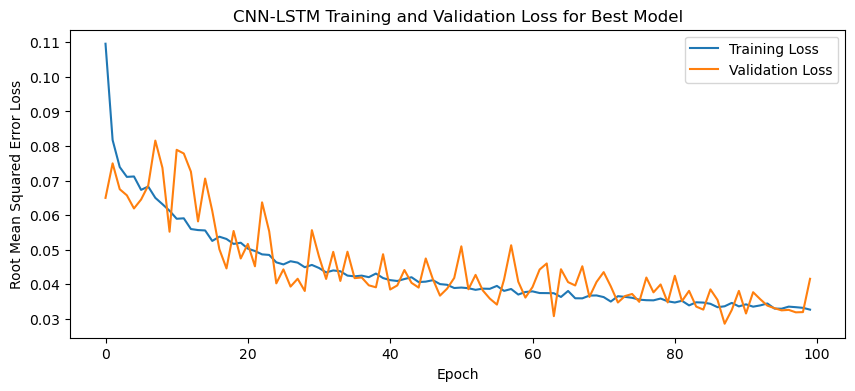

1/1 - 2s - loss: 0.0298 - 2s/epoch - 2s/step
Test Loss: 0.029794754460453987
1/1 [==============================] - 0s 38ms/step


NameError: name 'series' is not defined

In [3]:
n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit a CNN-LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    filters = trial.suggest_categorical('filters', [256, 512, 1024]) # Used for CNN-LSTM model
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM Only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "CNN-LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

# Make one forecast with a CNN-LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_cnnlstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_cnnlstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # Create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# Evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Specific Humidity")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100

# Optimize and fit the model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)
    
rmse_avg_list = []
mae_avg_list = []
mape_avg_list = []
r2_score_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (specific humidity)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction

    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse_avg_list.append(rmse_list)
    mae_avg_list.append(mae_list)
    mape_avg_list.append(mape_list)
    r2_score_avg_list.append(r2_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)

    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        
        plot_forecasts(series_ws, forecasts_ws, n_test, n_seq, n_lag)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)
            
        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='CNN-LSTM Model Comparison Specific Humidity Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No ONI)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Specific Humidity')
        plt.legend()
        plt.show()

    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'CNN-LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No ONI)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse_avg_list)
print(mae_avg_list)
print(mape_avg_list)
print(r2_score_avg_list)
print(forecast_results)
print(actual_results)
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse_avg_list)
print("Average RMSE:"+str(np.mean(rmse_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "cnnlstm_model_optimized_SH_S12_No_ONI.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)

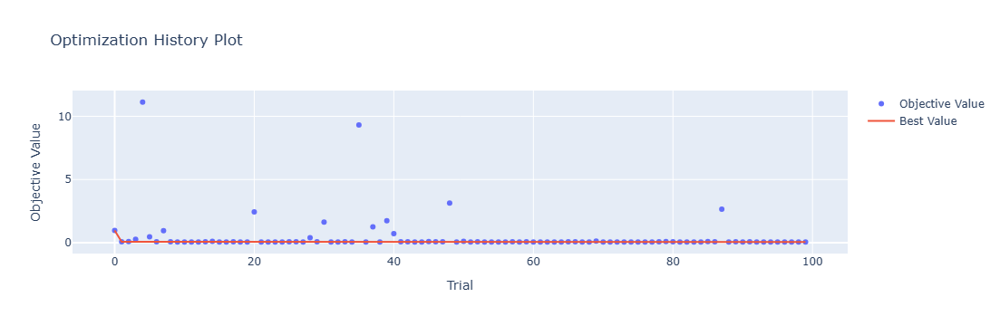

In [4]:
optuna.visualization.plot_optimization_history(study)

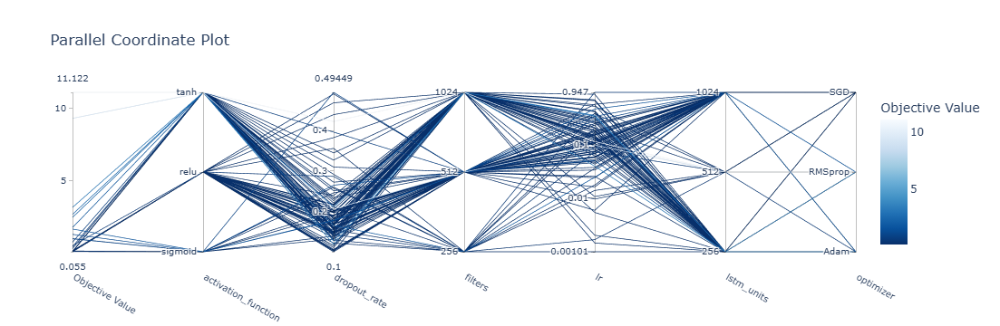

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

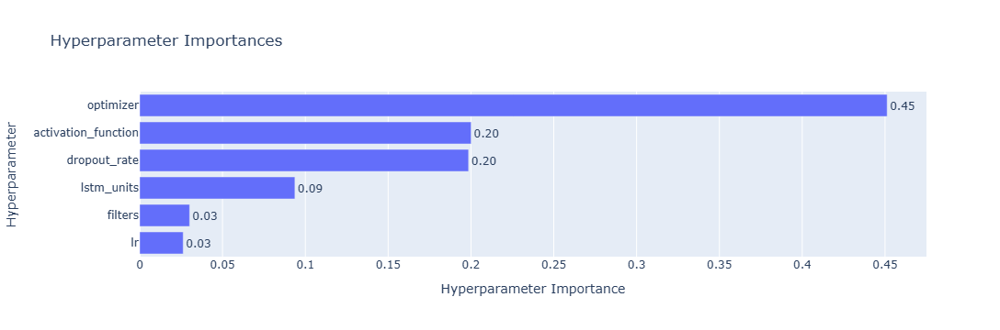

In [6]:
optuna.visualization.plot_param_importances(study)

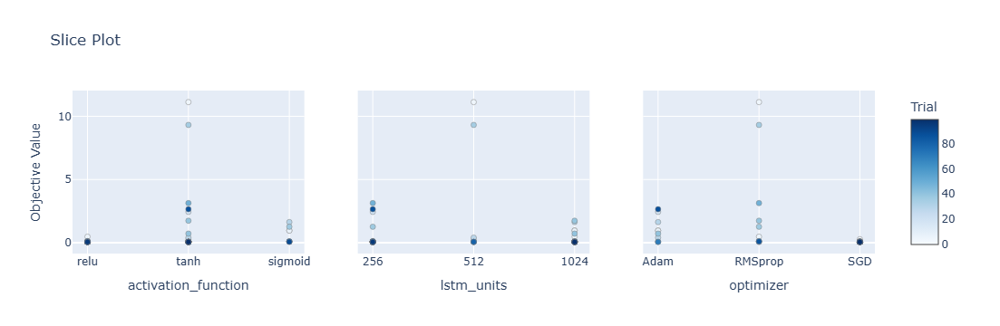

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

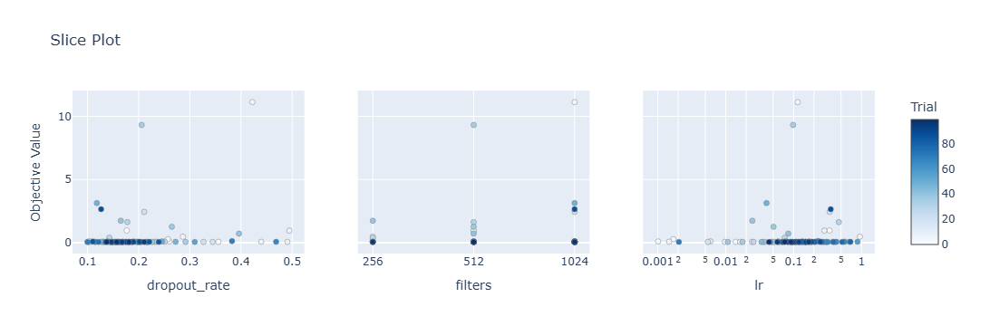

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate', 'filters'])

Epoch 1/100
84/84 [==============================] - 9s 64ms/step - loss: 0.1116 - accuracy: 0.5833 - mae: 0.0932 - rmse: 0.1116 - mape: 20.3900 - pearson: 0.6648 - val_loss: 0.0826 - val_accuracy: 0.8000 - val_mae: 0.0676 - val_rmse: 0.0826 - val_mape: 15.6632 - val_pearson: 0.6950
Epoch 2/100
84/84 [==============================] - 4s 50ms/step - loss: 0.0793 - accuracy: 0.6548 - mae: 0.0642 - rmse: 0.0793 - mape: 14.4803 - pearson: 0.7507 - val_loss: 0.0593 - val_accuracy: 0.8000 - val_mae: 0.0471 - val_rmse: 0.0593 - val_mape: 10.2003 - val_pearson: 0.7966
Epoch 3/100
84/84 [==============================] - 5s 60ms/step - loss: 0.0740 - accuracy: 0.7024 - mae: 0.0592 - rmse: 0.0740 - mape: 13.4560 - pearson: 0.7615 - val_loss: 0.0590 - val_accuracy: 0.8000 - val_mae: 0.0476 - val_rmse: 0.0590 - val_mape: 10.1766 - val_pearson: 0.8093
Epoch 4/100
84/84 [==============================] - 5s 59ms/step - loss: 0.0716 - accuracy: 0.6786 - mae: 0.0575 - rmse: 0.0716 - mape: 12.8063 - p

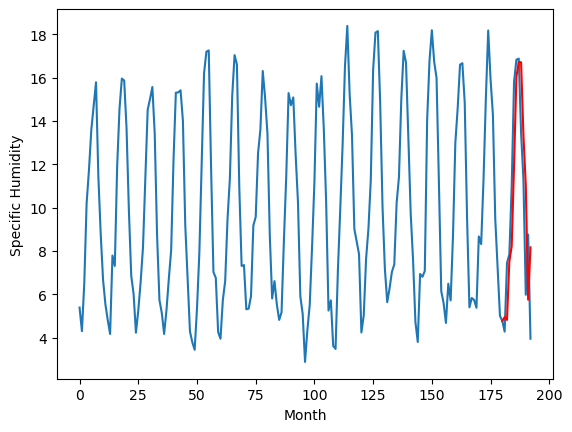

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.90		4.76		-0.14
5.61		5.50		-0.11
7.82		7.30		-0.52
8.04		7.72		-0.32
10.53		10.60		0.07
15.28		14.67		-0.61
16.08		15.47		-0.61
16.24		15.62		-0.62
14.08		13.10		-0.98
11.00		10.80		-0.20
5.34		5.33		-0.01
8.98		7.99		-0.99
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.05, 4.758169028162956, 5.502837333083153, 7.304945740103721, 7.716205868124962, 10.603142532706261, 14.671367916464806, 15.473473045229913, 15.624679926037789, 13.099842670559884, 10.79920828640461, 5.325653675198556, 7.994571092724801]


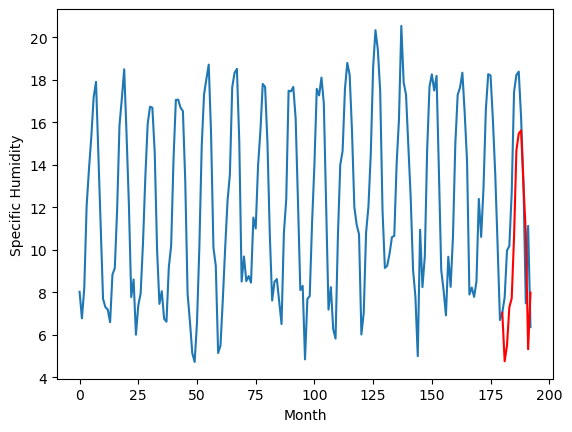

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.82		4.49		-0.33
4.97		4.83		-0.14
6.82		6.81		-0.01
7.06		7.38		0.32
9.82		10.34		0.52
14.44		14.75		0.31
16.35		15.73		-0.62
16.55		15.91		-0.64
13.55		12.90		-0.65
10.83		10.67		-0.16
4.96		4.99		0.03
7.36		7.28		-0.08
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.06, 4.489666177481413, 4.833221210688353, 6.811895860880614, 7.3801032440364365, 10.344783200472595, 14.747130288332702, 15.726502670496703, 15.906298427432777, 12.903090505450965, 10.667265682071449, 4.985991268008949, 7.279161958545448]


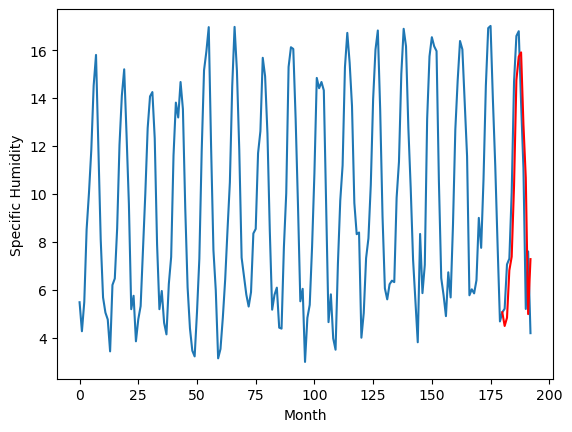

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.21		4.38		0.17
4.12		4.82		0.70
7.57		7.30		-0.27
8.14		7.78		-0.36
11.65		11.38		-0.27
15.55		15.21		-0.34
16.39		15.77		-0.62
16.01		15.75		-0.26
13.70		12.88		-0.82
11.27		10.48		-0.79
5.06		5.09		0.03
8.11		8.28		0.17
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.05, 4.37653843998909, 4.821215554475784, 7.302419587373733, 7.780367746353149, 11.380468740463257, 15.209031238555909, 15.774104311466218, 15.747758767902852, 12.88181628972292, 10.478452108204365, 5.089154622852803, 8.276162765324116]


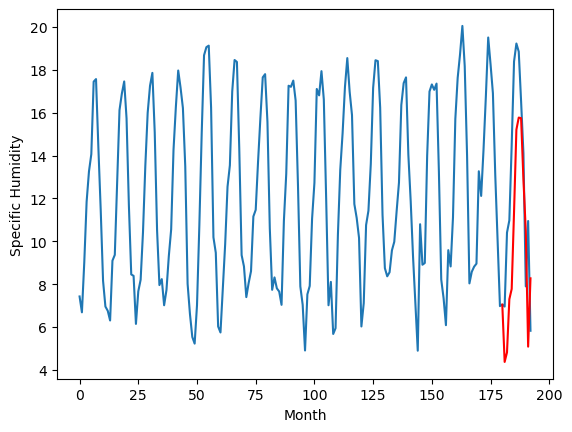

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.32		5.54		0.22
4.92		5.36		0.44
7.76		8.07		0.31
9.16		9.10		-0.06
13.17		13.32		0.15
16.86		16.81		-0.05
17.57		17.16		-0.41
17.49		17.12		-0.37
13.26		13.82		0.56
11.17		11.26		0.09
6.95		7.05		0.10
9.71		8.97		-0.74
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.2, 5.535434200763702, 5.357610478401184, 8.069783940315247, 9.09591402053833, 13.317714347839356, 16.80951584815979, 17.15764863729477, 17.119061149060727, 13.82306615203619, 11.261937774121762, 7.050357974469662, 8.966804421842099]


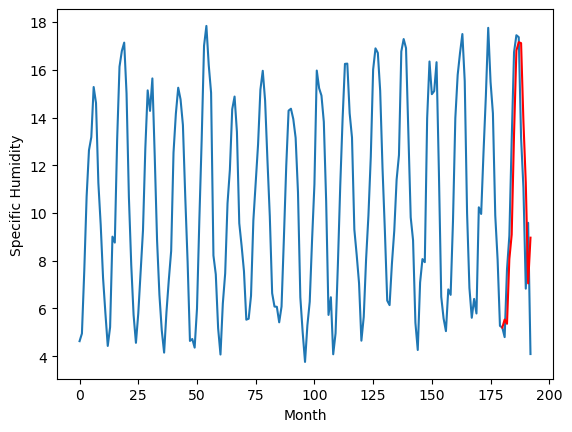

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.42		7.95		0.53
8.01		8.39		0.38
9.58		9.79		0.21
10.59		10.56		-0.03
13.09		13.02		-0.07
18.35		17.59		-0.76
19.47		18.69		-0.78
20.63		19.12		-1.51
16.54		16.29		-0.25
14.22		14.09		-0.13
8.96		8.64		-0.32
10.38		10.07		-0.31
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.16, 7.95312579602003, 8.387910744845867, 9.786990663707256, 10.560021600425243, 13.01988764733076, 17.590756139457227, 18.69045194119215, 19.122135451734067, 16.285945943295957, 14.087223580777646, 8.641700795590879, 10.074354341924192]


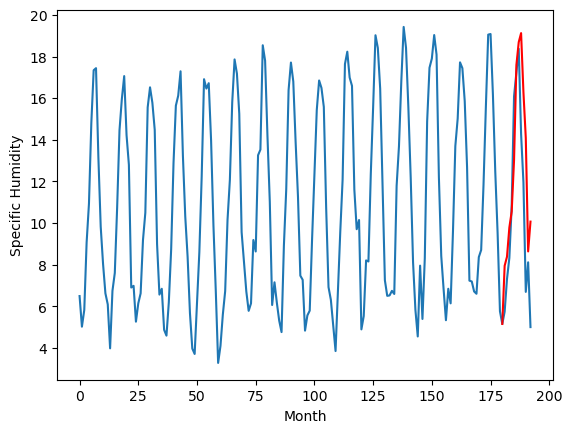

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.33		5.43		0.10
5.38		5.65		0.27
6.97		7.39		0.42
7.57		8.01		0.44
10.57		10.63		0.06
14.95		15.22		0.27
16.39		16.34		-0.05
16.92		16.61		-0.31
13.60		13.57		-0.03
11.49		11.48		-0.01
5.74		5.82		0.08
7.58		7.58		-0.00
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.05, 5.4255799199640755, 5.6545377816259865, 7.387486084848643, 8.00879810705781, 10.634255632311106, 15.218149885088206, 16.339045390039683, 16.607466563135386, 13.574558123499155, 11.484392508417368, 5.822648390680552, 7.575557931810618]


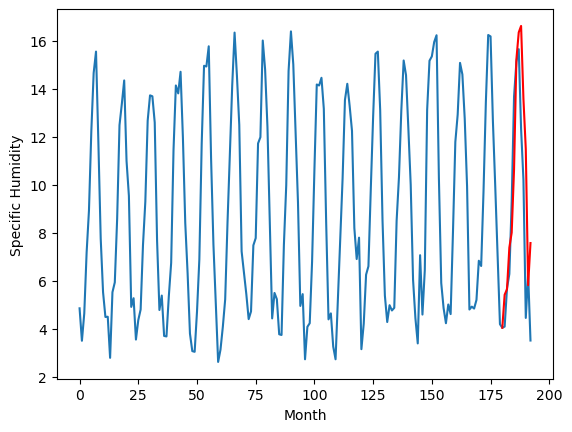

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.12		7.28		0.16
7.15		7.42		0.27
8.77		9.06		0.29
9.47		9.82		0.35
12.49		12.24		-0.25
16.76		16.99		0.23
18.26		18.18		-0.08
18.54		18.55		0.01
15.05		15.45		0.40
13.17		13.48		0.31
7.38		7.79		0.41
9.15		9.23		0.08
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.64, 7.284937314987182, 7.42262948334217, 9.060753353238105, 9.823522813916206, 12.243902452588081, 16.993819959759712, 18.179715521931648, 18.554251261353492, 15.4508929926157, 13.480375834107399, 7.793203421235084, 9.225993223786354]


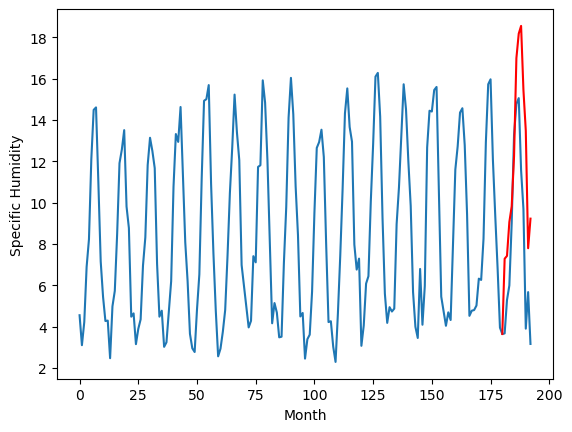

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.40		4.59		0.19
3.72		4.21		0.49
6.78		6.69		-0.09
7.51		7.53		0.02
10.42		10.72		0.30
15.40		15.22		-0.18
16.90		16.19		-0.71
17.09		16.28		-0.81
13.28		12.72		-0.56
10.86		10.70		-0.16
5.57		5.29		-0.28
7.16		6.82		-0.34
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.46, 4.593951293379068, 4.213257410675287, 6.686509707123041, 7.5282724882662295, 10.720034458786248, 15.2159393812716, 16.19002828851342, 16.27860765263438, 12.71615295216441, 10.695203350037335, 5.290761039704083, 6.8222588758170595]


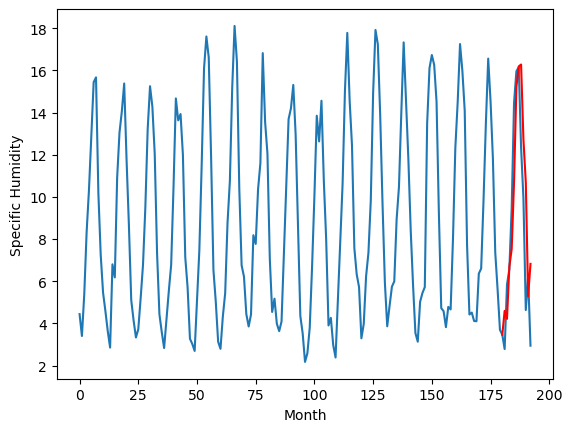

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.17		6.30		0.13
5.72		5.99		0.27
7.52		7.95		0.43
8.84		8.97		0.13
10.93		11.26		0.33
15.70		16.25		0.55
16.63		17.35		0.72
17.05		17.82		0.77
13.88		14.32		0.44
12.57		12.75		0.18
7.05		6.93		-0.12
7.89		8.01		0.12
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.93, 6.304895922541618, 5.991339638829231, 7.945535257458687, 8.974190548062325, 11.26288516819477, 16.25387580692768, 17.353922560811043, 17.81532995402813, 14.317277356982231, 12.746598288416862, 6.929070994257927, 8.01336781680584]


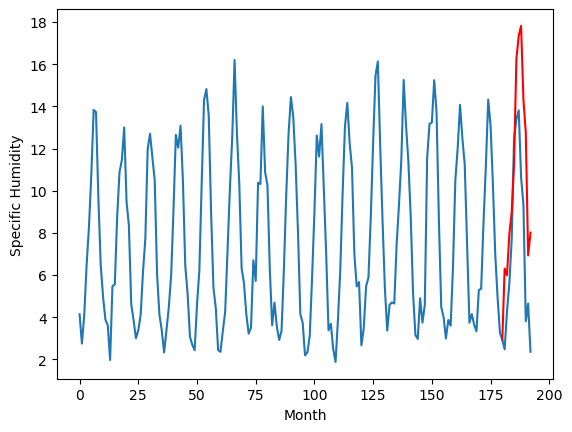

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.48		4.62		0.14
3.74		4.13		0.39
5.36		5.85		0.49
6.96		7.15		0.19
8.48		9.12		0.64
13.61		13.99		0.38
14.68		14.97		0.29
15.17		15.68		0.51
11.55		12.25		0.70
10.56		10.95		0.39
5.71		5.71		0.00
5.71		5.85		0.14
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.74, 4.620442078113556, 4.125092551708222, 5.851525709629059, 7.1496913886070255, 9.118329927921295, 13.989400312900543, 14.974225387573242, 15.683287904262542, 12.25197438955307, 10.948450491428375, 5.712198660373687, 5.848517984747886]


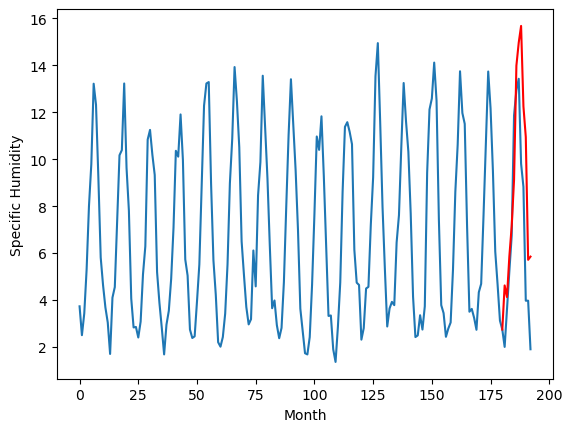

RangeIndex(start=1, stop=12, step=1)
[4.62, 4.899999999999999, 4.820000000000001, 4.209999999999998, 5.32, 7.42, 5.33, 7.119999999999999, 4.4, 6.170000000000001, 4.48]
[4.949015386998654, 4.758169028162956, 4.489666177481413, 4.37653843998909, 5.535434200763702, 7.95312579602003, 5.4255799199640755, 7.284937314987182, 4.593951293379068, 6.304895922541618, 4.620442078113556]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.62   4.949015
1                 1    4.90   4.758169
2                 2    4.82   4.489666
3                 3    4.21   4.376538
4                 4    5.32   5.535434
5                 5    7.42   7.953126
6                 6    5.33   5.425580
7                 7    7.12   7.284937
8                 8    4.40   4.593951
9                 9    6.17   6.304896
10               10    4.48   4.620442


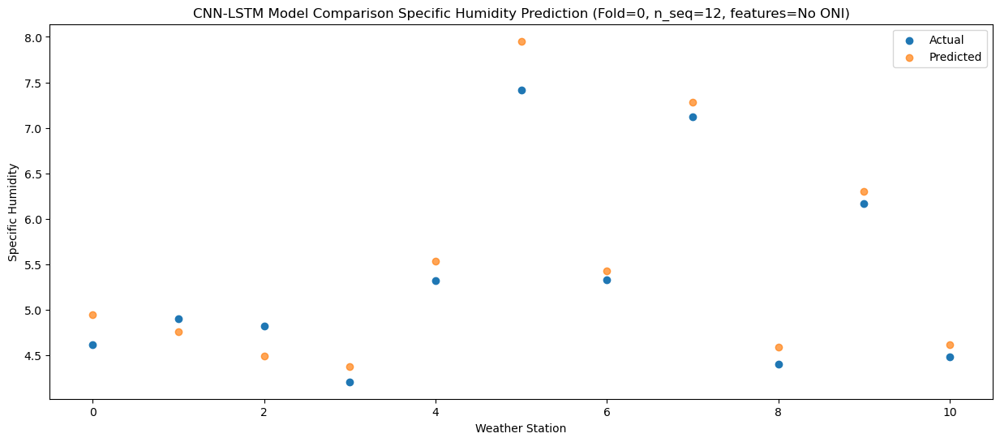

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.13   4.819660
1                 1    5.61   5.502837
2                 2    4.97   4.833221
3                 3    4.12   4.821216
4                 4    4.92   5.357610
5                 5    8.01   8.387911
6                 6    5.38   5.654538
7                 7    7.15   7.422629
8                 8    3.72   4.213257
9                 9    5.72   5.991340
10               10    3.74   4.125093


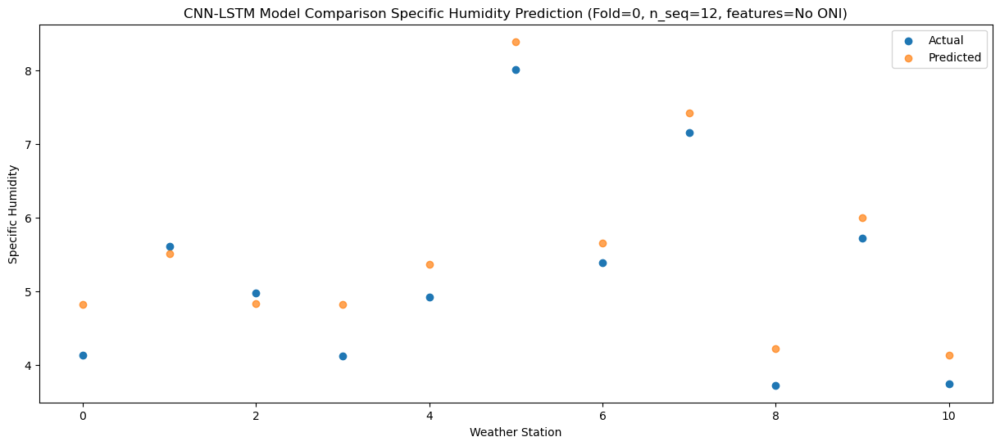

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.30   7.518417
1                 1    7.82   7.304946
2                 2    6.82   6.811896
3                 3    7.57   7.302420
4                 4    7.76   8.069784
5                 5    9.58   9.786991
6                 6    6.97   7.387486
7                 7    8.77   9.060753
8                 8    6.78   6.686510
9                 9    7.52   7.945535
10               10    5.36   5.851526


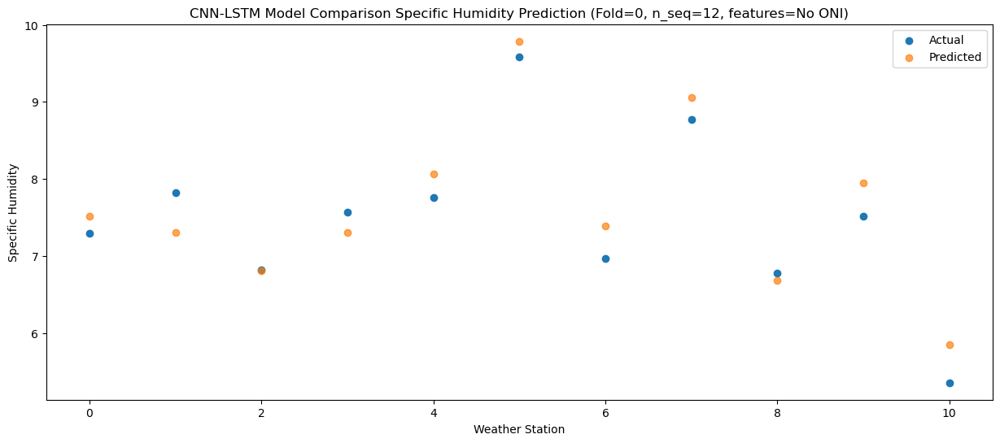

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.69   8.220598
1                 1    8.04   7.716206
2                 2    7.06   7.380103
3                 3    8.14   7.780368
4                 4    9.16   9.095914
5                 5   10.59  10.560022
6                 6    7.57   8.008798
7                 7    9.47   9.823523
8                 8    7.51   7.528272
9                 9    8.84   8.974191
10               10    6.96   7.149691


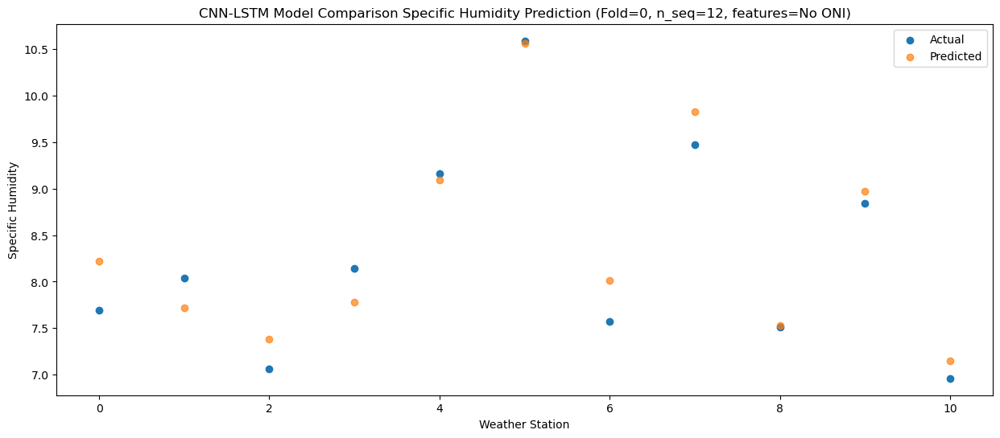

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.84  11.958182
1                 1   10.53  10.603143
2                 2    9.82  10.344783
3                 3   11.65  11.380469
4                 4   13.17  13.317714
5                 5   13.09  13.019888
6                 6   10.57  10.634256
7                 7   12.49  12.243902
8                 8   10.42  10.720034
9                 9   10.93  11.262885
10               10    8.48   9.118330


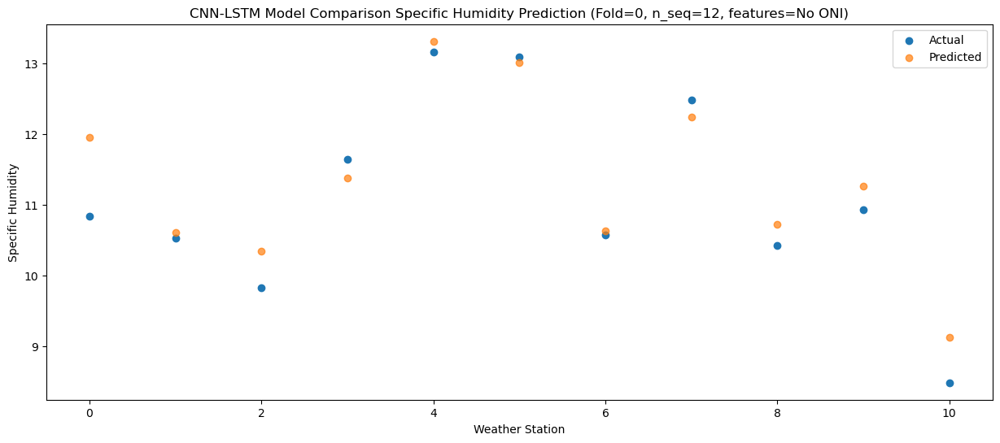

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   15.65  16.033839
1                 1   15.28  14.671368
2                 2   14.44  14.747130
3                 3   15.55  15.209031
4                 4   16.86  16.809516
5                 5   18.35  17.590756
6                 6   14.95  15.218150
7                 7   16.76  16.993820
8                 8   15.40  15.215939
9                 9   15.70  16.253876
10               10   13.61  13.989400


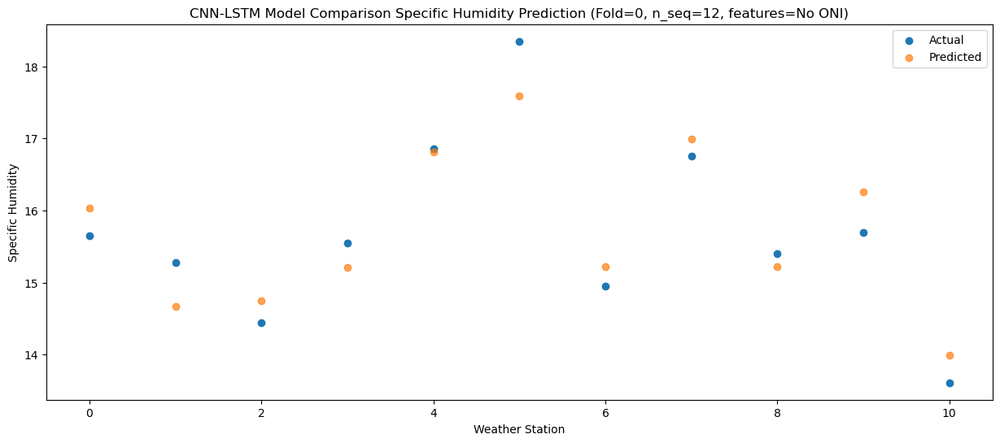

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   16.68  16.721356
1                 1   16.08  15.473473
2                 2   16.35  15.726503
3                 3   16.39  15.774104
4                 4   17.57  17.157649
5                 5   19.47  18.690452
6                 6   16.39  16.339045
7                 7   18.26  18.179716
8                 8   16.90  16.190028
9                 9   16.63  17.353923
10               10   14.68  14.974225


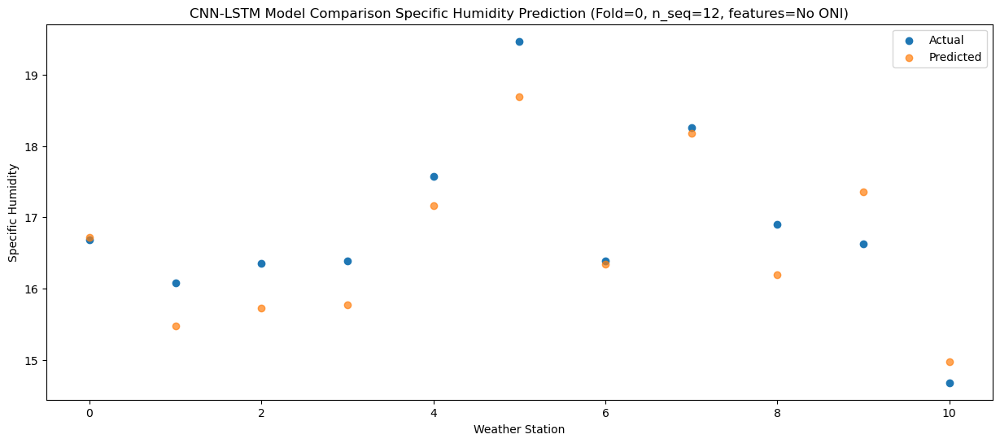

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   16.73  16.712958
1                 1   16.24  15.624680
2                 2   16.55  15.906298
3                 3   16.01  15.747759
4                 4   17.49  17.119061
5                 5   20.63  19.122135
6                 6   16.92  16.607467
7                 7   18.54  18.554251
8                 8   17.09  16.278608
9                 9   17.05  17.815330
10               10   15.17  15.683288


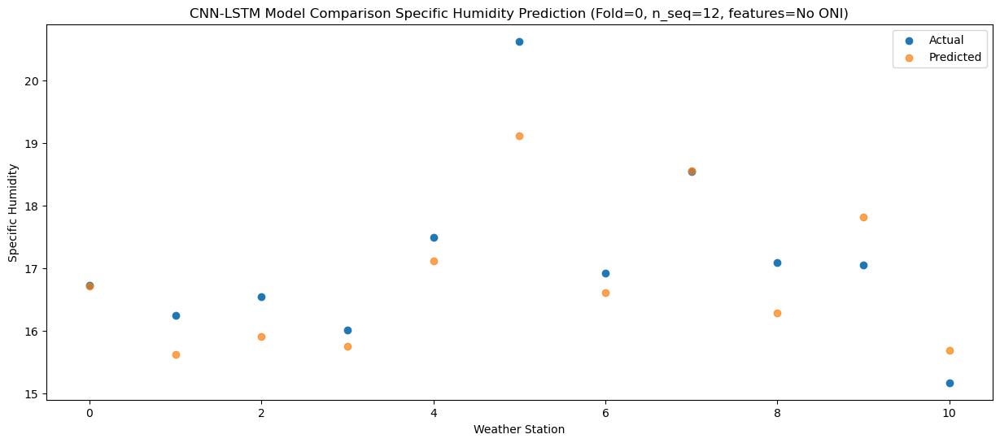

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   13.31  13.335240
1                 1   14.08  13.099843
2                 2   13.55  12.903091
3                 3   13.70  12.881816
4                 4   13.26  13.823066
5                 5   16.54  16.285946
6                 6   13.60  13.574558
7                 7   15.05  15.450893
8                 8   13.28  12.716153
9                 9   13.88  14.317277
10               10   11.55  12.251974


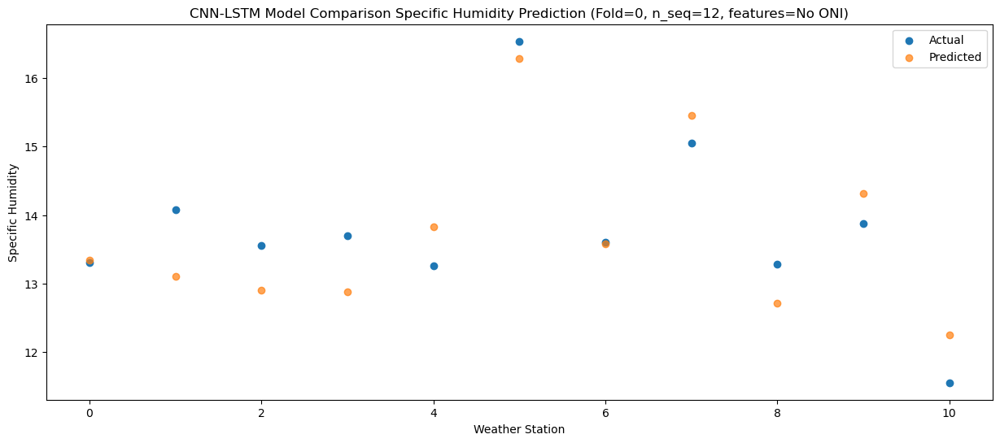

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   11.13  11.018405
1                 1   11.00  10.799208
2                 2   10.83  10.667266
3                 3   11.27  10.478452
4                 4   11.17  11.261938
5                 5   14.22  14.087224
6                 6   11.49  11.484393
7                 7   13.17  13.480376
8                 8   10.86  10.695203
9                 9   12.57  12.746598
10               10   10.56  10.948450


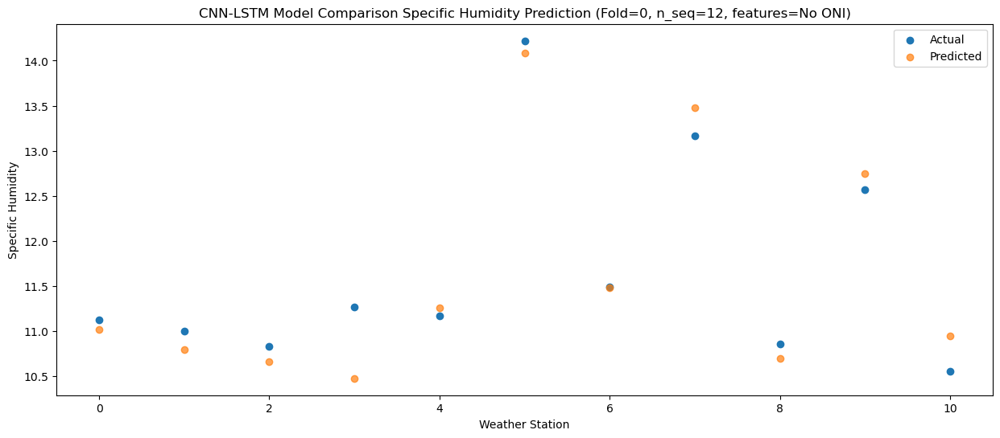

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    5.83   5.751717
1                 1    5.34   5.325654
2                 2    4.96   4.985991
3                 3    5.06   5.089155
4                 4    6.95   7.050358
5                 5    8.96   8.641701
6                 6    5.74   5.822648
7                 7    7.38   7.793203
8                 8    5.57   5.290761
9                 9    7.05   6.929071
10               10    5.71   5.712199


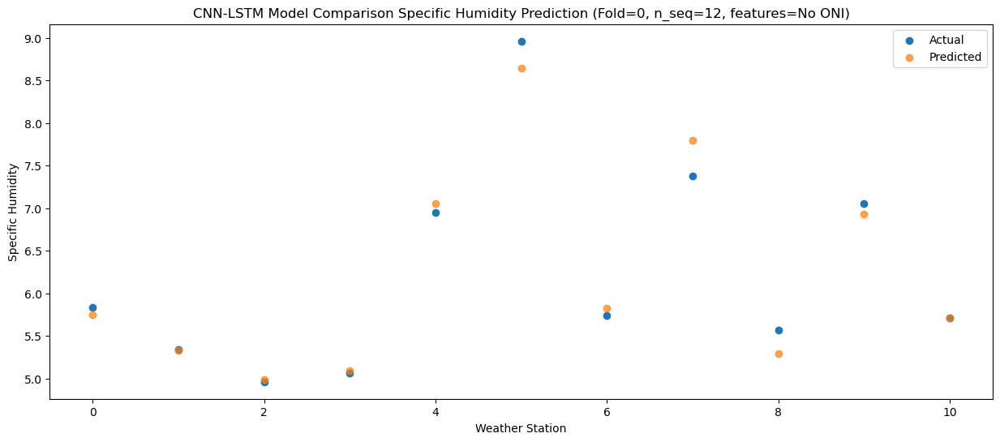

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    8.61   8.169341
1                 1    8.98   7.994571
2                 2    7.36   7.279162
3                 3    8.11   8.276163
4                 4    9.71   8.966804
5                 5   10.38  10.074354
6                 6    7.58   7.575558
7                 7    9.15   9.225993
8                 8    7.16   6.822259
9                 9    7.89   8.013368
10               10    5.71   5.848518


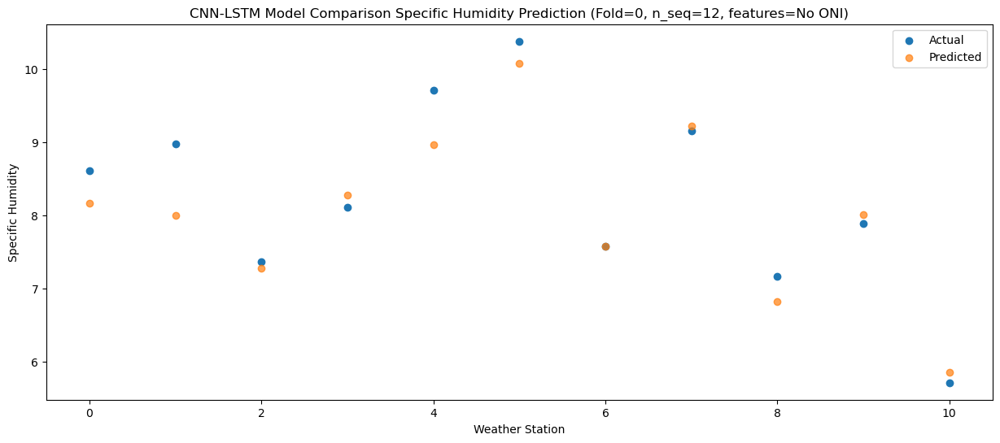

Model: "sequential_501"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_501 (Conv1D)         (None, 1, 1024)           2017280   
                                                                 
 max_pooling1d_501 (MaxPooli  (None, 1, 1024)          0         
 ng1D)                                                           
                                                                 
 dropout_1503 (Dropout)      (None, 1, 1024)           0         
                                                                 
 lstm_1002 (LSTM)            (None, 1, 1024)           8392704   
                                                                 
 dropout_1504 (Dropout)      (None, 1, 1024)           0         
                                                                 
 lstm_1003 (LSTM)            (None, 1024)              8392704   
                                                    

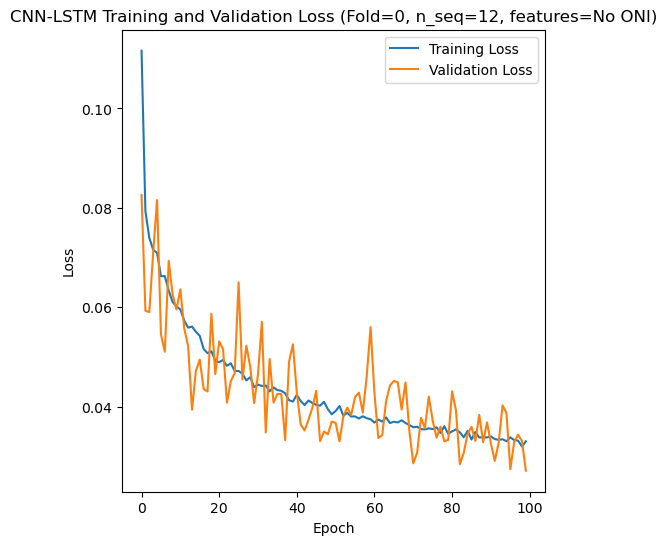

Epoch 1/100
84/84 [==============================] - 10s 62ms/step - loss: 0.1090 - accuracy: 0.6071 - mae: 0.0904 - rmse: 0.1090 - mape: 19.4240 - pearson: 0.6688 - val_loss: 0.0688 - val_accuracy: 0.7000 - val_mae: 0.0560 - val_rmse: 0.0688 - val_mape: 12.3568 - val_pearson: 0.7558
Epoch 2/100
84/84 [==============================] - 4s 44ms/step - loss: 0.0773 - accuracy: 0.7143 - mae: 0.0613 - rmse: 0.0773 - mape: 13.9879 - pearson: 0.7541 - val_loss: 0.0598 - val_accuracy: 0.7000 - val_mae: 0.0484 - val_rmse: 0.0598 - val_mape: 11.1313 - val_pearson: 0.8048
Epoch 3/100
84/84 [==============================] - 4s 43ms/step - loss: 0.0728 - accuracy: 0.7262 - mae: 0.0585 - rmse: 0.0728 - mape: 13.2607 - pearson: 0.7776 - val_loss: 0.0581 - val_accuracy: 0.7000 - val_mae: 0.0463 - val_rmse: 0.0581 - val_mape: 10.6538 - val_pearson: 0.8000
Epoch 4/100
84/84 [==============================] - 4s 45ms/step - loss: 0.0687 - accuracy: 0.7500 - mae: 0.0537 - rmse: 0.0687 - mape: 12.0430 - 

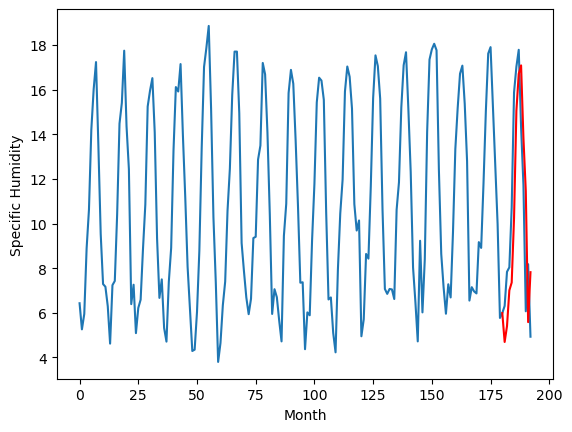

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.34		4.21		-0.13
4.53		4.61		0.08
6.06		6.54		0.48
6.42		6.93		0.51
9.34		10.05		0.71
13.32		14.98		1.66
15.19		16.64		1.45
15.40		16.87		1.47
12.45		13.28		0.83
10.41		11.05		0.64
4.82		4.96		0.14
6.99		7.28		0.29
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.15, 4.207411706149578, 4.6097686883807185, 6.541706978976727, 6.929714888036251, 10.046159237325192, 14.979809730947018, 16.6387397941947, 16.873492568433285, 13.279453366696835, 11.049444287717343, 4.964686006009579, 7.275040477216244]


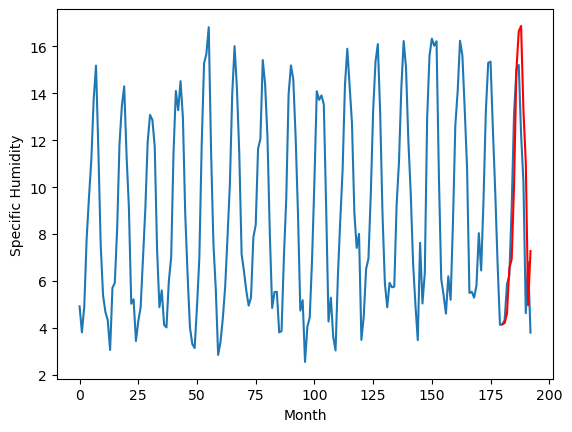

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.22		3.08		-0.14
3.22		3.58		0.36
5.84		5.77		-0.07
5.55		6.01		0.46
8.39		9.46		1.07
12.91		14.25		1.34
14.50		15.85		1.35
14.72		15.91		1.19
11.96		12.38		0.42
9.21		9.93		0.72
3.71		3.85		0.14
6.35		6.66		0.31
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.12, 3.079646015241742, 3.5820297241955994, 5.773236417844892, 6.0126201153546575, 9.457585477903486, 14.252038145139814, 15.853380584791303, 15.912613121494651, 12.376840321049094, 9.925842968448997, 3.8491890110820535, 6.657666174396873]


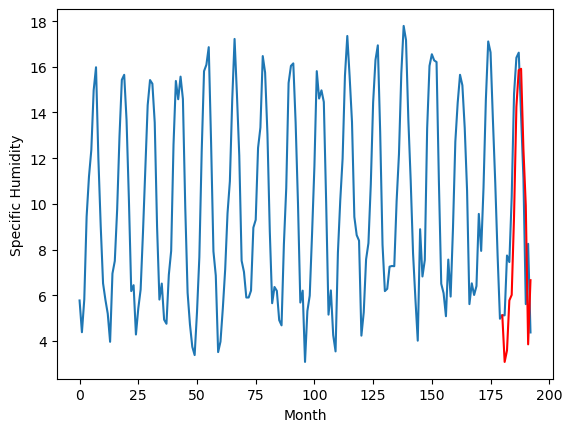

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.03		2.46		0.43
2.10		2.59		0.49
4.74		5.22		0.48
6.08		5.64		-0.44
9.97		9.85		-0.12
13.16		13.94		0.78
13.64		15.16		1.52
13.98		14.96		0.98
10.89		11.28		0.39
8.64		8.59		-0.05
4.19		3.86		-0.33
7.11		6.28		-0.83
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.35, 2.457658017873764, 2.586659724712372, 5.218928153514862, 5.642054612636566, 9.848152215480805, 13.938727433681489, 15.163635785579682, 14.964572231173516, 11.281232873797418, 8.593767682909967, 3.8614845675230036, 6.279553691744805]


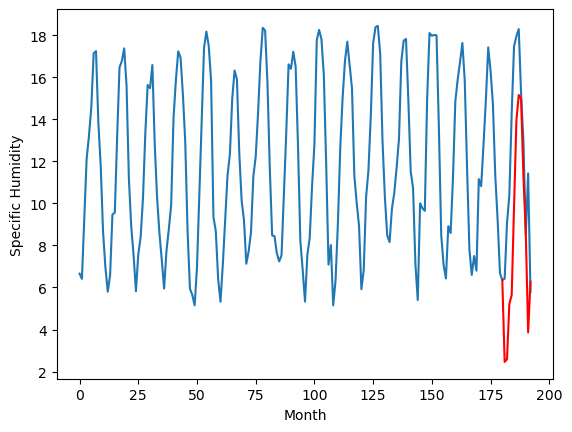

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.18		6.47		0.29
6.22		6.53		0.31
8.94		9.23		0.29
10.20		9.70		-0.50
14.23		13.97		-0.26
17.64		18.12		0.48
17.82		19.30		1.48
17.86		19.16		1.30
14.76		15.35		0.59
12.81		12.68		-0.13
8.22		7.91		-0.31
11.15		10.32		-0.83
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.08, 6.473251544237137, 6.525132630318403, 9.228432867974043, 9.699304137676954, 13.974338565319776, 18.123232398480177, 19.30475512549281, 19.163859788626432, 15.346861545294523, 12.683769885748625, 7.906463329046964, 10.316938344687223]


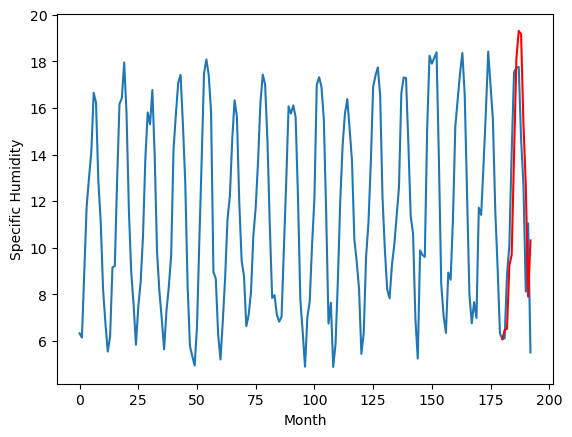

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.75		5.04		-0.71
5.12		4.83		-0.29
5.91		6.69		0.78
7.21		7.26		0.05
11.52		10.83		-0.69
13.69		14.23		0.54
15.02		15.72		0.70
15.24		15.32		0.08
11.70		12.14		0.44
8.59		9.70		1.11
6.75		6.61		-0.14
5.70		7.17		1.47
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.92, 5.036449914872646, 4.8342979606986045, 6.693906014859676, 7.258245294988155, 10.8288698849082, 14.231646603047848, 15.716563647687435, 15.315542107522488, 12.135892516076565, 9.703956252038479, 6.611170178353786, 7.17479307025671]


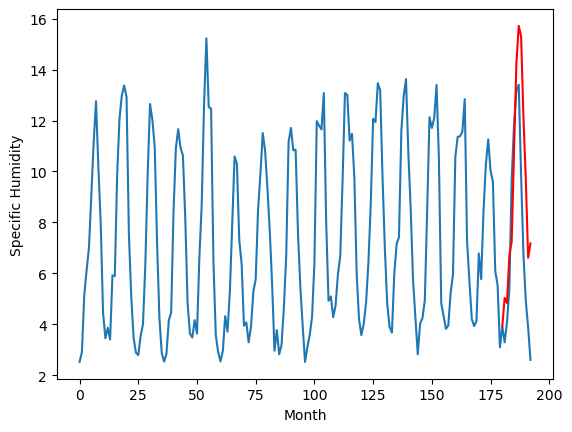

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.66		5.62		-0.04
5.78		6.01		0.23
7.34		7.88		0.54
7.96		8.31		0.35
10.89		11.36		0.47
15.24		16.31		1.07
17.74		17.99		0.25
18.03		18.26		0.23
14.68		14.66		-0.02
12.55		12.45		-0.10
6.62		6.41		-0.21
8.49		8.60		0.11
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.16, 5.623743821382522, 6.014692713022232, 7.8806603443622585, 8.308812190294265, 11.3631616127491, 16.305190612077713, 17.993135977983474, 18.2612893474102, 14.656630982160568, 12.451192368268966, 6.41497897028923, 8.596666563749313]


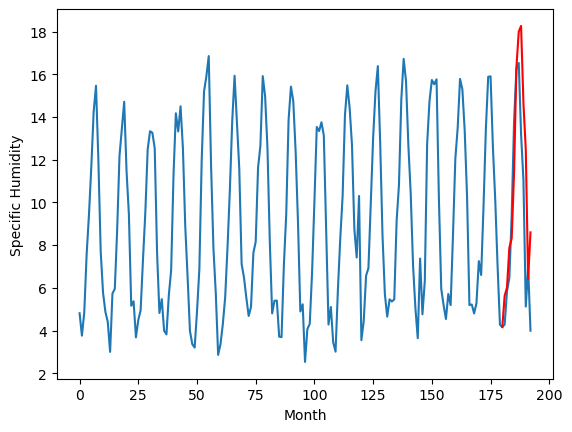

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.53		6.53		-0.00
6.01		6.29		0.28
8.74		8.93		0.19
9.97		9.55		-0.42
13.18		13.45		0.27
17.94		18.09		0.15
18.57		19.57		1.00
18.42		19.47		1.05
15.17		15.30		0.13
12.44		13.00		0.56
7.88		7.67		-0.21
9.52		9.47		-0.05
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.84, 6.5251572316885, 6.293602380752564, 8.931951913833618, 9.549930486679077, 13.452922973632813, 18.089537773132324, 19.566070828437805, 19.470923382639885, 15.303858715891838, 12.99522991836071, 7.667878348231316, 9.473224479556084]


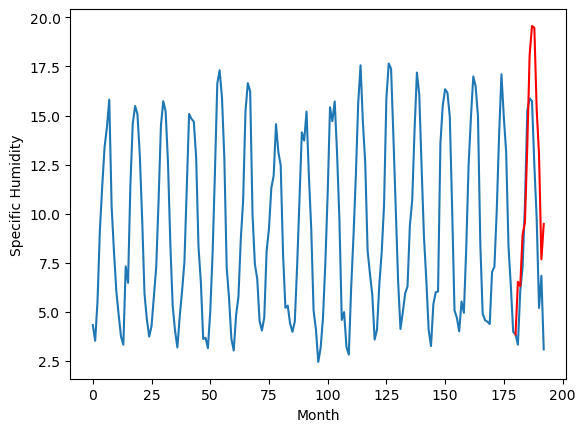

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.49		6.25		-0.24
5.68		5.64		-0.04
8.29		8.31		0.02
9.45		9.04		-0.41
13.67		13.34		-0.33
16.81		17.19		0.38
17.86		18.55		0.69
17.44		18.16		0.72
13.87		14.05		0.18
11.43		11.60		0.17
7.90		7.83		-0.07
7.29		8.54		1.25
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.73, 6.2518351393938065, 5.641348930001259, 8.311866374611855, 9.035453887581825, 13.335937114357948, 17.192886443734167, 18.54571911871433, 18.16091978728771, 14.054858328700064, 11.600895287394522, 7.827768446803091, 8.539595963358877]


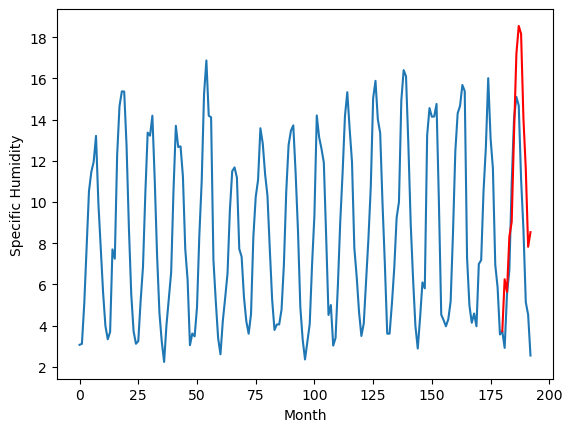

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.71		2.64		-0.07
1.97		2.09		0.12
3.79		4.19		0.40
3.96		4.66		0.70
9.11		8.44		-0.67
12.10		11.70		-0.40
13.34		13.39		0.05
12.31		12.61		0.30
9.35		9.26		-0.09
5.91		6.93		1.02
3.55		4.04		0.49
2.57		4.03		1.46
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.83, 2.635717090666294, 2.0944325295090676, 4.194665369093418, 4.658444282114505, 8.437721845209598, 11.703339454233646, 13.389222618639469, 12.611402925550937, 9.261310752928257, 6.927249845564365, 4.038874563276767, 4.033855381403118]


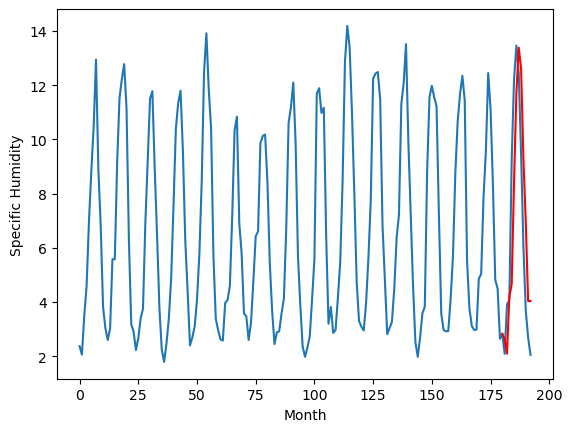

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.08		4.28		0.20
4.12		4.29		0.17
5.36		5.54		0.18
6.73		6.58		-0.15
8.26		8.69		0.43
13.58		13.71		0.13
15.44		15.55		0.11
15.78		16.26		0.48
12.59		12.65		0.06
10.73		10.96		0.23
5.54		5.46		-0.08
5.42		5.92		0.50
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.69, 4.281863269805908, 4.293812171965837, 5.537858025580644, 6.580061928778886, 8.690218941718339, 13.709975735694169, 15.552199022322892, 16.258022801429032, 12.652577416449784, 10.955126421004532, 5.458938257247208, 5.923130945712327]


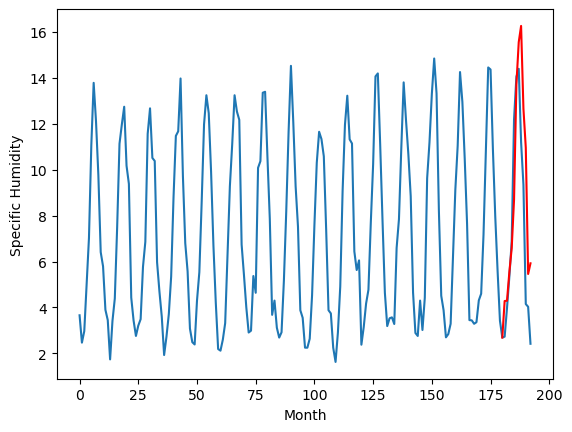

RangeIndex(start=1, stop=12, step=1)
[5.03, 4.340000000000002, 3.2199999999999998, 2.0299999999999994, 6.18, 5.75, 5.66, 6.529999999999999, 6.49, 2.7100000000000004, 4.079999999999999]
[4.694457692503929, 4.207411706149578, 3.079646015241742, 2.457658017873764, 6.473251544237137, 5.036449914872646, 5.623743821382522, 6.5251572316885, 6.2518351393938065, 2.635717090666294, 4.281863269805908]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    5.03   4.694458
1                 1    4.34   4.207412
2                 2    3.22   3.079646
3                 3    2.03   2.457658
4                 4    6.18   6.473252
5                 5    5.75   5.036450
6                 6    5.66   5.623744
7                 7    6.53   6.525157
8                 8    6.49   6.251835
9                 9    2.71   2.635717
10               10    4.08   4.281863


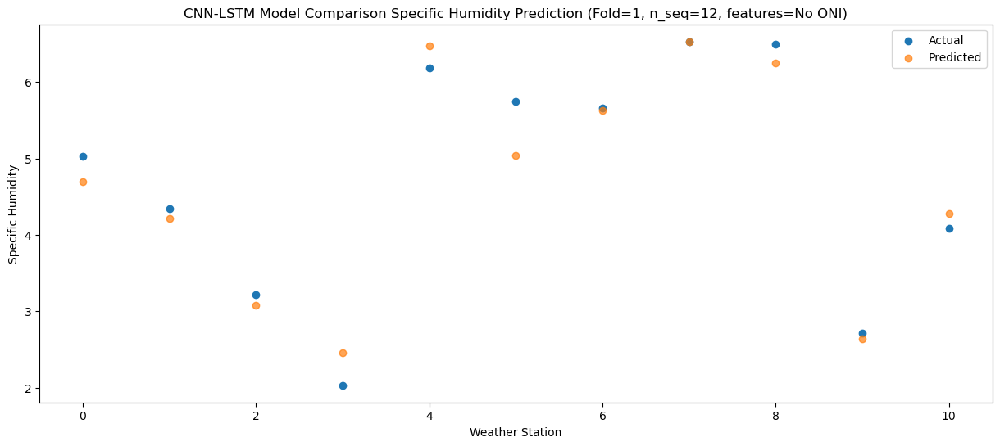

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    5.35   5.403375
1                 1    4.53   4.609769
2                 2    3.22   3.582030
3                 3    2.10   2.586660
4                 4    6.22   6.525133
5                 5    5.12   4.834298
6                 6    5.78   6.014693
7                 7    6.01   6.293602
8                 8    5.68   5.641349
9                 9    1.97   2.094433
10               10    4.12   4.293812


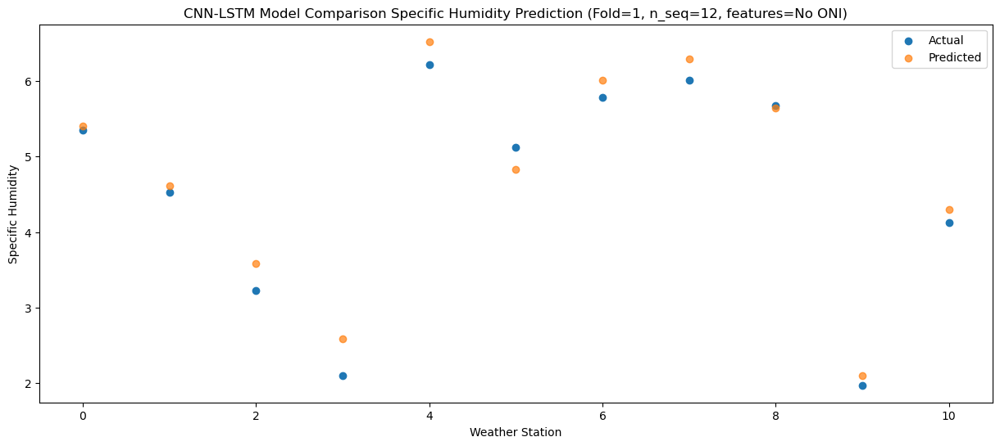

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    6.88   7.006527
1                 1    6.06   6.541707
2                 2    5.84   5.773236
3                 3    4.74   5.218928
4                 4    8.94   9.228433
5                 5    5.91   6.693906
6                 6    7.34   7.880660
7                 7    8.74   8.931952
8                 8    8.29   8.311866
9                 9    3.79   4.194665
10               10    5.36   5.537858


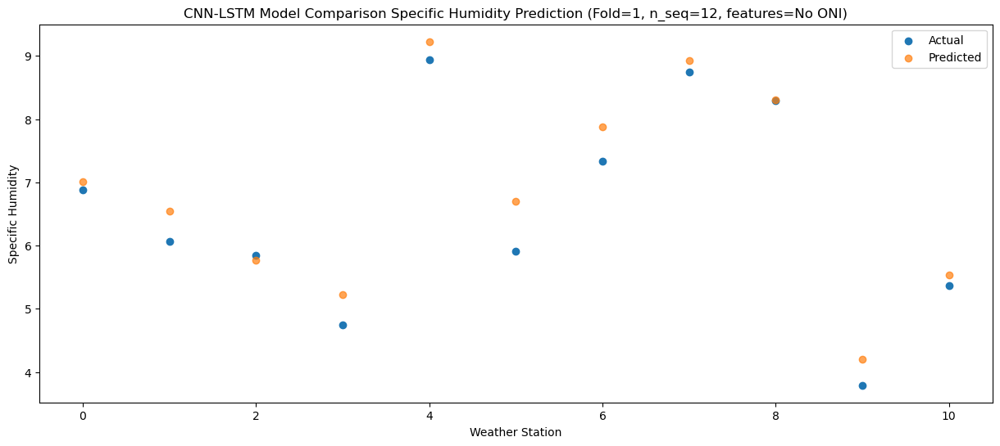

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.08   7.358096
1                 1    6.42   6.929715
2                 2    5.55   6.012620
3                 3    6.08   5.642055
4                 4   10.20   9.699304
5                 5    7.21   7.258245
6                 6    7.96   8.308812
7                 7    9.97   9.549930
8                 8    9.45   9.035454
9                 9    3.96   4.658444
10               10    6.73   6.580062


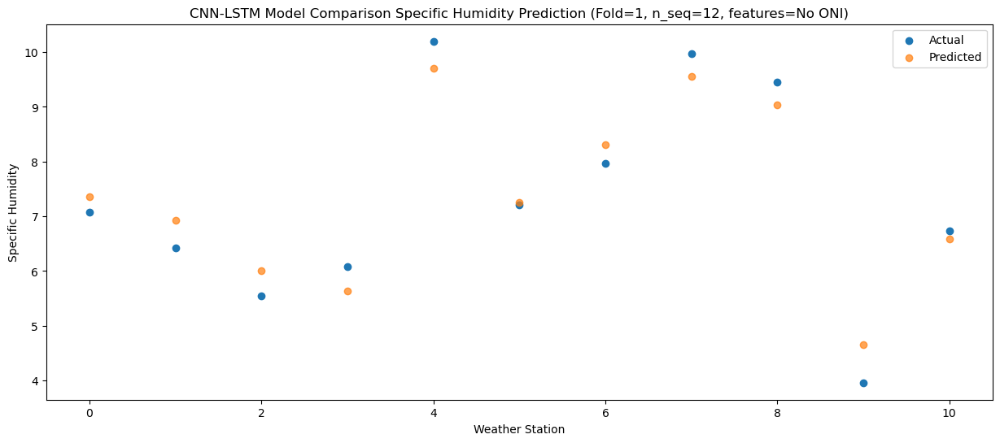

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    9.76  10.250989
1                 1    9.34  10.046159
2                 2    8.39   9.457585
3                 3    9.97   9.848152
4                 4   14.23  13.974339
5                 5   11.52  10.828870
6                 6   10.89  11.363162
7                 7   13.18  13.452923
8                 8   13.67  13.335937
9                 9    9.11   8.437722
10               10    8.26   8.690219


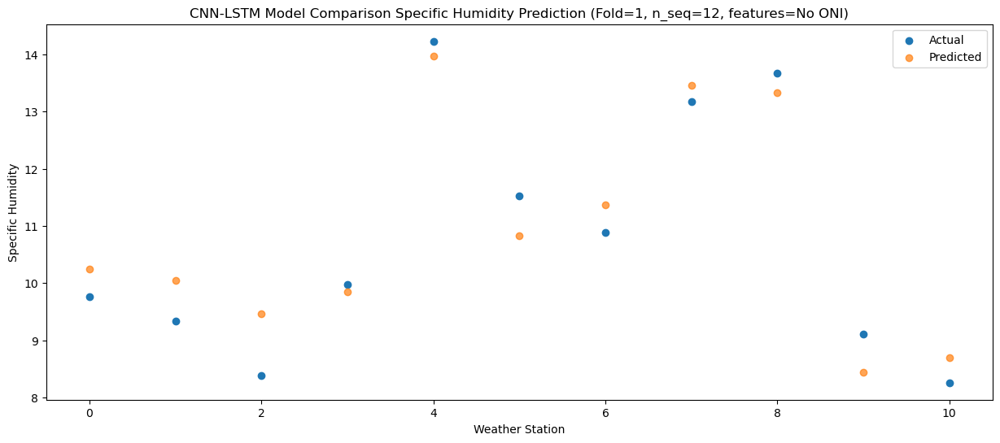

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   14.92  15.054028
1                 1   13.32  14.979810
2                 2   12.91  14.252038
3                 3   13.16  13.938727
4                 4   17.64  18.123232
5                 5   13.69  14.231647
6                 6   15.24  16.305191
7                 7   17.94  18.089538
8                 8   16.81  17.192886
9                 9   12.10  11.703339
10               10   13.58  13.709976


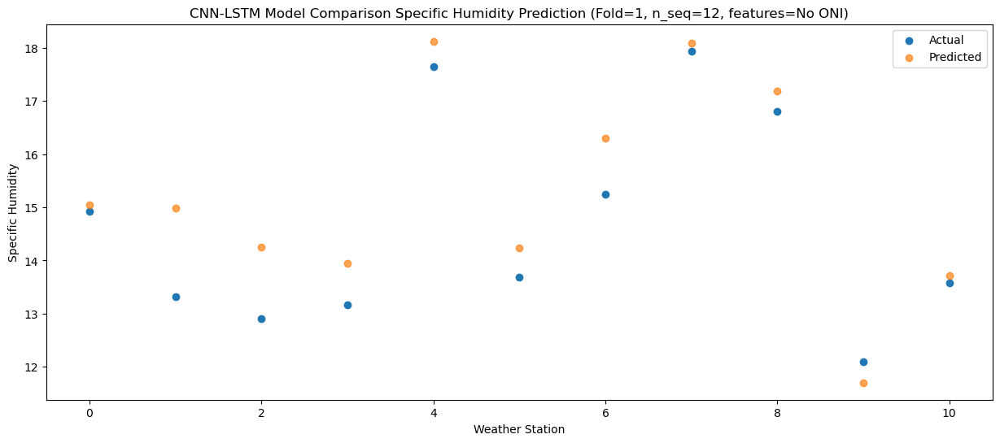

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   16.07  16.712414
1                 1   15.19  16.638740
2                 2   14.50  15.853381
3                 3   13.64  15.163636
4                 4   17.82  19.304755
5                 5   15.02  15.716564
6                 6   17.74  17.993136
7                 7   18.57  19.566071
8                 8   17.86  18.545719
9                 9   13.34  13.389223
10               10   15.44  15.552199


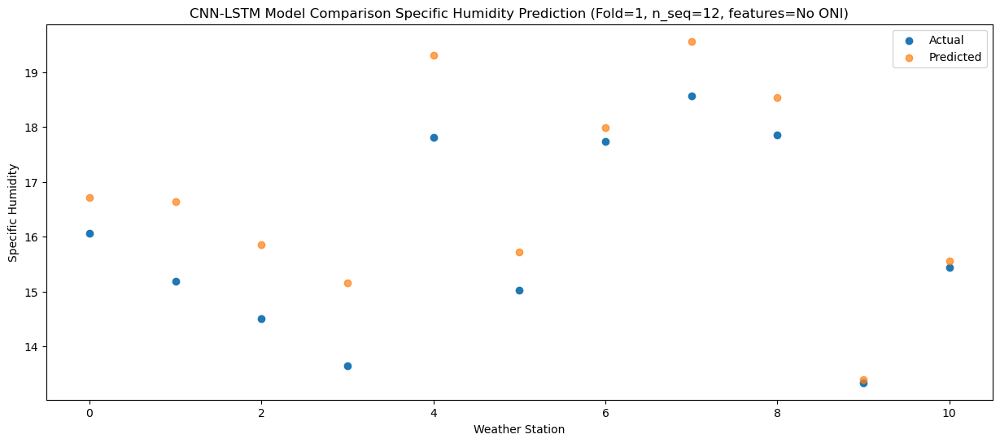

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   16.83  17.090228
1                 1   15.40  16.873493
2                 2   14.72  15.912613
3                 3   13.98  14.964572
4                 4   17.86  19.163860
5                 5   15.24  15.315542
6                 6   18.03  18.261289
7                 7   18.42  19.470923
8                 8   17.44  18.160920
9                 9   12.31  12.611403
10               10   15.78  16.258023


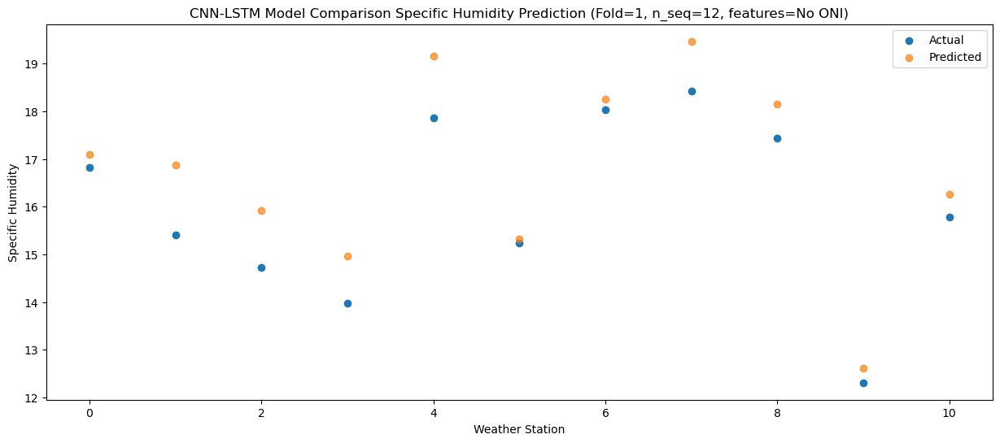

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   13.35  13.836338
1                 1   12.45  13.279453
2                 2   11.96  12.376840
3                 3   10.89  11.281233
4                 4   14.76  15.346862
5                 5   11.70  12.135893
6                 6   14.68  14.656631
7                 7   15.17  15.303859
8                 8   13.87  14.054858
9                 9    9.35   9.261311
10               10   12.59  12.652577


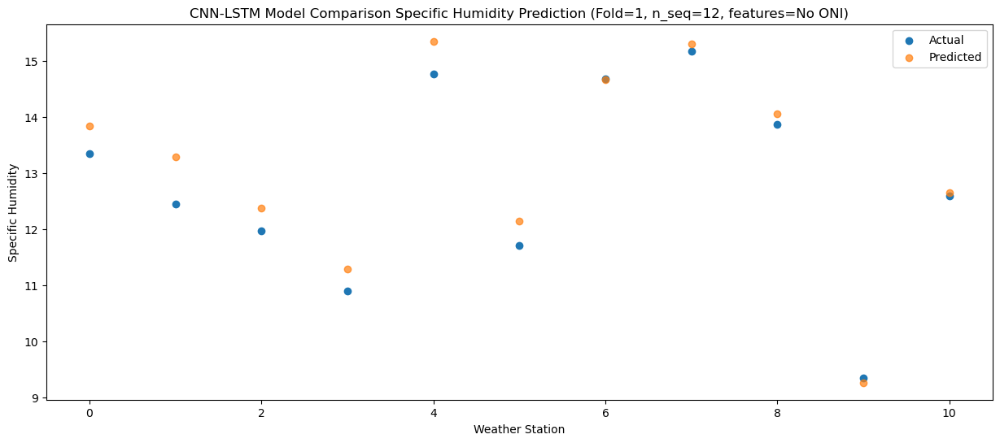

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   10.77  11.467672
1                 1   10.41  11.049444
2                 2    9.21   9.925843
3                 3    8.64   8.593768
4                 4   12.81  12.683770
5                 5    8.59   9.703956
6                 6   12.55  12.451192
7                 7   12.44  12.995230
8                 8   11.43  11.600895
9                 9    5.91   6.927250
10               10   10.73  10.955126


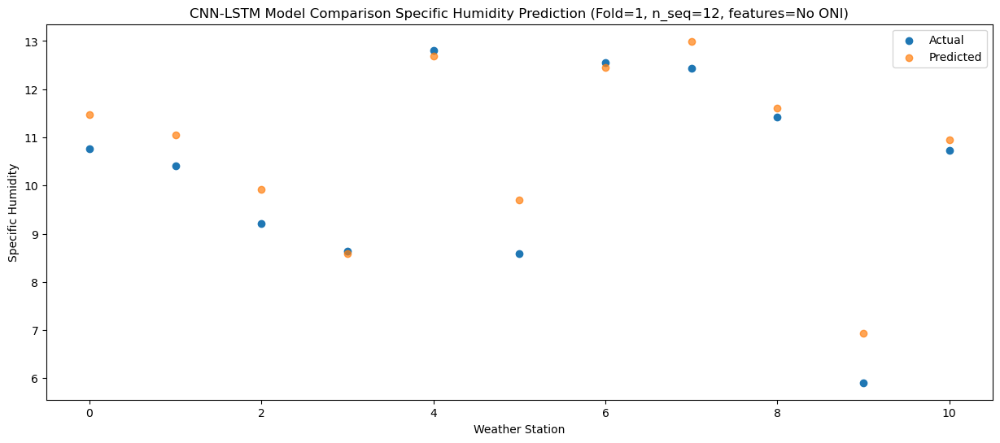

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    5.11   5.583756
1                 1    4.82   4.964686
2                 2    3.71   3.849189
3                 3    4.19   3.861485
4                 4    8.22   7.906463
5                 5    6.75   6.611170
6                 6    6.62   6.414979
7                 7    7.88   7.667878
8                 8    7.90   7.827768
9                 9    3.55   4.038875
10               10    5.54   5.458938


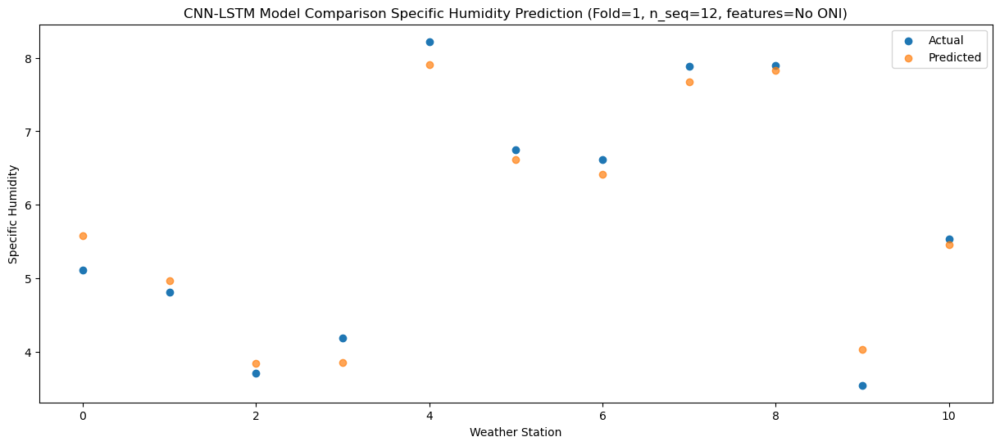

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    7.22   7.822398
1                 1    6.99   7.275040
2                 2    6.35   6.657666
3                 3    7.11   6.279554
4                 4   11.15  10.316938
5                 5    5.70   7.174793
6                 6    8.49   8.596667
7                 7    9.52   9.473224
8                 8    7.29   8.539596
9                 9    2.57   4.033855
10               10    5.42   5.923131


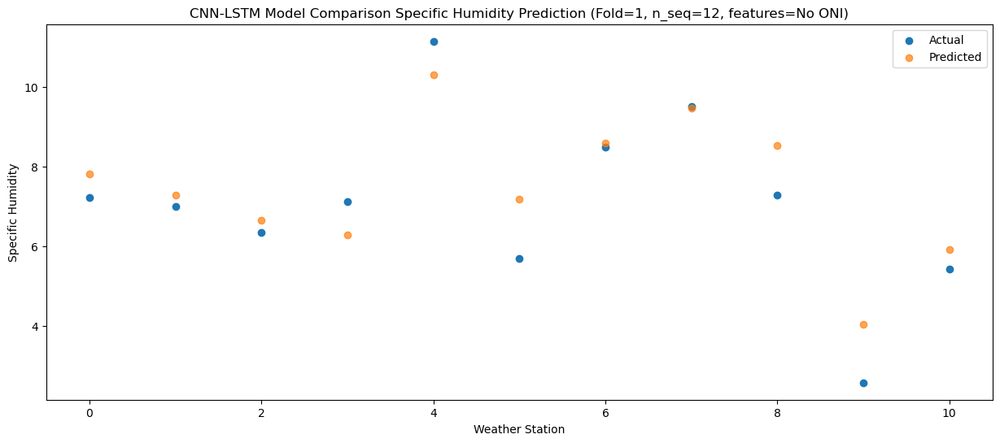

Model: "sequential_502"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_502 (Conv1D)         (None, 1, 1024)           2017280   
                                                                 
 max_pooling1d_502 (MaxPooli  (None, 1, 1024)          0         
 ng1D)                                                           
                                                                 
 dropout_1506 (Dropout)      (None, 1, 1024)           0         
                                                                 
 lstm_1004 (LSTM)            (None, 1, 1024)           8392704   
                                                                 
 dropout_1507 (Dropout)      (None, 1, 1024)           0         
                                                                 
 lstm_1005 (LSTM)            (None, 1024)              8392704   
                                                    

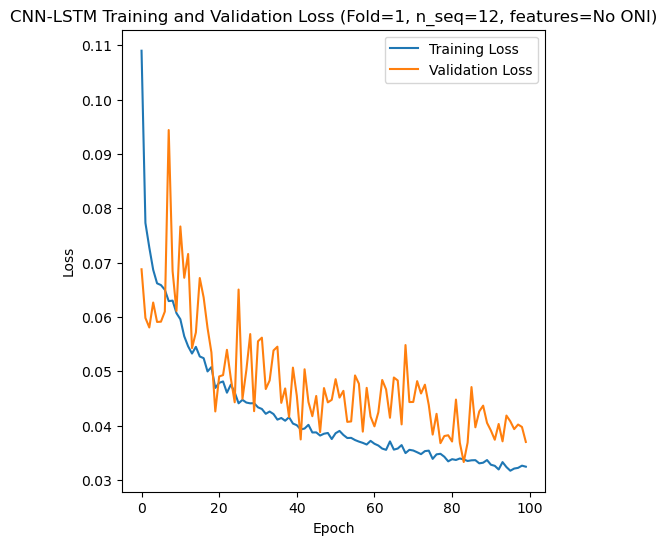

Epoch 1/100
84/84 [==============================] - 22s 116ms/step - loss: 0.1144 - accuracy: 0.5833 - mae: 0.0964 - rmse: 0.1144 - mape: 21.5114 - pearson: 0.6605 - val_loss: 0.0634 - val_accuracy: 1.0000 - val_mae: 0.0492 - val_rmse: 0.0634 - val_mape: 12.6780 - val_pearson: 0.8482
Epoch 2/100
84/84 [==============================] - 7s 86ms/step - loss: 0.0807 - accuracy: 0.6667 - mae: 0.0641 - rmse: 0.0807 - mape: 14.5662 - pearson: 0.7433 - val_loss: 0.0643 - val_accuracy: 1.0000 - val_mae: 0.0528 - val_rmse: 0.0643 - val_mape: 11.7635 - val_pearson: 0.8984
Epoch 3/100
84/84 [==============================] - 6s 74ms/step - loss: 0.0750 - accuracy: 0.6667 - mae: 0.0605 - rmse: 0.0750 - mape: 13.7833 - pearson: 0.7621 - val_loss: 0.0668 - val_accuracy: 0.7000 - val_mae: 0.0540 - val_rmse: 0.0668 - val_mape: 12.0983 - val_pearson: 0.8283
Epoch 4/100
84/84 [==============================] - 6s 72ms/step - loss: 0.0724 - accuracy: 0.6667 - mae: 0.0582 - rmse: 0.0724 - mape: 13.1893 -

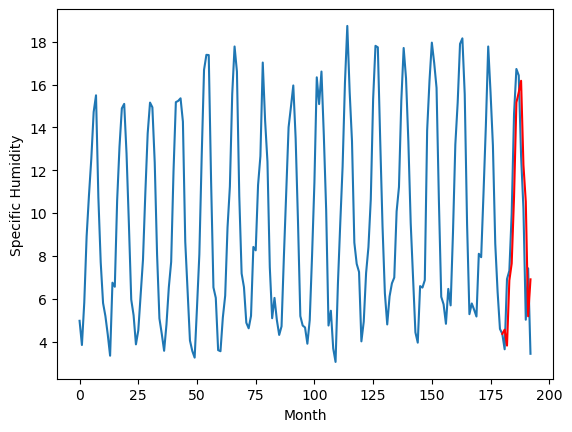

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.84		1.99		0.15
1.16		1.31		0.15
3.01		3.70		0.69
3.13		4.23		1.10
8.25		7.55		-0.70
11.16		10.02		-1.14
12.77		11.08		-1.69
11.15		10.43		-0.72
8.33		7.42		-0.91
4.94		5.36		0.42
2.51		2.87		0.36
1.45		2.71		1.26
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.82, 1.9923980677127837, 1.3119782650470733, 3.6976787292957303, 4.229813739061355, 7.553353472948074, 10.021678849458695, 11.08405284523964, 10.429870828390122, 7.421679719686509, 5.3576955640316015, 2.871730550527573, 2.706604927182198]


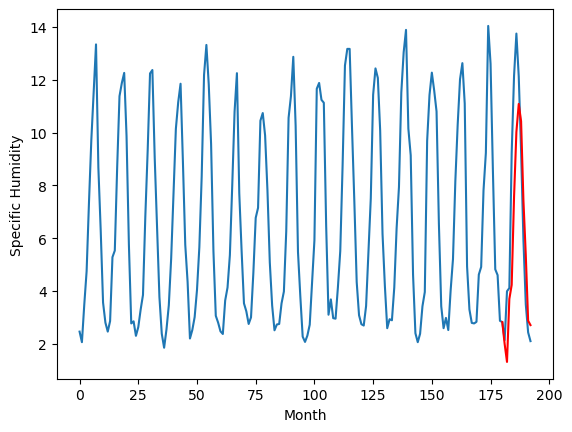

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.53		5.21		-0.32
7.66		6.10		-1.56
7.88		7.10		-0.78
8.85		7.51		-1.34
10.16		9.07		-1.09
13.94		13.17		-0.77
14.34		13.87		-0.47
14.96		14.61		-0.35
13.68		12.47		-1.21
11.02		10.76		-0.26
7.07		6.12		-0.95
8.47		7.89		-0.58
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.16, 5.206136056184769, 6.095122584104538, 7.100786336660385, 7.508362957239151, 9.073348828554153, 13.169550725221633, 13.87060774207115, 14.612861701250075, 12.4729734146595, 10.756558724641799, 6.122284241914748, 7.892765589952468]


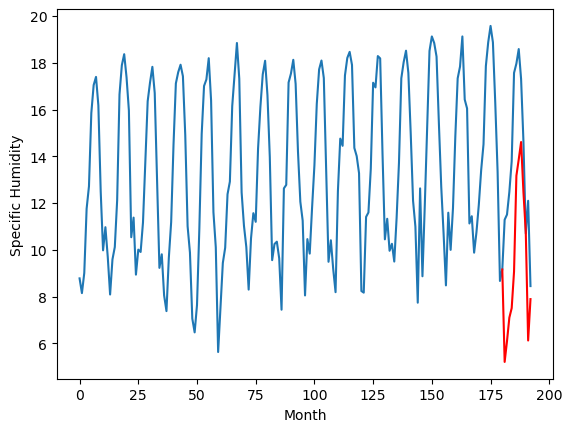

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.98		4.63		0.65
4.15		4.35		0.20
4.79		5.66		0.87
6.14		6.99		0.85
7.82		8.28		0.46
12.42		12.71		0.29
15.02		13.63		-1.39
15.76		14.74		-1.02
13.10		11.51		-1.59
10.14		10.32		0.18
5.69		5.86		0.17
5.33		5.61		0.28
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.44, 4.630930153131485, 4.3528087711334225, 5.661039052009582, 6.989183959960937, 8.279140410423278, 12.713230547904967, 13.633057830333708, 14.737464067935942, 11.510349867343901, 10.320373890399932, 5.864243385791777, 5.605765072107314]


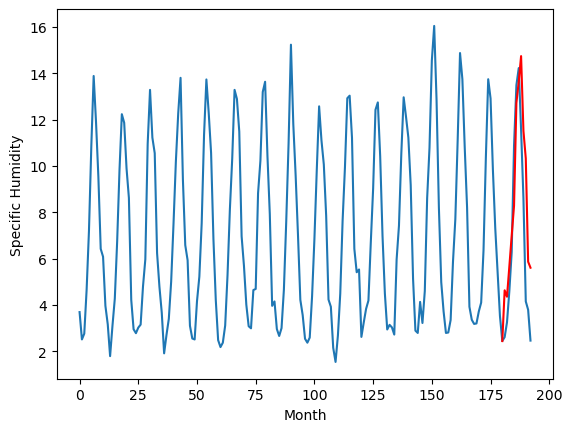

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.10		5.09		-0.01
5.08		5.06		-0.02
8.37		7.66		-0.71
8.39		8.07		-0.32
11.59		10.98		-0.61
15.48		15.31		-0.17
16.51		15.73		-0.78
16.11		16.28		0.17
13.97		12.99		-0.98
11.44		11.09		-0.35
5.78		5.59		-0.19
9.06		8.18		-0.88
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.65, 5.089438163936138, 5.058302832096815, 7.657123280018568, 8.070963246077298, 10.981835705488919, 15.309224468916653, 15.734662038534879, 16.2773122613132, 12.987273437231778, 11.093188268393277, 5.58702037975192, 8.183247787207364]


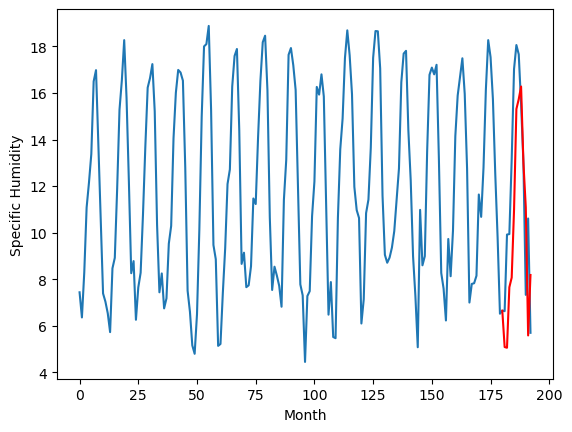

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.33		2.49		0.16
2.28		1.93		-0.35
5.27		4.94		-0.33
6.84		5.80		-1.04
11.67		9.26		-2.41
14.31		13.01		-1.30
13.27		13.16		-0.11
13.40		13.48		0.08
9.84		9.84		-0.00
8.25		8.02		-0.23
4.06		3.49		-0.57
6.93		5.43		-1.50
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.19, 2.49039769269526, 1.9329337487369775, 4.936474026218057, 5.803927184119821, 9.257168770805002, 13.005637885108591, 13.162159086242319, 13.48257356978953, 9.838672460094095, 8.021287263408304, 3.4945853362232455, 5.42584794856608]


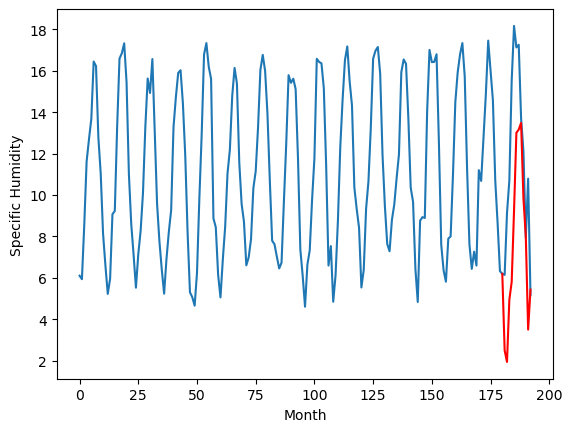

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.68		8.76		0.08
8.35		8.01		-0.34
11.21		11.15		-0.06
12.53		12.11		-0.42
16.73		15.70		-1.03
20.48		19.40		-1.08
21.30		19.62		-1.68
21.68		19.88		-1.80
17.23		16.05		-1.18
14.62		14.22		-0.40
10.63		9.86		-0.77
13.13		11.38		-1.75
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.78, 8.758633744642138, 8.013471615239977, 11.145579826757311, 12.114887547418475, 15.698489260599017, 19.404125523492695, 19.61955907635391, 19.878692445084454, 16.052294310852886, 14.217902597710491, 9.856526788994671, 11.381625112816693]


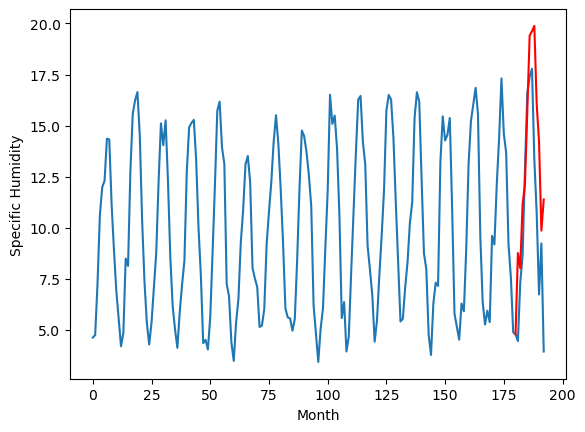

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.97		3.91		-0.06
3.84		3.75		-0.09
3.93		5.05		1.12
4.23		5.55		1.32
4.35		7.63		3.28
7.01		9.89		2.88
12.25		10.91		-1.34
12.54		10.54		-2.00
9.78		8.42		-1.36
6.07		6.79		0.72
4.42		4.87		0.45
4.55		4.83		0.28
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.61, 3.905242937207222, 3.754389705657959, 5.046639266014099, 5.551265838146209, 7.630948665142059, 9.894425036907196, 10.910522701740264, 10.537258895635604, 8.415489228963851, 6.792401345968246, 4.8675333583354945, 4.825953664779663]


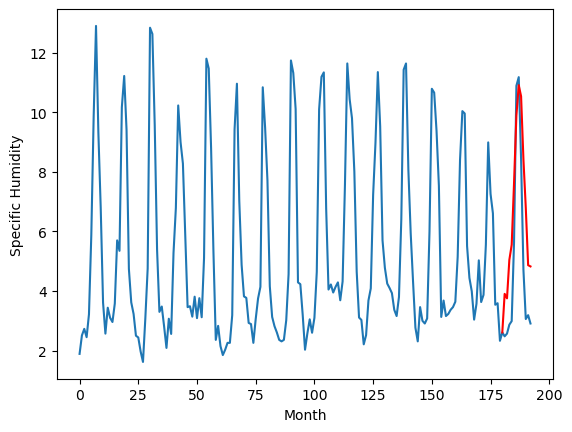

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.29		7.73		-0.56
8.82		7.72		-1.10
8.93		7.92		-1.01
10.25		8.48		-1.77
11.73		9.11		-2.62
12.98		10.96		-2.02
14.13		11.54		-2.59
13.53		11.55		-1.98
13.07		10.40		-2.67
10.27		9.55		-0.72
9.73		8.82		-0.91
9.55		8.16		-1.39
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.6, 7.732667597532273, 7.7248098548129205, 7.92087574262172, 8.48185147304088, 9.113389864154161, 10.959882035441698, 11.538013770766558, 11.545380999855698, 10.39663796644658, 9.547477652840318, 8.815278043560685, 8.155113329701127]


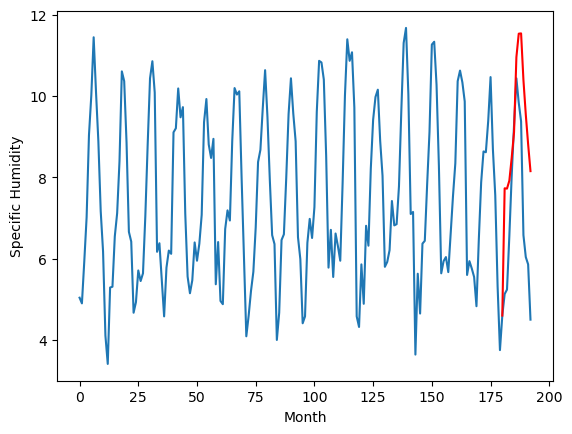

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.98		5.99		0.01
6.05		5.70		-0.35
7.78		8.06		0.28
8.31		8.74		0.43
11.02		11.27		0.25
15.52		15.90		0.38
17.04		16.71		-0.33
17.62		17.41		-0.21
14.02		13.80		-0.22
11.86		12.07		0.21
6.30		6.50		0.20
8.15		8.09		-0.06
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.27, 5.989648839831352, 5.7036046296358105, 8.056458643078804, 8.744674733281135, 11.274123004078865, 15.901830008625984, 16.71155088245869, 17.411584904789926, 13.804035714268686, 12.067600062489511, 6.4992912322282805, 8.087503960728647]


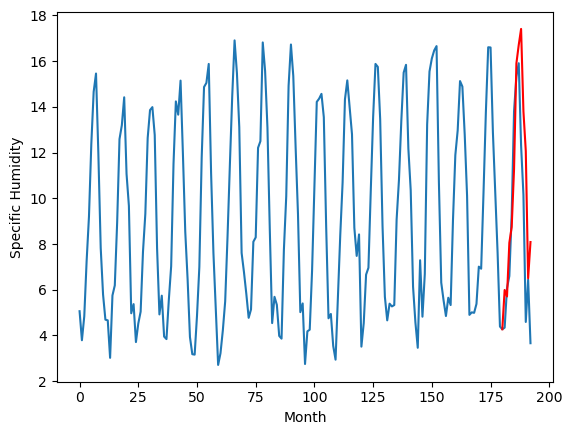

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.63		4.46		-0.17
4.87		4.06		-0.81
5.90		6.38		0.48
6.51		7.23		0.72
9.18		9.63		0.45
13.28		14.30		1.02
14.69		15.08		0.39
15.08		15.88		0.80
11.87		12.22		0.35
10.14		10.60		0.46
4.78		5.06		0.28
6.34		6.44		0.10
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.91, 4.46025077521801, 4.064047018885613, 6.383625428080559, 7.2310442727804185, 9.62588069856167, 14.303769568800927, 15.084604660868646, 15.88210342347622, 12.217609147429467, 10.598790864348413, 5.0600778859853754, 6.436257819533349]


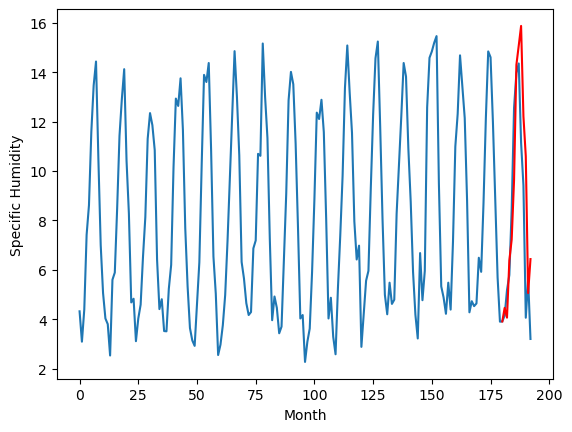

RangeIndex(start=1, stop=12, step=1)
[4.390000000000001, 1.8399999999999992, 5.529999999999999, 3.9799999999999995, 5.1, 2.33, 8.68, 3.9700000000000006, 8.29, 5.9799999999999995, 4.63]
[4.554846267104149, 1.9923980677127837, 5.206136056184769, 4.630930153131485, 5.089438163936138, 2.49039769269526, 8.758633744642138, 3.905242937207222, 7.732667597532273, 5.989648839831352, 4.46025077521801]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.39   4.554846
1                 1    1.84   1.992398
2                 2    5.53   5.206136
3                 3    3.98   4.630930
4                 4    5.10   5.089438
5                 5    2.33   2.490398
6                 6    8.68   8.758634
7                 7    3.97   3.905243
8                 8    8.29   7.732668
9                 9    5.98   5.989649
10               10    4.63   4.460251


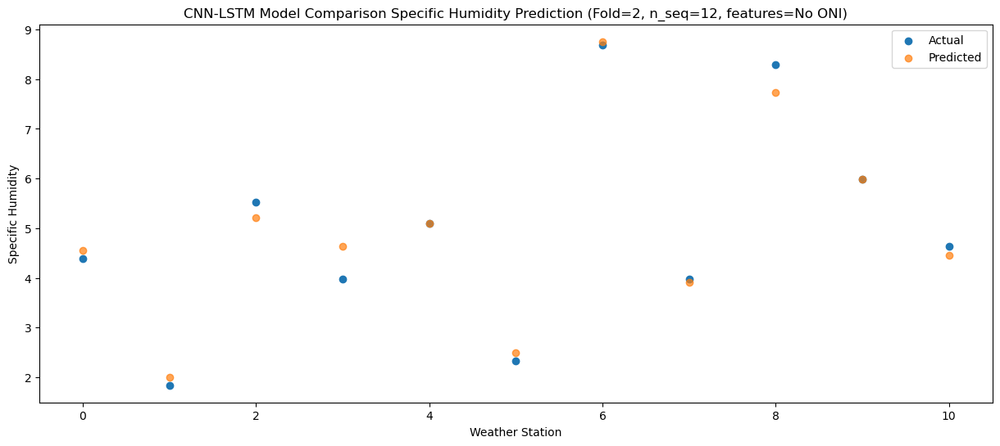

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.67   3.812315
1                 1    1.16   1.311978
2                 2    7.66   6.095123
3                 3    4.15   4.352809
4                 4    5.08   5.058303
5                 5    2.28   1.932934
6                 6    8.35   8.013472
7                 7    3.84   3.754390
8                 8    8.82   7.724810
9                 9    6.05   5.703605
10               10    4.87   4.064047


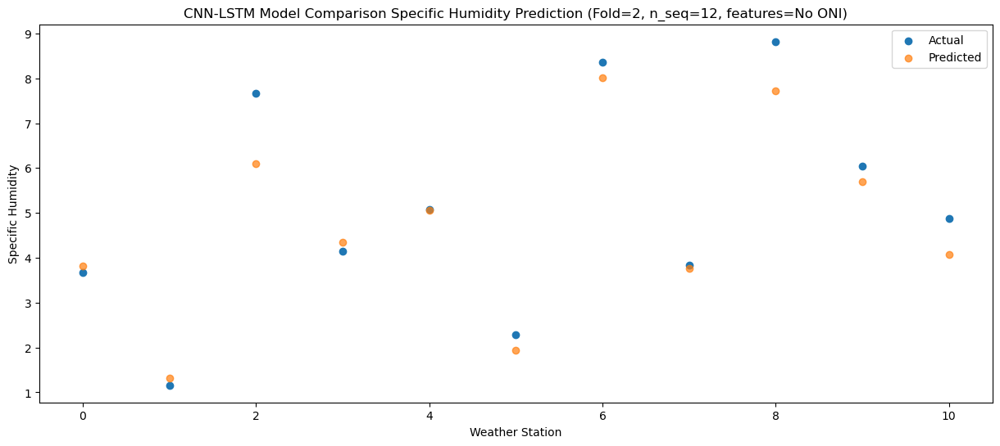

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    6.95   6.856653
1                 1    3.01   3.697679
2                 2    7.88   7.100786
3                 3    4.79   5.661039
4                 4    8.37   7.657123
5                 5    5.27   4.936474
6                 6   11.21  11.145580
7                 7    3.93   5.046639
8                 8    8.93   7.920876
9                 9    7.78   8.056459
10               10    5.90   6.383625


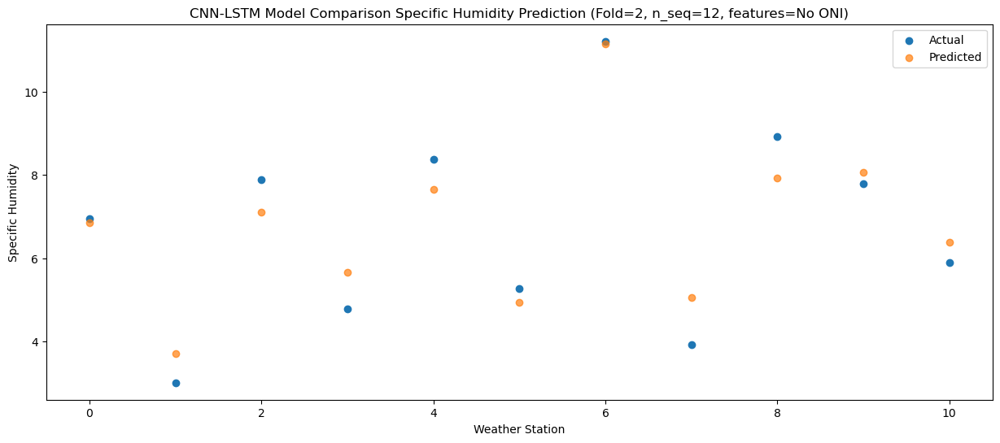

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.34   7.646399
1                 1    3.13   4.229814
2                 2    8.85   7.508363
3                 3    6.14   6.989184
4                 4    8.39   8.070963
5                 5    6.84   5.803927
6                 6   12.53  12.114888
7                 7    4.23   5.551266
8                 8   10.25   8.481851
9                 9    8.31   8.744675
10               10    6.51   7.231044


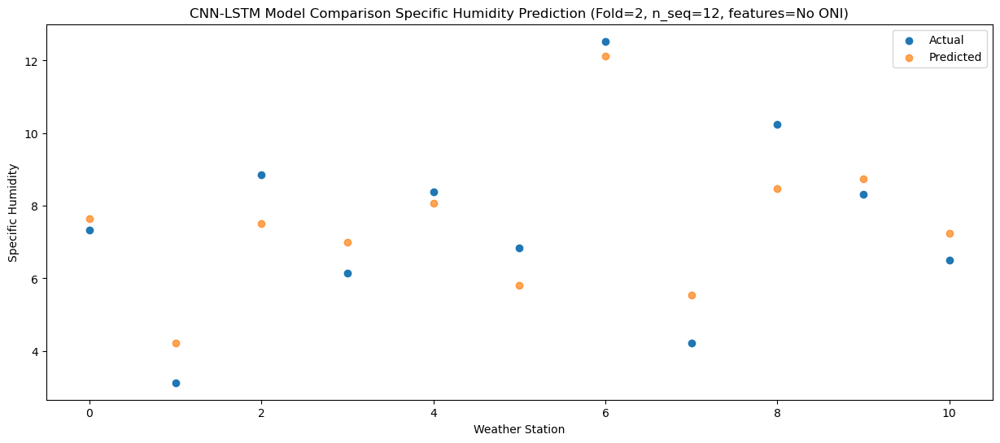

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.01  10.765907
1                 1    8.25   7.553353
2                 2   10.16   9.073349
3                 3    7.82   8.279140
4                 4   11.59  10.981836
5                 5   11.67   9.257169
6                 6   16.73  15.698489
7                 7    4.35   7.630949
8                 8   11.73   9.113390
9                 9   11.02  11.274123
10               10    9.18   9.625881


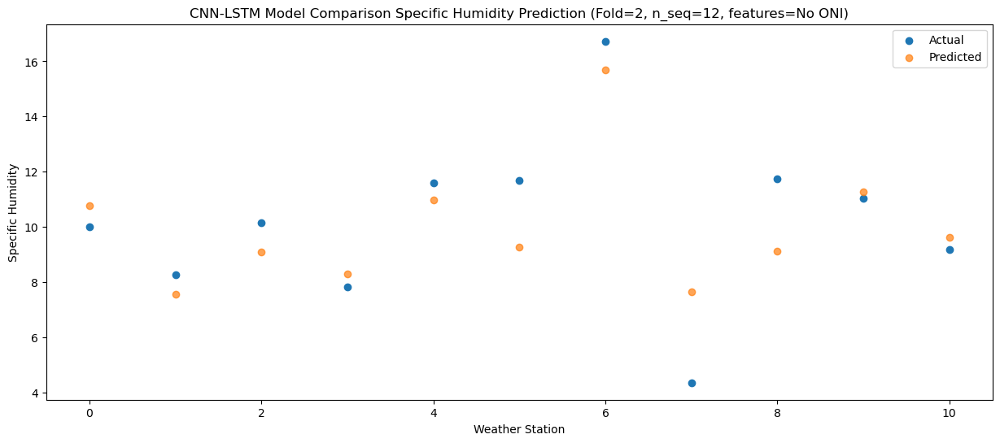

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   14.66  15.166294
1                 1   11.16  10.021679
2                 2   13.94  13.169551
3                 3   12.42  12.713231
4                 4   15.48  15.309224
5                 5   14.31  13.005638
6                 6   20.48  19.404126
7                 7    7.01   9.894425
8                 8   12.98  10.959882
9                 9   15.52  15.901830
10               10   13.28  14.303770


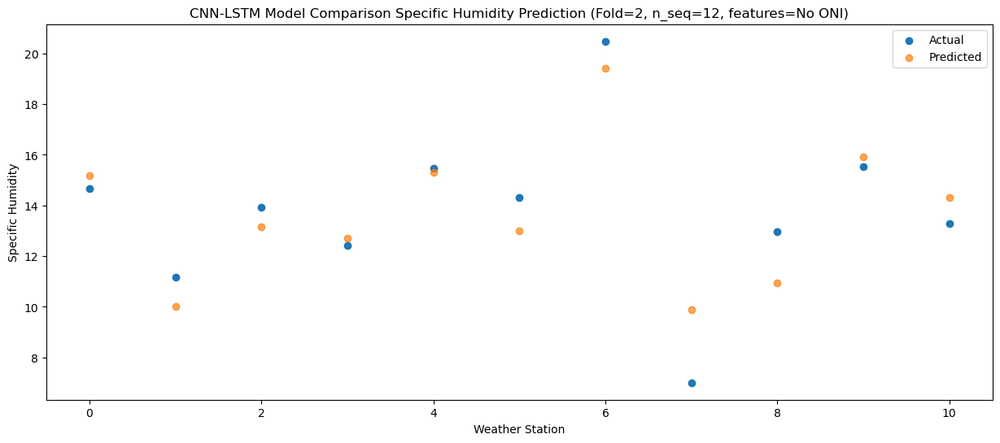

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   16.76  15.637562
1                 1   12.77  11.084053
2                 2   14.34  13.870608
3                 3   15.02  13.633058
4                 4   16.51  15.734662
5                 5   13.27  13.162159
6                 6   21.30  19.619559
7                 7   12.25  10.910523
8                 8   14.13  11.538014
9                 9   17.04  16.711551
10               10   14.69  15.084605


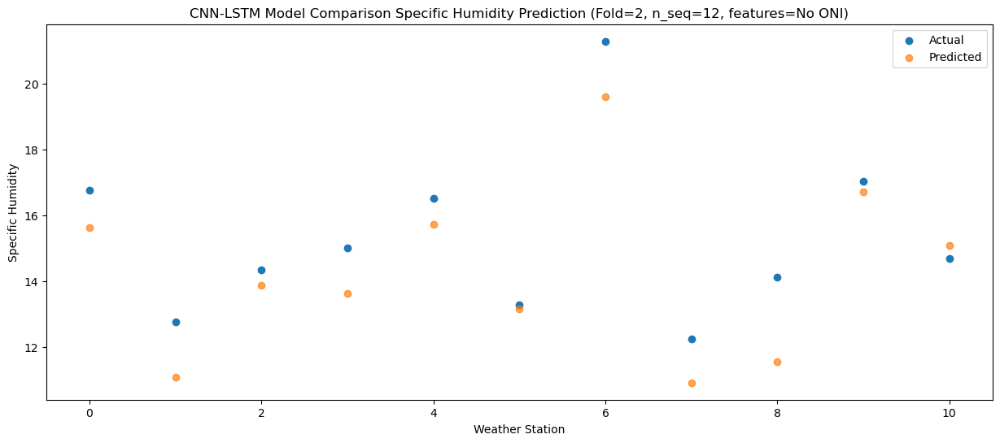

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   16.46  16.178242
1                 1   11.15  10.429871
2                 2   14.96  14.612862
3                 3   15.76  14.737464
4                 4   16.11  16.277312
5                 5   13.40  13.482574
6                 6   21.68  19.878692
7                 7   12.54  10.537259
8                 8   13.53  11.545381
9                 9   17.62  17.411585
10               10   15.08  15.882103


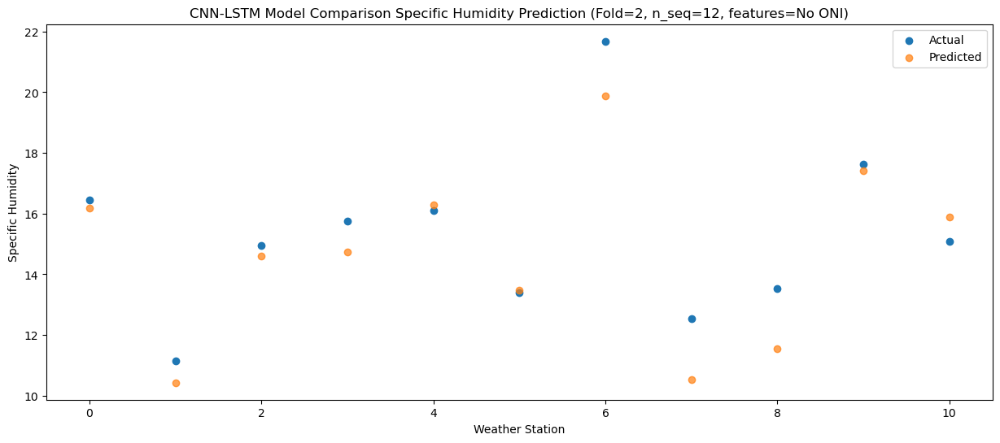

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   12.69  12.248206
1                 1    8.33   7.421680
2                 2   13.68  12.472973
3                 3   13.10  11.510350
4                 4   13.97  12.987273
5                 5    9.84   9.838672
6                 6   17.23  16.052294
7                 7    9.78   8.415489
8                 8   13.07  10.396638
9                 9   14.02  13.804036
10               10   11.87  12.217609


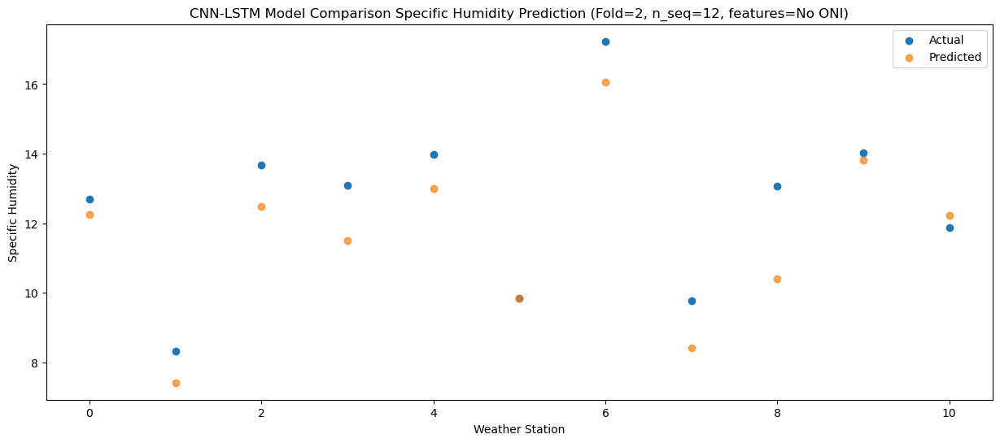

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   10.24  10.534928
1                 1    4.94   5.357696
2                 2   11.02  10.756559
3                 3   10.14  10.320374
4                 4   11.44  11.093188
5                 5    8.25   8.021287
6                 6   14.62  14.217903
7                 7    6.07   6.792401
8                 8   10.27   9.547478
9                 9   11.86  12.067600
10               10   10.14  10.598791


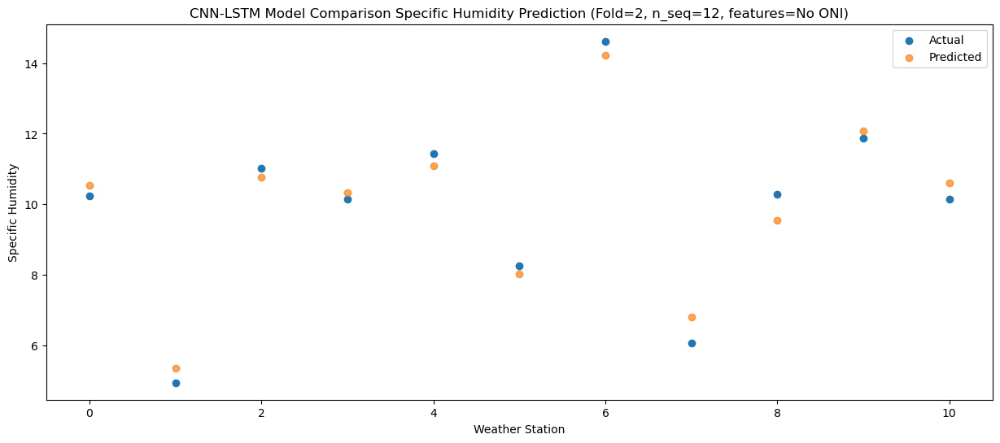

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    5.05   5.180759
1                 1    2.51   2.871731
2                 2    7.07   6.122284
3                 3    5.69   5.864243
4                 4    5.78   5.587020
5                 5    4.06   3.494585
6                 6   10.63   9.856527
7                 7    4.42   4.867533
8                 8    9.73   8.815278
9                 9    6.30   6.499291
10               10    4.78   5.060078


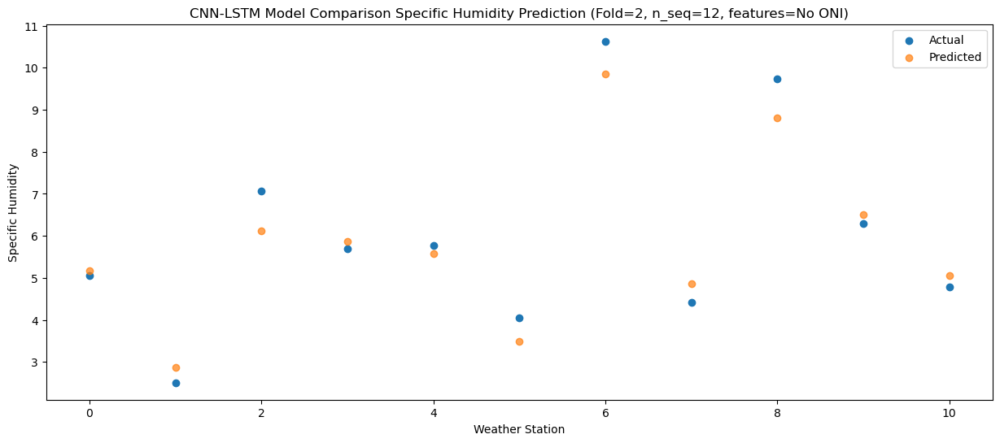

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    7.45   6.905702
1                 1    1.45   2.706605
2                 2    8.47   7.892766
3                 3    5.33   5.605765
4                 4    9.06   8.183248
5                 5    6.93   5.425848
6                 6   13.13  11.381625
7                 7    4.55   4.825954
8                 8    9.55   8.155113
9                 9    8.15   8.087504
10               10    6.34   6.436258


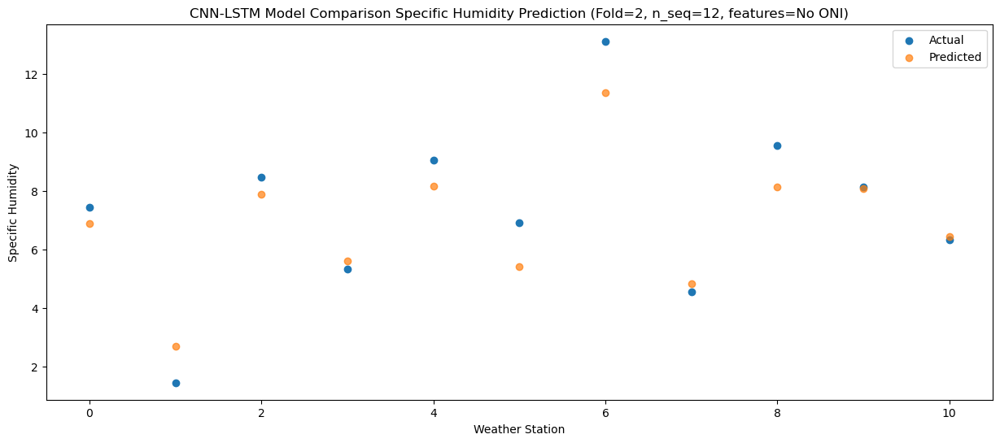

Model: "sequential_503"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_503 (Conv1D)         (None, 1, 1024)           2017280   
                                                                 
 max_pooling1d_503 (MaxPooli  (None, 1, 1024)          0         
 ng1D)                                                           
                                                                 
 dropout_1509 (Dropout)      (None, 1, 1024)           0         
                                                                 
 lstm_1006 (LSTM)            (None, 1, 1024)           8392704   
                                                                 
 dropout_1510 (Dropout)      (None, 1, 1024)           0         
                                                                 
 lstm_1007 (LSTM)            (None, 1024)              8392704   
                                                    

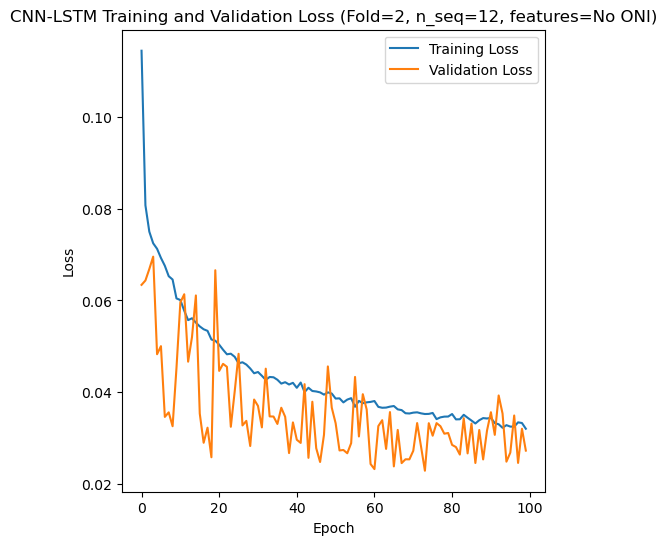

Epoch 1/100
84/84 [==============================] - 21s 97ms/step - loss: 0.1073 - accuracy: 0.6071 - mae: 0.0910 - rmse: 0.1073 - mape: 19.3443 - pearson: 0.7032 - val_loss: 0.0751 - val_accuracy: 0.9000 - val_mae: 0.0599 - val_rmse: 0.0751 - val_mape: 14.0595 - val_pearson: 0.6610
Epoch 2/100
84/84 [==============================] - 6s 68ms/step - loss: 0.0749 - accuracy: 0.6310 - mae: 0.0604 - rmse: 0.0749 - mape: 13.6598 - pearson: 0.7702 - val_loss: 0.1012 - val_accuracy: 0.9000 - val_mae: 0.0783 - val_rmse: 0.1012 - val_mape: 17.0818 - val_pearson: 0.5964
Epoch 3/100
84/84 [==============================] - 5s 64ms/step - loss: 0.0717 - accuracy: 0.6786 - mae: 0.0577 - rmse: 0.0717 - mape: 13.0094 - pearson: 0.7920 - val_loss: 0.0904 - val_accuracy: 0.9000 - val_mae: 0.0712 - val_rmse: 0.0904 - val_mape: 15.8533 - val_pearson: 0.5873
Epoch 4/100
84/84 [==============================] - 5s 65ms/step - loss: 0.0679 - accuracy: 0.7024 - mae: 0.0538 - rmse: 0.0679 - mape: 12.1032 - 

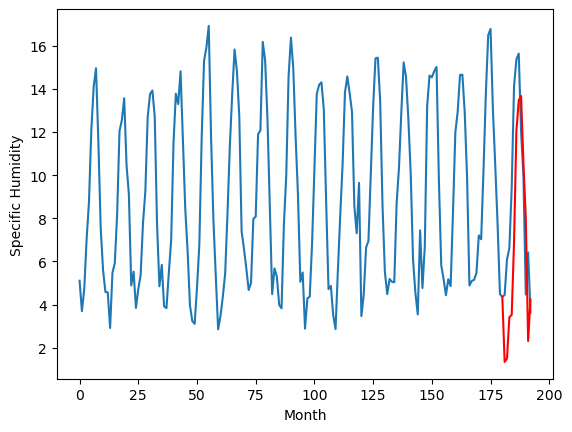

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.64		2.42		-0.22
2.08		1.73		-0.35
4.59		4.46		-0.13
5.76		4.86		-0.90
9.28		9.25		-0.03
13.81		13.78		-0.03
14.69		14.97		0.28
14.86		14.61		-0.25
10.89		11.00		0.11
8.70		8.31		-0.39
4.27		3.77		-0.50
5.24		4.92		-0.32
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.43, 2.4247247087955475, 1.7342281448841095, 4.462591420412064, 4.857221822738648, 9.24814341545105, 13.78403733253479, 14.970362167358399, 14.61201704621315, 11.004304538965226, 8.314580808877945, 3.768742929697037, 4.916158448457718]


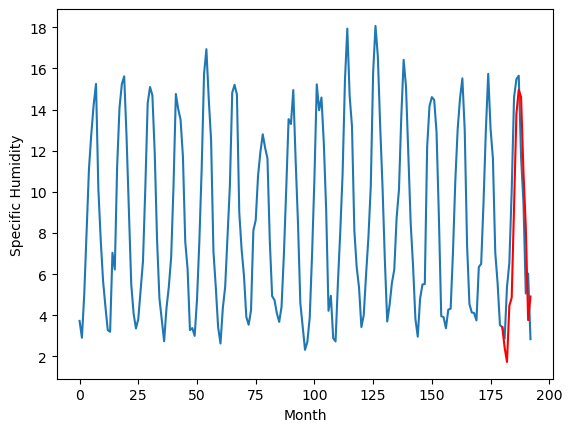

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.37		6.17		-0.20
6.31		6.06		-0.25
6.39		6.29		-0.10
7.01		6.07		-0.94
7.41		8.92		1.51
9.86		11.41		1.55
10.56		12.19		1.63
10.09		11.63		1.54
8.80		10.53		1.73
7.66		8.58		0.92
8.24		7.38		-0.86
6.74		6.45		-0.29
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.43, 6.173769034743309, 6.0607452023029325, 6.2855700480937955, 6.070778318047523, 8.920363135933876, 11.4062494713068, 12.186733372807502, 11.625230439305305, 10.528855331540107, 8.583325274586677, 7.37861002266407, 6.451403804421425]


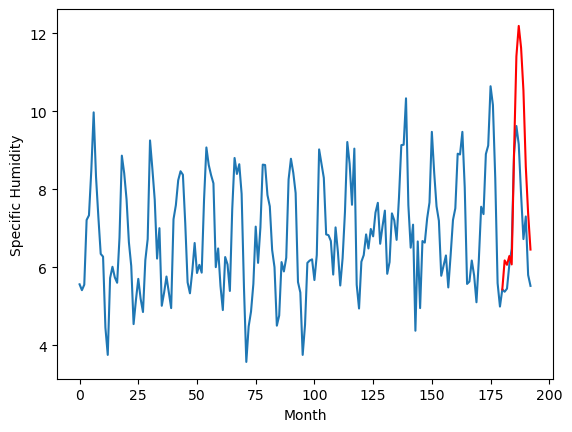

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.44		3.24		-0.20
3.37		3.06		-0.31
4.67		5.00		0.33
5.86		5.44		-0.42
8.39		8.47		0.08
13.81		13.82		0.01
14.44		15.20		0.76
15.32		15.56		0.24
11.85		12.25		0.40
9.79		10.11		0.32
4.10		4.44		0.34
5.24		5.68		0.44
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.21, 3.243718854188919, 3.062929025888443, 4.999169460535049, 5.4435778176784515, 8.47273187994957, 13.820264152288438, 15.204330853223802, 15.556752285957337, 12.246267876625062, 10.112673602104188, 4.442472300529481, 5.681371054649354]


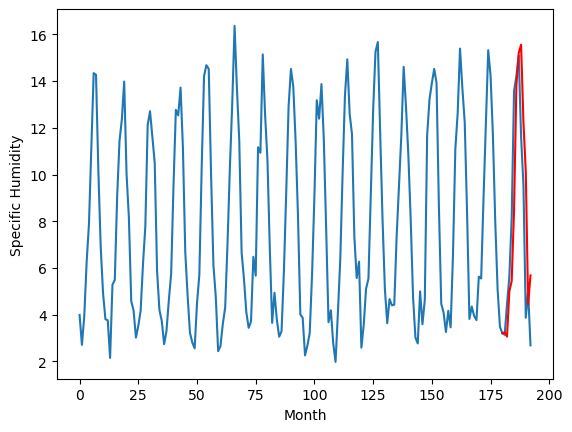

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.91		4.73		-0.18
4.08		4.11		0.03
6.56		6.49		-0.07
7.62		6.96		-0.66
10.04		10.60		0.56
14.50		15.64		1.14
16.45		17.08		0.63
16.54		17.04		0.50
12.77		13.46		0.69
10.82		11.10		0.28
5.70		5.97		0.27
6.40		6.71		0.31
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.04, 4.728224292993546, 4.113693073987961, 6.491355255842209, 6.956268206834793, 10.59977592587471, 15.63535417675972, 17.083252922296523, 17.03579274252057, 13.45875063970685, 11.09680119588971, 5.97422162130475, 6.714637015610933]


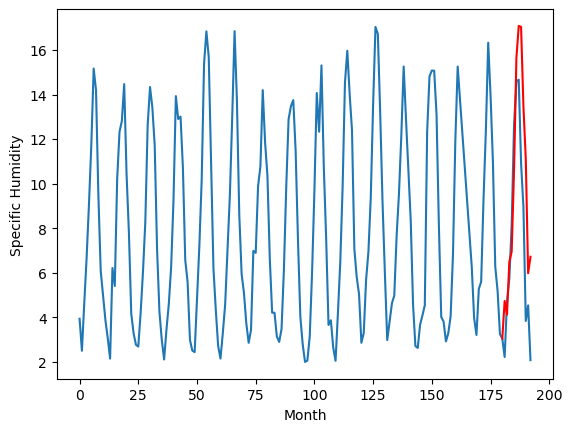

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.42		3.26		-0.16
2.90		2.80		-0.10
4.93		5.01		0.08
6.23		5.54		-0.69
8.47		8.77		0.30
13.69		14.09		0.40
14.94		15.47		0.53
15.11		15.69		0.58
11.81		12.15		0.34
10.19		10.04		-0.15
4.32		4.52		0.20
5.37		5.53		0.16
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.91, 3.257925878763199, 2.7975218403339386, 5.009738694429398, 5.544767867326737, 8.771632920503617, 14.090946446657181, 15.472660909891129, 15.686774711608887, 12.15428994178772, 10.040683012008667, 4.524491529464722, 5.527726154327393]


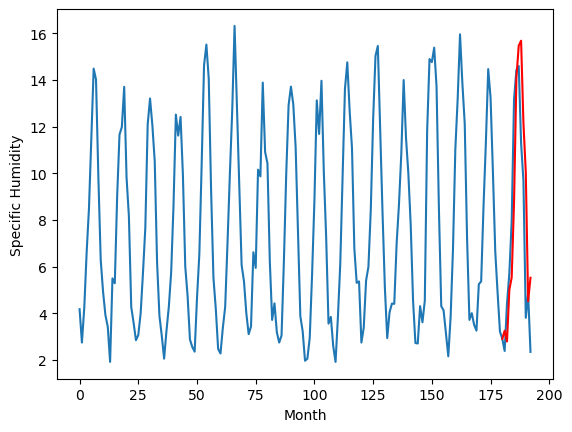

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.73		5.71		-0.02
5.79		5.56		-0.23
6.10		6.53		0.43
6.57		6.26		-0.31
7.97		9.91		1.94
9.30		12.82		3.52
11.75		14.07		2.32
10.32		13.22		2.90
8.62		11.47		2.85
7.53		8.83		1.30
6.82		6.66		-0.16
6.11		6.38		0.27
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[1.6, 5.714376983642578, 5.563467172384262, 6.530847517251968, 6.2608019685745235, 9.913054404258727, 12.824987349510192, 14.069348392486571, 13.218877551555632, 11.465097663402556, 8.829626796245574, 6.659658668041228, 6.3792472159862506]


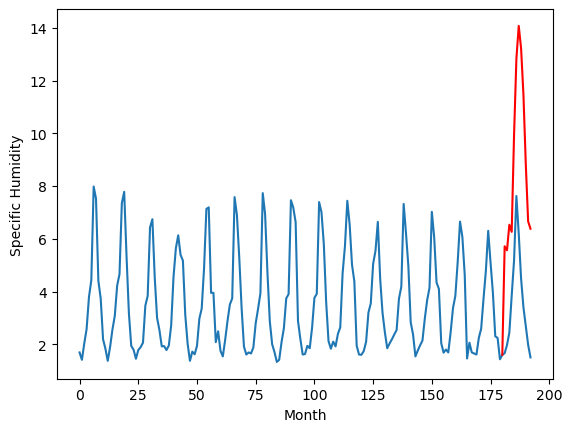

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.80		4.24		-0.56
4.32		4.08		-0.24
4.62		4.52		-0.10
4.31		4.16		-0.15
4.87		7.35		2.48
6.29		9.78		3.49
11.65		10.81		-0.84
9.22		10.00		0.78
7.50		8.79		1.29
6.40		6.53		0.13
5.13		5.25		0.12
5.27		4.42		-0.85
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.86, 4.235613664388657, 4.080467870235443, 4.51940034866333, 4.159260859489441, 7.351739039421082, 9.775964608192444, 10.81052993774414, 9.996032288074494, 8.792203595638275, 6.5326494479179384, 5.249965717792511, 4.422575941085816]


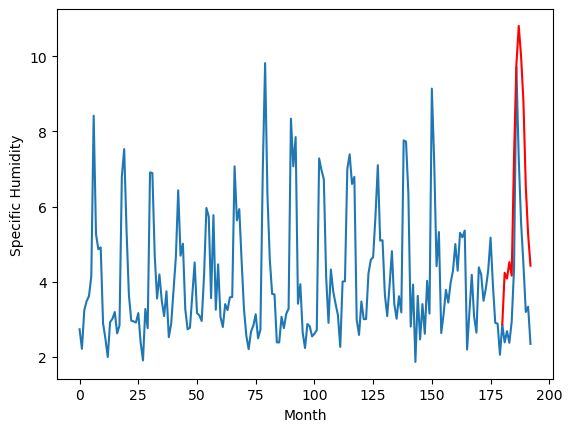

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.60		4.19		-0.41
4.25		4.16		-0.09
3.90		4.31		0.41
4.83		4.16		-0.67
5.27		6.78		1.51
6.70		9.32		2.62
7.18		9.88		2.70
7.57		9.51		1.94
6.93		8.47		1.54
5.90		6.74		0.84
6.12		5.43		-0.69
4.87		4.71		-0.16
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.65, 4.191641085147857, 4.162070337980985, 4.3088938038051126, 4.1570930968225, 6.77915816411376, 9.324342299550771, 9.881437409967184, 9.509619612544775, 8.474575538486242, 6.735911388248205, 5.43171073898673, 4.705885846465826]


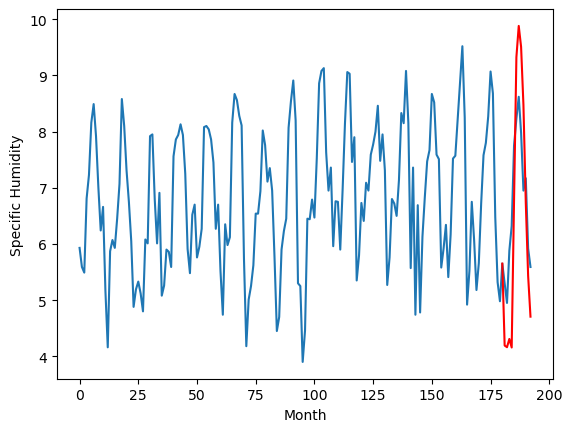

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.09		3.56		0.47
3.24		3.63		0.39
4.02		4.61		0.59
5.40		5.39		-0.01
6.97		7.83		0.86
11.87		12.99		1.12
14.08		14.39		0.31
14.46		15.08		0.62
11.86		12.22		0.36
9.32		10.11		0.79
4.79		5.12		0.33
4.49		5.15		0.66
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.54, 3.5554204511642453, 3.63147218555212, 4.606378987729549, 5.385830357968807, 7.830514148175716, 12.98832626670599, 14.385029748380184, 15.080865636765957, 12.217047706544399, 10.106997028291225, 5.122473731935024, 5.150366891473531]


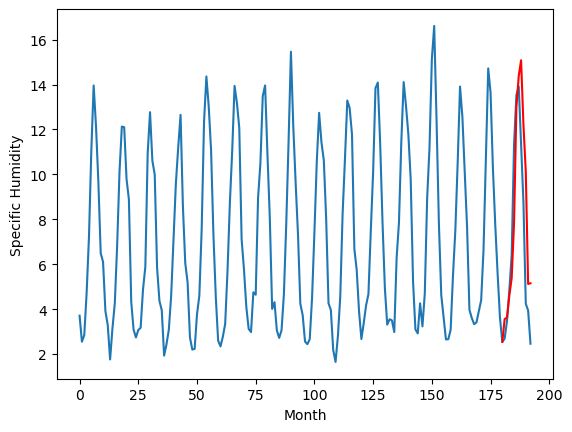

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.00		1.03		0.03
0.86		0.97		0.11
2.14		2.25		0.11
3.55		3.03		-0.52
5.14		5.64		0.50
10.01		10.96		0.95
11.70		12.44		0.74
12.02		13.07		1.05
9.10		9.96		0.86
7.20		7.82		0.62
2.28		2.55		0.27
2.18		2.76		0.58
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.51, 1.034123601913452, 0.9696295955777168, 2.2544468143582344, 3.0261803367733955, 5.635538885891437, 10.96244747430086, 12.443025658428668, 13.073531875908374, 9.956209669411182, 7.819765339195728, 2.5514466860890384, 2.759343082606792]


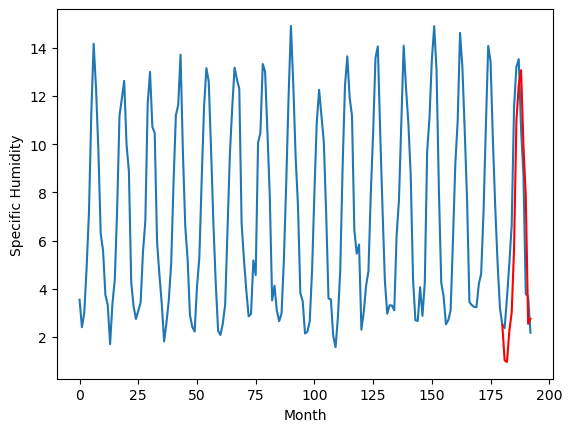

RangeIndex(start=1, stop=12, step=1)
[1.5600000000000005, 2.64, 6.369999999999998, 3.4399999999999995, 4.91, 3.42, 5.73, 4.800000000000001, 4.6, 3.09, 0.9999999999999993]
[1.348696413040161, 2.4247247087955475, 6.173769034743309, 3.243718854188919, 4.728224292993546, 3.257925878763199, 5.714376983642578, 4.235613664388657, 4.191641085147857, 3.5554204511642453, 1.034123601913452]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    1.56   1.348696
1                 1    2.64   2.424725
2                 2    6.37   6.173769
3                 3    3.44   3.243719
4                 4    4.91   4.728224
5                 5    3.42   3.257926
6                 6    5.73   5.714377
7                 7    4.80   4.235614
8                 8    4.60   4.191641
9                 9    3.09   3.555420
10               10    1.00   1.034124


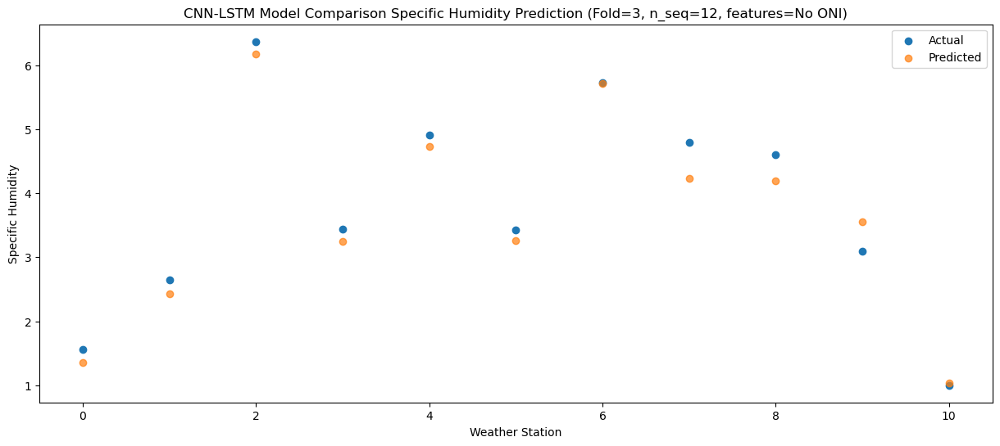

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    1.65   1.504140
1                 1    2.08   1.734228
2                 2    6.31   6.060745
3                 3    3.37   3.062929
4                 4    4.08   4.113693
5                 5    2.90   2.797522
6                 6    5.79   5.563467
7                 7    4.32   4.080468
8                 8    4.25   4.162070
9                 9    3.24   3.631472
10               10    0.86   0.969630


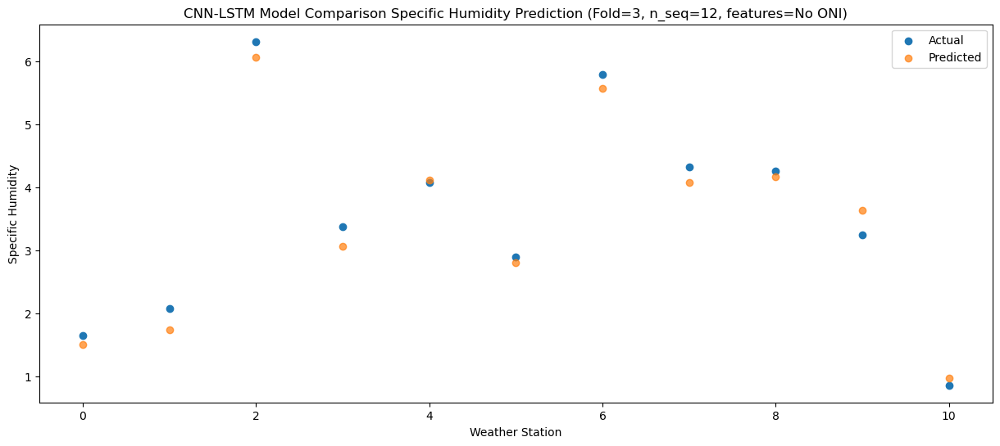

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    3.30   3.417123
1                 1    4.59   4.462591
2                 2    6.39   6.285570
3                 3    4.67   4.999169
4                 4    6.56   6.491355
5                 5    4.93   5.009739
6                 6    6.10   6.530848
7                 7    4.62   4.519400
8                 8    3.90   4.308894
9                 9    4.02   4.606379
10               10    2.14   2.254447


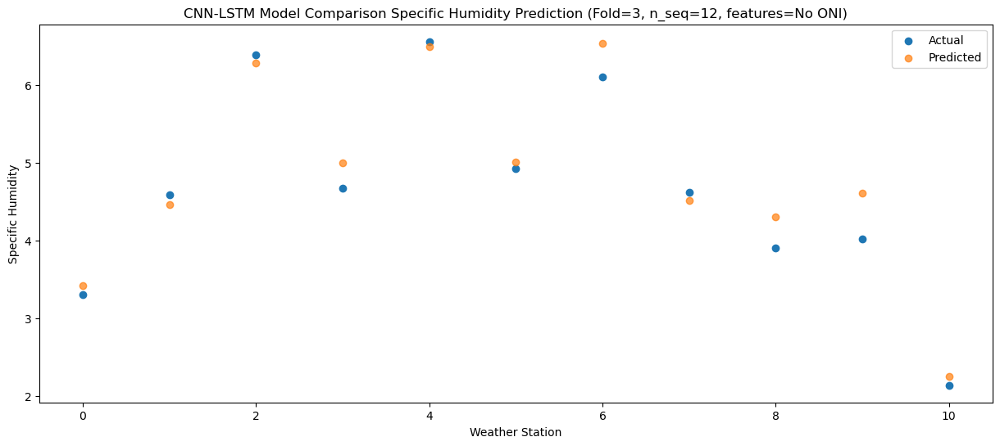

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    3.82   3.525314
1                 1    5.76   4.857222
2                 2    7.01   6.070778
3                 3    5.86   5.443578
4                 4    7.62   6.956268
5                 5    6.23   5.544768
6                 6    6.57   6.260802
7                 7    4.31   4.159261
8                 8    4.83   4.157093
9                 9    5.40   5.385830
10               10    3.55   3.026180


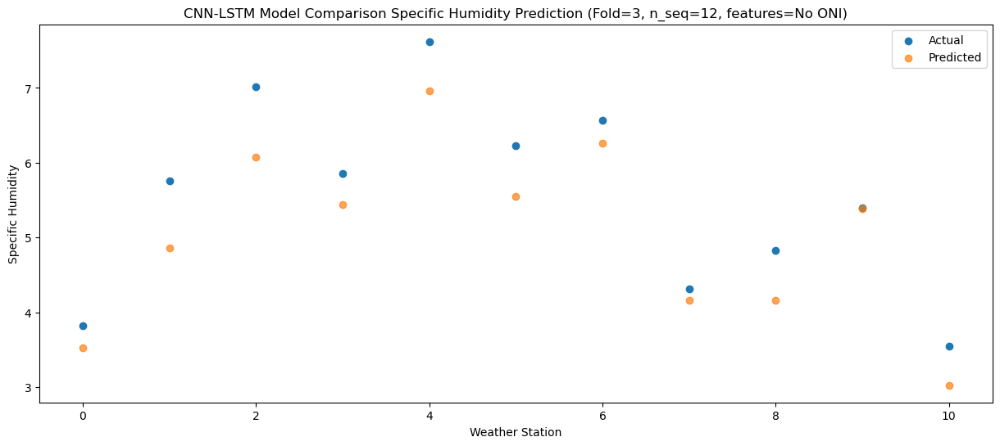

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    6.60   6.884922
1                 1    9.28   9.248143
2                 2    7.41   8.920363
3                 3    8.39   8.472732
4                 4   10.04  10.599776
5                 5    8.47   8.771633
6                 6    7.97   9.913054
7                 7    4.87   7.351739
8                 8    5.27   6.779158
9                 9    6.97   7.830514
10               10    5.14   5.635539


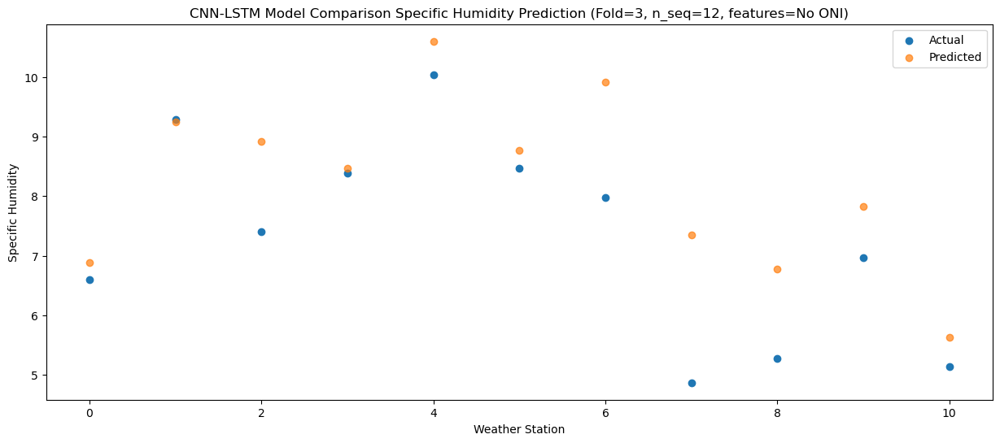

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   11.32  12.045032
1                 1   13.81  13.784037
2                 2    9.86  11.406249
3                 3   13.81  13.820264
4                 4   14.50  15.635354
5                 5   13.69  14.090946
6                 6    9.30  12.824987
7                 7    6.29   9.775965
8                 8    6.70   9.324342
9                 9   11.87  12.988326
10               10   10.01  10.962447


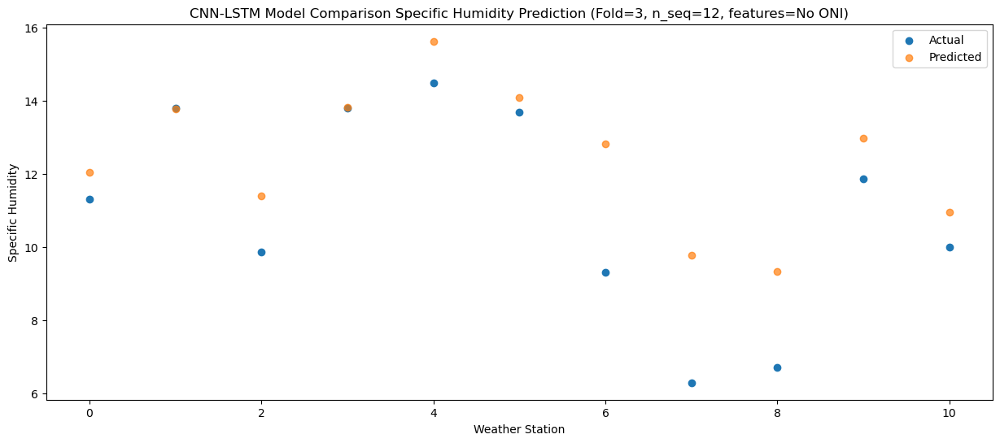

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   12.56  13.463467
1                 1   14.69  14.970362
2                 2   10.56  12.186733
3                 3   14.44  15.204331
4                 4   16.45  17.083253
5                 5   14.94  15.472661
6                 6   11.75  14.069348
7                 7   11.65  10.810530
8                 8    7.18   9.881437
9                 9   14.08  14.385030
10               10   11.70  12.443026


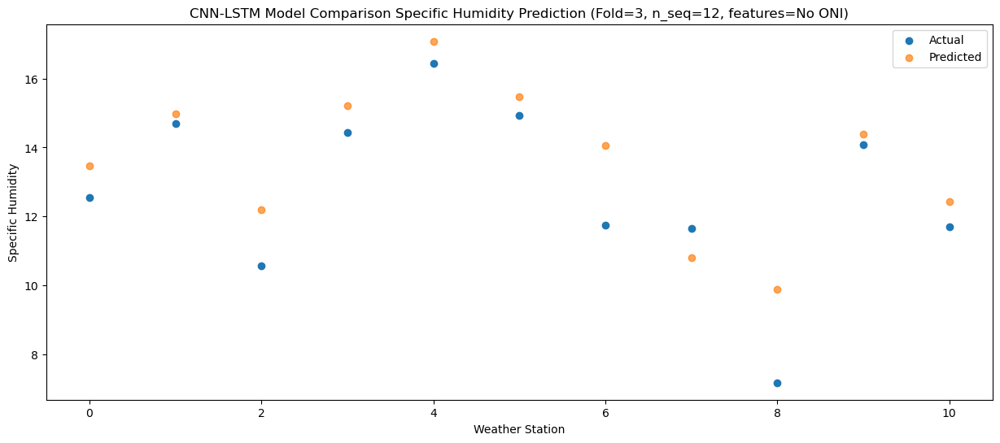

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   12.83  13.666905
1                 1   14.86  14.612017
2                 2   10.09  11.625230
3                 3   15.32  15.556752
4                 4   16.54  17.035793
5                 5   15.11  15.686775
6                 6   10.32  13.218878
7                 7    9.22   9.996032
8                 8    7.57   9.509620
9                 9   14.46  15.080866
10               10   12.02  13.073532


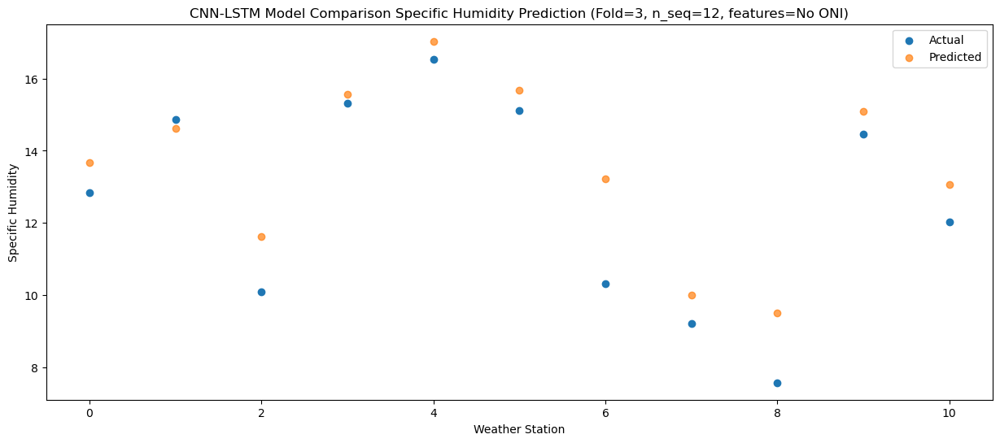

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0    9.21  10.543229
1                 1   10.89  11.004305
2                 2    8.80  10.528855
3                 3   11.85  12.246268
4                 4   12.77  13.458751
5                 5   11.81  12.154290
6                 6    8.62  11.465098
7                 7    7.50   8.792204
8                 8    6.93   8.474576
9                 9   11.86  12.217048
10               10    9.10   9.956210


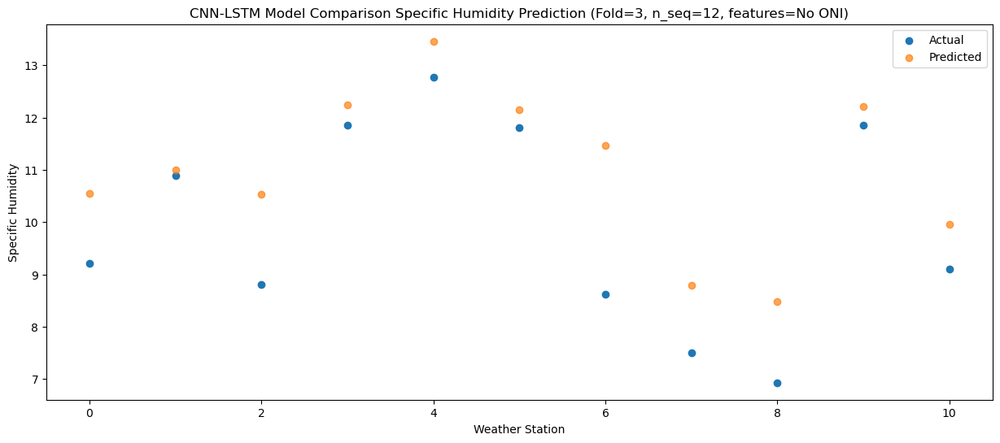

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0    7.17   8.027479
1                 1    8.70   8.314581
2                 2    7.66   8.583325
3                 3    9.79  10.112674
4                 4   10.82  11.096801
5                 5   10.19  10.040683
6                 6    7.53   8.829627
7                 7    6.40   6.532649
8                 8    5.90   6.735911
9                 9    9.32  10.106997
10               10    7.20   7.819765


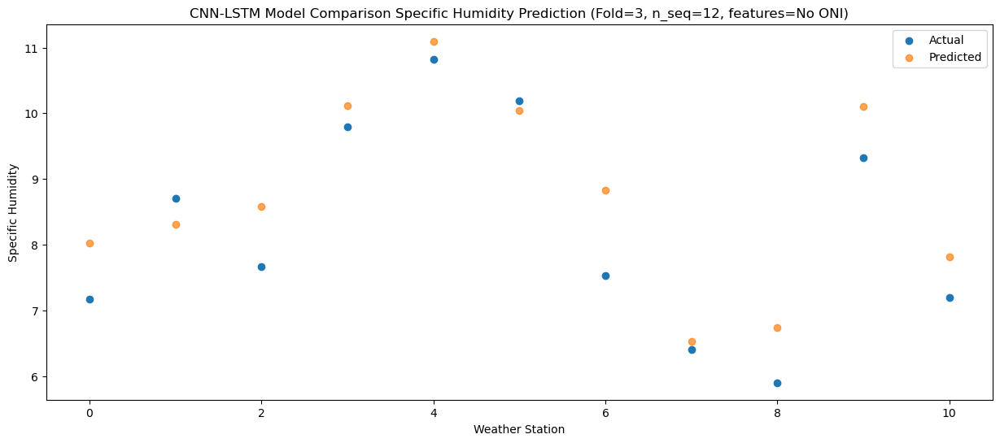

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    1.67   2.315831
1                 1    4.27   3.768743
2                 2    8.24   7.378610
3                 3    4.10   4.442472
4                 4    5.70   5.974222
5                 5    4.32   4.524492
6                 6    6.82   6.659659
7                 7    5.13   5.249966
8                 8    6.12   5.431711
9                 9    4.79   5.122474
10               10    2.28   2.551447


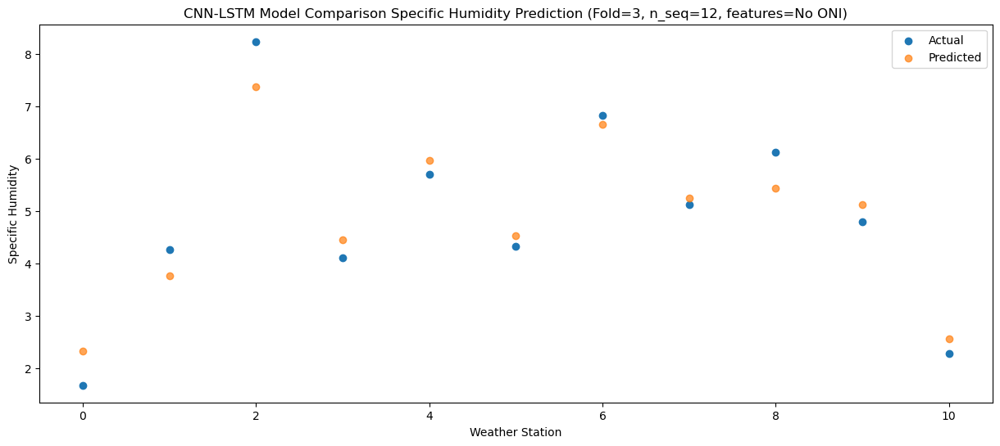

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    3.62   4.242406
1                 1    5.24   4.916158
2                 2    6.74   6.451404
3                 3    5.24   5.681371
4                 4    6.40   6.714637
5                 5    5.37   5.527726
6                 6    6.11   6.379247
7                 7    5.27   4.422576
8                 8    4.87   4.705886
9                 9    4.49   5.150367
10               10    2.18   2.759343


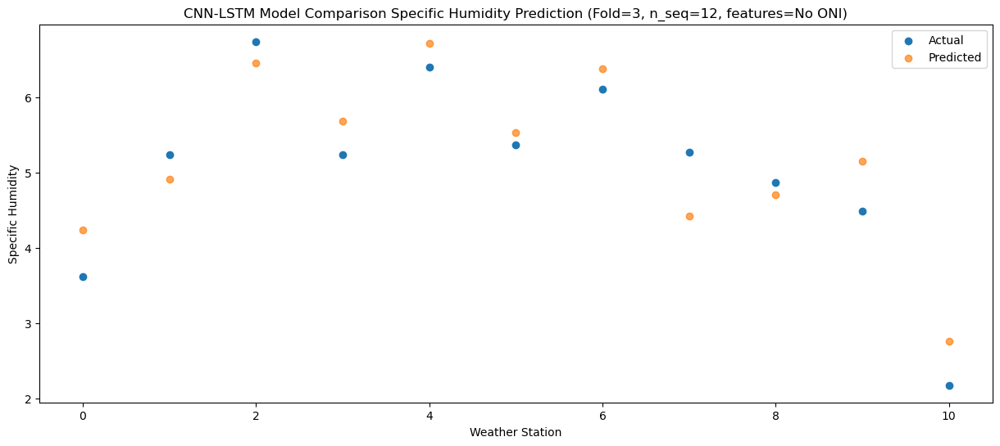

Model: "sequential_504"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_504 (Conv1D)         (None, 1, 1024)           2017280   
                                                                 
 max_pooling1d_504 (MaxPooli  (None, 1, 1024)          0         
 ng1D)                                                           
                                                                 
 dropout_1512 (Dropout)      (None, 1, 1024)           0         
                                                                 
 lstm_1008 (LSTM)            (None, 1, 1024)           8392704   
                                                                 
 dropout_1513 (Dropout)      (None, 1, 1024)           0         
                                                                 
 lstm_1009 (LSTM)            (None, 1024)              8392704   
                                                    

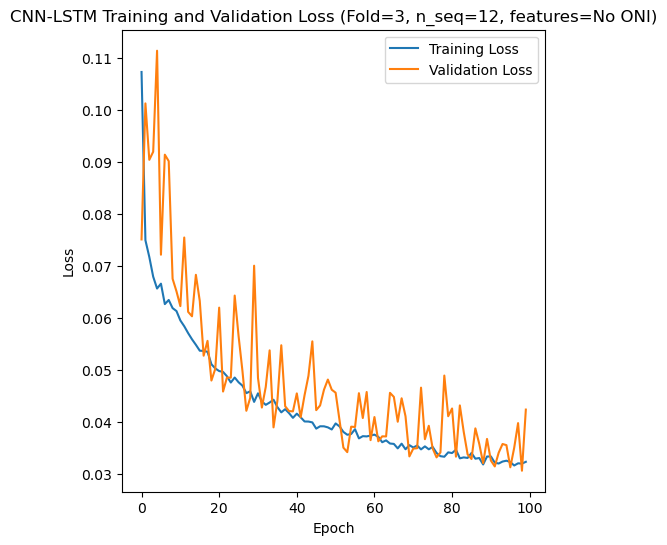

Epoch 1/100
84/84 [==============================] - 22s 119ms/step - loss: 0.1097 - accuracy: 0.6667 - mae: 0.0909 - rmse: 0.1097 - mape: 19.6696 - pearson: 0.6768 - val_loss: 0.0712 - val_accuracy: 0.8000 - val_mae: 0.0591 - val_rmse: 0.0712 - val_mape: 14.1928 - val_pearson: 0.7996
Epoch 2/100
84/84 [==============================] - 6s 66ms/step - loss: 0.0804 - accuracy: 0.7024 - mae: 0.0650 - rmse: 0.0804 - mape: 14.6398 - pearson: 0.7350 - val_loss: 0.0768 - val_accuracy: 0.8000 - val_mae: 0.0634 - val_rmse: 0.0768 - val_mape: 13.2453 - val_pearson: 0.7659
Epoch 3/100
84/84 [==============================] - 6s 66ms/step - loss: 0.0745 - accuracy: 0.6667 - mae: 0.0601 - rmse: 0.0745 - mape: 13.4873 - pearson: 0.7544 - val_loss: 0.0700 - val_accuracy: 0.8000 - val_mae: 0.0534 - val_rmse: 0.0700 - val_mape: 13.9242 - val_pearson: 0.7803
Epoch 4/100
84/84 [==============================] - 6s 69ms/step - loss: 0.0725 - accuracy: 0.7262 - mae: 0.0575 - rmse: 0.0725 - mape: 13.1620 -

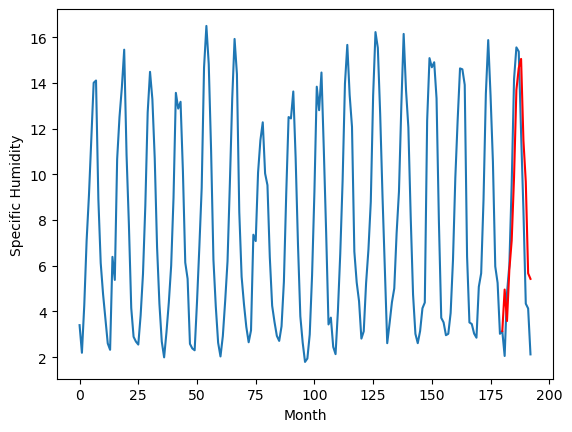

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.27		3.89		-0.38
6.26		4.27		-1.99
6.23		4.94		-1.29
6.98		5.80		-1.18
8.31		6.95		-1.36
12.60		10.49		-2.11
13.81		11.33		-2.48
14.20		12.36		-1.84
13.40		10.66		-2.74
10.48		8.93		-1.55
5.82		4.43		-1.39
7.56		6.03		-1.53
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.79, 3.889866583123803, 4.268963627591729, 4.937575750127435, 5.795758418813348, 6.947711043134332, 10.488713316693902, 11.32599692799151, 12.356142096295953, 10.662252239957452, 8.925289087072015, 4.428597860112786, 6.032663755193353]


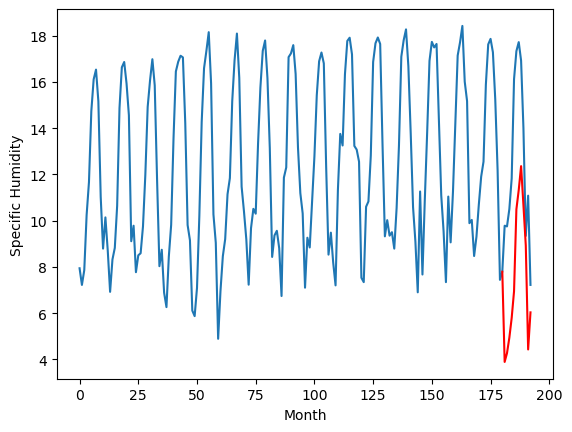

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.87		3.88		0.01
3.75		3.39		-0.36
6.81		5.71		-1.10
7.06		6.59		-0.47
10.50		9.43		-1.07
14.74		13.29		-1.45
16.39		14.08		-2.31
16.40		14.68		-1.72
13.46		11.74		-1.72
10.68		9.70		-0.98
5.24		4.39		-0.85
8.19		6.88		-1.31
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.03, 3.8759474712610245, 3.3892115312814712, 5.712369080185891, 6.591472085118294, 9.429080422520638, 13.291680510640145, 14.083201285004616, 14.68208002626896, 11.740451093316079, 9.704684491753579, 4.387800927758217, 6.883598800301552]


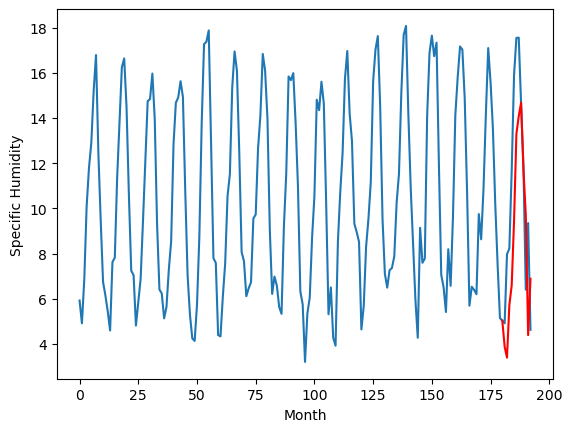

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.73		3.65		-0.08
3.41		2.46		-0.95
6.07		5.06		-1.01
7.36		6.37		-0.99
11.36		9.58		-1.78
15.05		13.16		-1.89
15.62		13.79		-1.83
16.01		14.18		-1.83
12.00		10.73		-1.27
9.15		8.79		-0.36
5.53		4.70		-0.83
7.39		5.65		-1.74
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.41, 3.6509924793243407, 2.4625444078445433, 5.055990662574768, 6.365512218475342, 9.58394965171814, 13.155040111541748, 13.78691526889801, 14.183820542097092, 10.730593022108078, 8.792820867300033, 4.697341855764389, 5.6511571967601775]


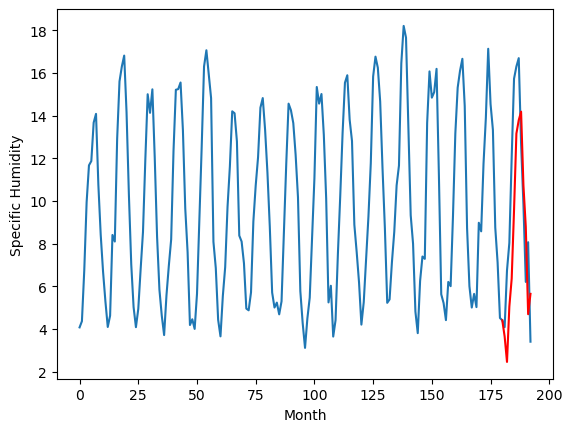

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.36		3.23		-0.13
2.91		2.01		-0.90
5.49		4.51		-0.98
6.85		5.83		-1.02
11.14		8.99		-2.15
15.02		12.45		-2.57
15.40		13.09		-2.31
15.51		13.45		-2.06
11.61		10.05		-1.56
8.88		8.13		-0.75
5.27		4.28		-0.99
6.68		4.97		-1.71
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.29, 3.2268787413835525, 2.0061543971300124, 4.512833455204964, 5.8269191771745685, 8.989610770344735, 12.454684355854988, 13.085753241181374, 13.45203552544117, 10.05053839981556, 8.129121401906014, 4.284374335408211, 4.969410219788552]


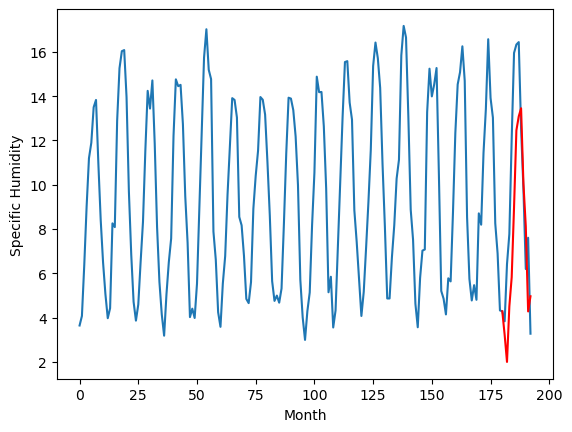

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.64		8.00		-0.64
8.00		7.05		-0.95
9.49		8.62		-0.87
10.45		9.71		-0.74
15.00		12.30		-2.70
17.30		14.90		-2.40
18.33		15.77		-2.56
18.05		15.85		-2.20
14.80		13.25		-1.55
11.75		11.31		-0.44
10.03		8.88		-1.15
9.18		8.61		-0.57
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.47, 7.998450408279896, 7.045468161404133, 8.615986535847188, 9.714554140865804, 12.300734827816488, 14.898737500011922, 15.768225798904897, 15.845819565057756, 13.252244802713395, 11.306285473108293, 8.884326072931291, 8.612168105840684]


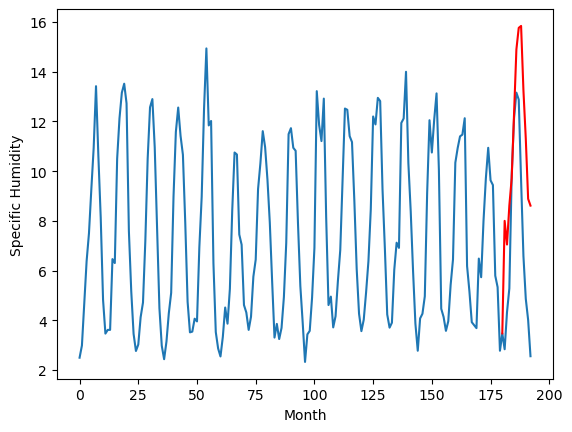

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.80		5.65		-0.15
6.05		5.34		-0.71
7.76		6.97		-0.79
8.17		7.90		-0.27
11.15		10.09		-1.06
15.84		14.28		-1.56
17.44		15.44		-2.00
17.82		16.20		-1.62
14.24		13.31		-0.93
12.03		11.34		-0.69
6.31		5.98		-0.33
8.17		7.57		-0.60
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.52, 5.65460179567337, 5.335214329957962, 6.968553615808487, 7.898882819414139, 10.086920214891434, 14.275932742357254, 15.436813665628433, 16.197983099222185, 13.313583208322527, 11.339842749834062, 5.981584979295732, 7.568678928613664]


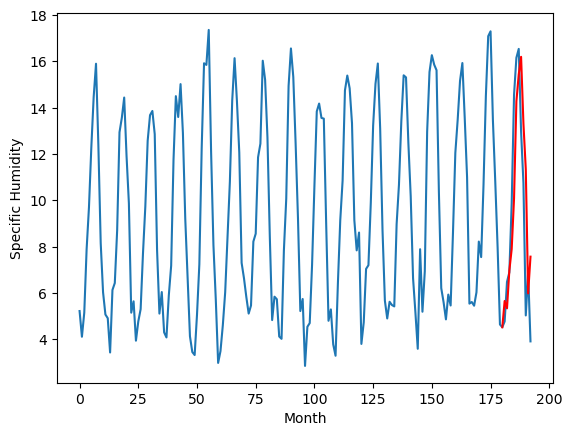

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.93		3.81		-0.12
3.30		2.70		-0.60
5.67		5.05		-0.62
6.59		6.31		-0.28
9.75		9.07		-0.68
14.35		13.15		-1.20
15.30		14.01		-1.29
15.04		14.61		-0.43
11.78		11.11		-0.67
9.69		9.28		-0.41
5.00		4.56		-0.44
6.47		5.37		-1.10
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.4, 3.814074890613556, 2.702614920139313, 5.053813116550446, 6.313089745044708, 9.069713251590729, 13.151326315402985, 14.007569627761841, 14.608105437755585, 11.106569068431854, 9.279455440044403, 4.562822120189667, 5.367574350833893]


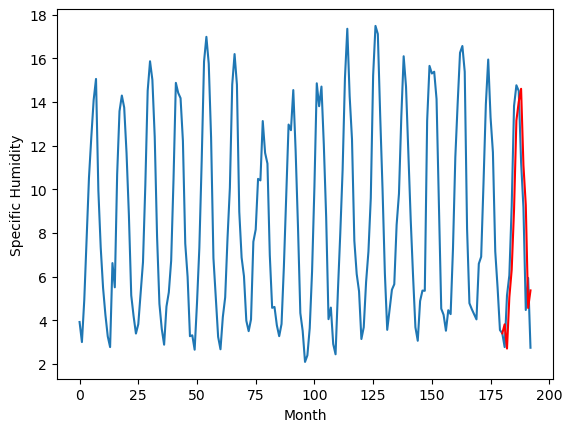

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.30		3.22		-0.08
2.73		2.17		-0.56
4.67		3.94		-0.73
6.00		5.50		-0.50
8.29		7.24		-1.05
13.35		11.80		-1.55
14.61		12.72		-1.89
14.75		13.79		-0.96
11.27		10.34		-0.93
10.12		8.99		-1.13
4.35		3.96		-0.39
5.06		4.09		-0.97
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.82, 3.2160549998283385, 2.1669010758399962, 3.935296618938446, 5.504409277439118, 7.239257299900055, 11.799189531803131, 12.716547334194184, 13.794570648670197, 10.342946016788483, 8.993519151210785, 3.9627393126487735, 4.087666982412339]


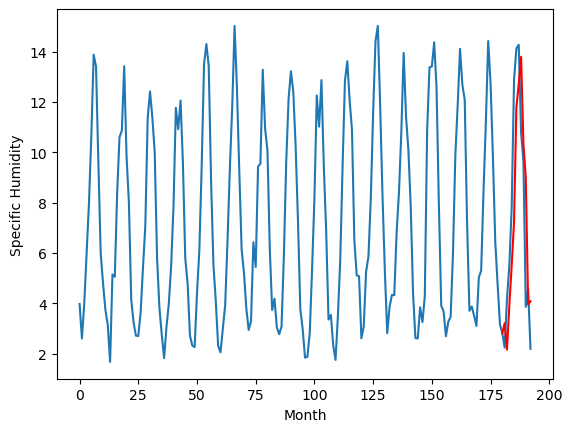

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.17		2.11		-0.06
1.53		0.88		-0.65
3.90		2.88		-1.02
5.21		4.38		-0.83
7.83		6.41		-1.42
12.58		10.87		-1.71
13.98		11.75		-2.23
14.23		12.71		-1.52
10.20		9.11		-1.09
8.33		7.70		-0.63
3.04		2.82		-0.22
3.58		2.82		-0.76
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.86, 2.1058223152160647, 0.8765902423858645, 2.876288642883301, 4.376388182640076, 6.409438004493714, 10.870482316017151, 11.751063516139984, 12.710620632171631, 9.106901397705078, 7.696178188323975, 2.8218839073181154, 2.822691552641336]


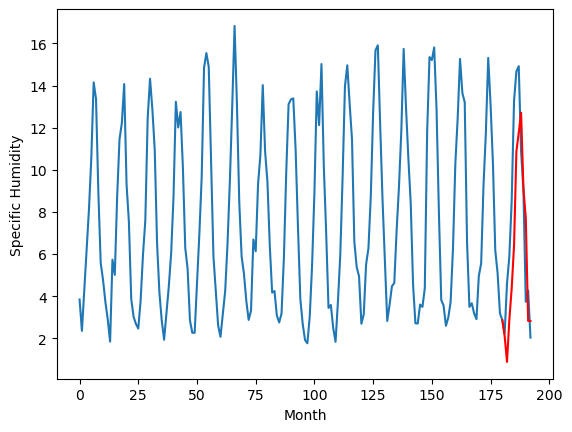

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.84		4.69		-0.15
4.27		3.69		-0.58
5.56		5.03		-0.53
7.23		6.78		-0.45
8.83		8.00		-0.83
13.84		12.54		-1.30
15.11		13.29		-1.82
15.98		14.68		-1.30
12.22		11.43		-0.79
11.21		10.34		-0.87
5.97		5.65		-0.32
5.93		5.20		-0.73
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.61, 4.691493482589721, 3.6871337604522703, 5.031215043067932, 6.780728311538696, 8.00279137611389, 12.536619157791137, 13.294590444564818, 14.676063151359557, 11.434919686317443, 10.341760129928588, 5.648567647933959, 5.204640091657637]


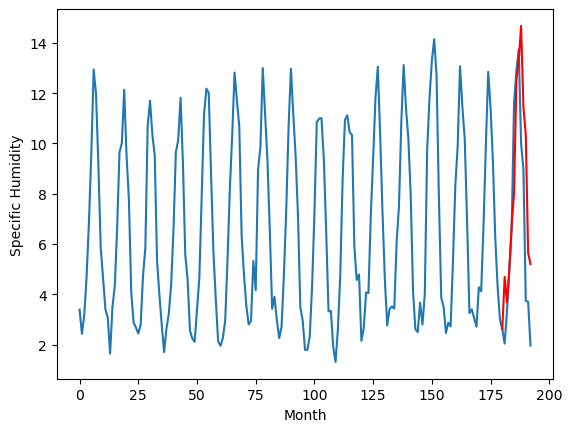

RangeIndex(start=1, stop=12, step=1)
[5.34, 4.269999999999999, 3.870000000000001, 3.7300000000000004, 3.3600000000000003, 8.64, 5.8, 3.93, 3.3000000000000003, 2.1699999999999995, 4.839999999999999]
[4.958667130470276, 3.889866583123803, 3.8759474712610245, 3.6509924793243407, 3.2268787413835525, 7.998450408279896, 5.65460179567337, 3.814074890613556, 3.2160549998283385, 2.1058223152160647, 4.691493482589721]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    5.34   4.958667
1                 1    4.27   3.889867
2                 2    3.87   3.875947
3                 3    3.73   3.650992
4                 4    3.36   3.226879
5                 5    8.64   7.998450
6                 6    5.80   5.654602
7                 7    3.93   3.814075
8                 8    3.30   3.216055
9                 9    2.17   2.105822
10               10    4.84   4.691493


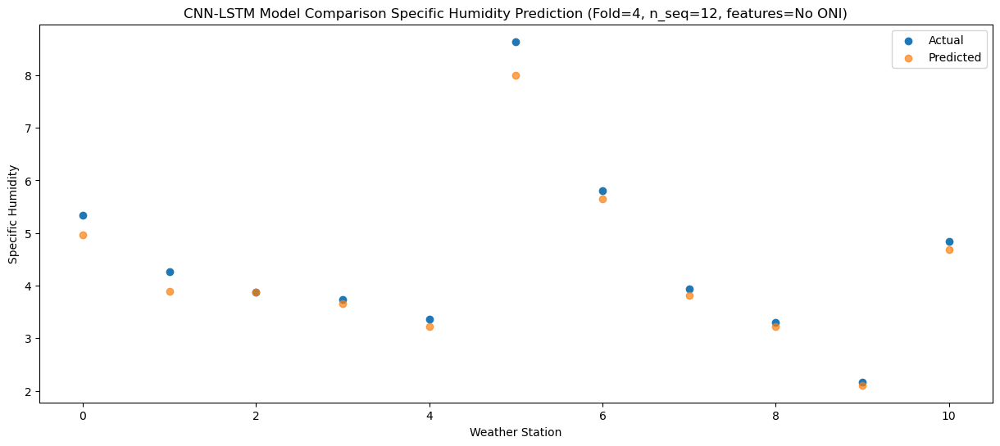

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.25   3.578823
1                 1    6.26   4.268964
2                 2    3.75   3.389212
3                 3    3.41   2.462544
4                 4    2.91   2.006154
5                 5    8.00   7.045468
6                 6    6.05   5.335214
7                 7    3.30   2.702615
8                 8    2.73   2.166901
9                 9    1.53   0.876590
10               10    4.27   3.687134


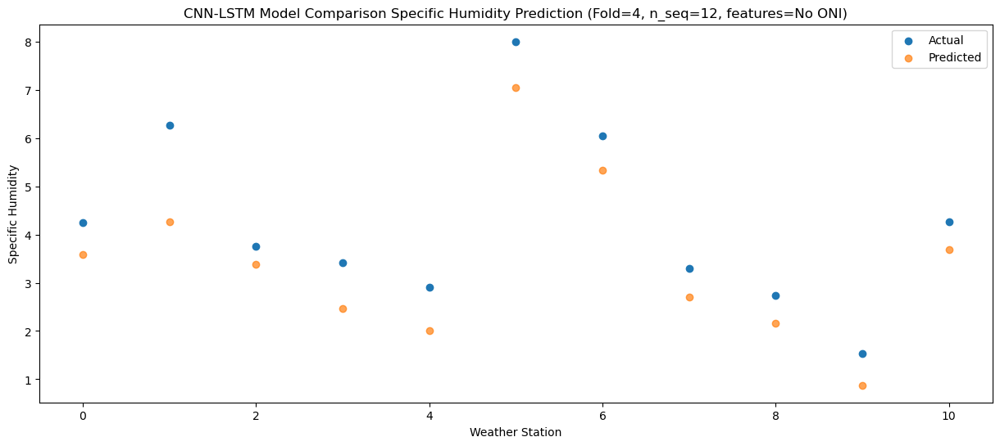

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.01   5.825770
1                 1    6.23   4.937576
2                 2    6.81   5.712369
3                 3    6.07   5.055991
4                 4    5.49   4.512833
5                 5    9.49   8.615987
6                 6    7.76   6.968554
7                 7    5.67   5.053813
8                 8    4.67   3.935297
9                 9    3.90   2.876289
10               10    5.56   5.031215


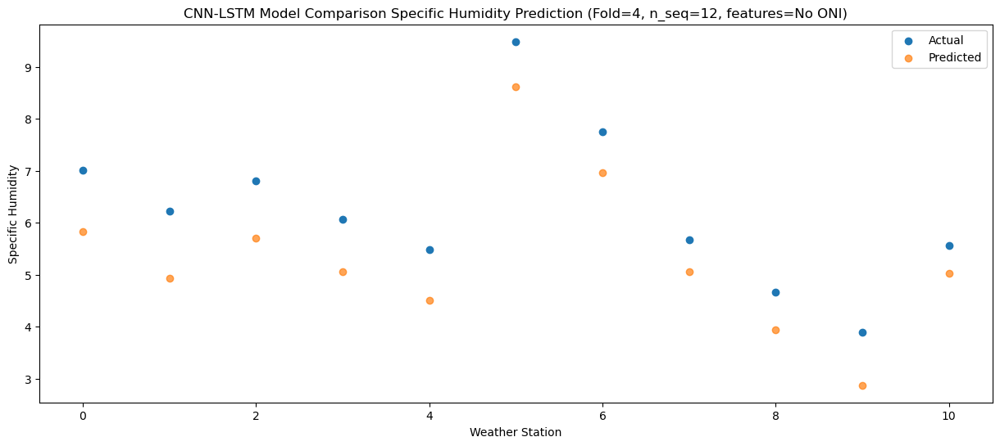

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    8.22   7.103113
1                 1    6.98   5.795758
2                 2    7.06   6.591472
3                 3    7.36   6.365512
4                 4    6.85   5.826919
5                 5   10.45   9.714554
6                 6    8.17   7.898883
7                 7    6.59   6.313090
8                 8    6.00   5.504409
9                 9    5.21   4.376388
10               10    7.23   6.780728


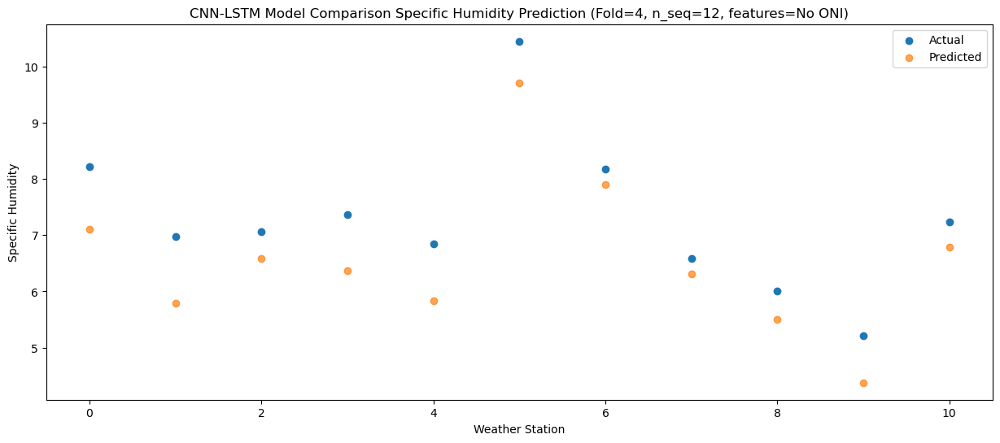

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   11.78   9.877575
1                 1    8.31   6.947711
2                 2   10.50   9.429080
3                 3   11.36   9.583950
4                 4   11.14   8.989611
5                 5   15.00  12.300735
6                 6   11.15  10.086920
7                 7    9.75   9.069713
8                 8    8.29   7.239257
9                 9    7.83   6.409438
10               10    8.83   8.002791


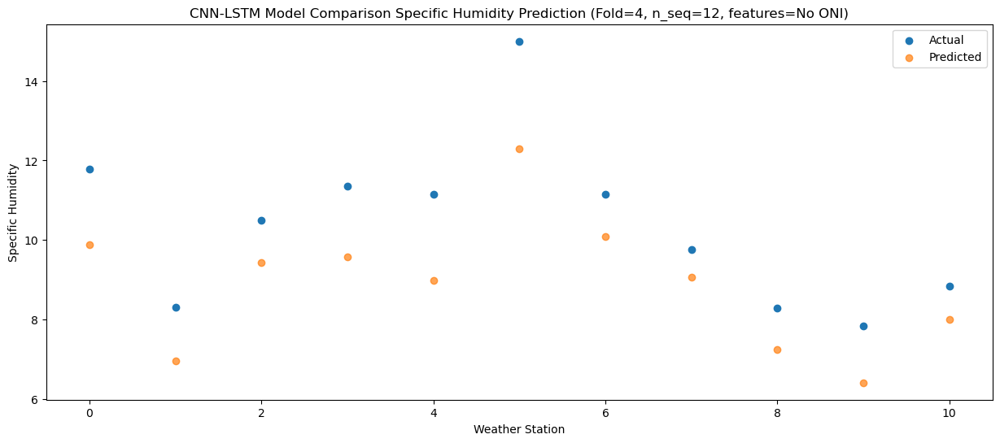

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   16.37  13.696165
1                 1   12.60  10.488713
2                 2   14.74  13.291681
3                 3   15.05  13.155040
4                 4   15.02  12.454684
5                 5   17.30  14.898738
6                 6   15.84  14.275933
7                 7   14.35  13.151326
8                 8   13.35  11.799190
9                 9   12.58  10.870482
10               10   13.84  12.536619


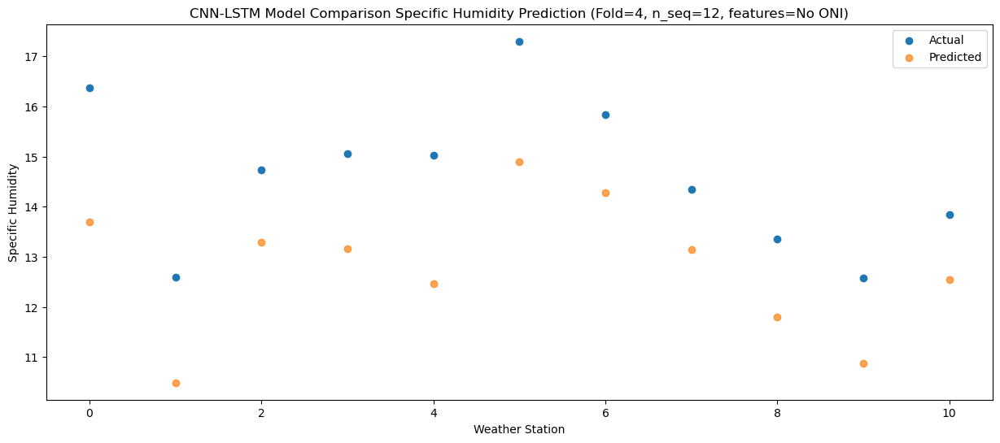

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   17.76  14.653522
1                 1   13.81  11.325997
2                 2   16.39  14.083201
3                 3   15.62  13.786915
4                 4   15.40  13.085753
5                 5   18.33  15.768226
6                 6   17.44  15.436814
7                 7   15.30  14.007570
8                 8   14.61  12.716547
9                 9   13.98  11.751064
10               10   15.11  13.294590


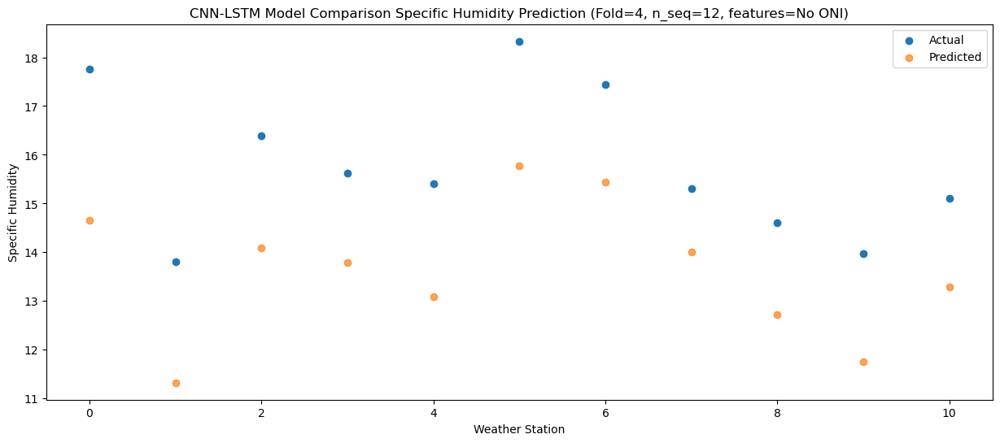

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   17.58  15.054813
1                 1   14.20  12.356142
2                 2   16.40  14.682080
3                 3   16.01  14.183821
4                 4   15.51  13.452036
5                 5   18.05  15.845820
6                 6   17.82  16.197983
7                 7   15.04  14.608105
8                 8   14.75  13.794571
9                 9   14.23  12.710621
10               10   15.98  14.676063


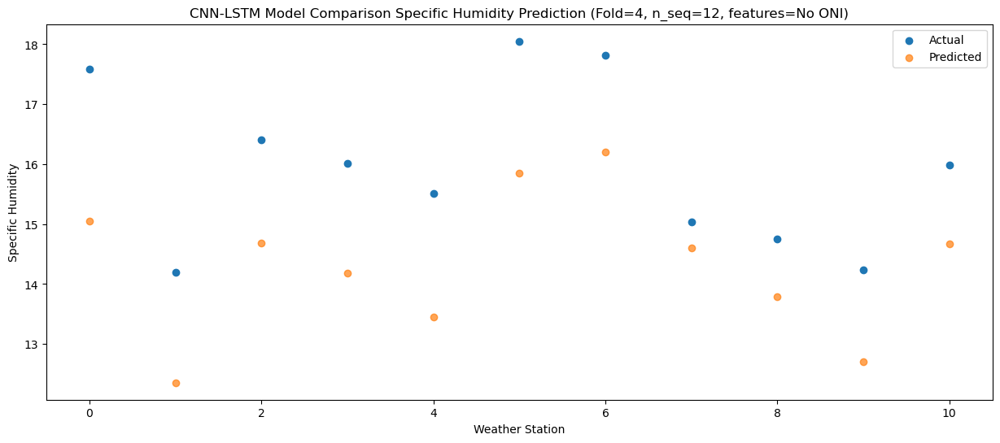

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   14.00  11.483715
1                 1   13.40  10.662252
2                 2   13.46  11.740451
3                 3   12.00  10.730593
4                 4   11.61  10.050538
5                 5   14.80  13.252245
6                 6   14.24  13.313583
7                 7   11.78  11.106569
8                 8   11.27  10.342946
9                 9   10.20   9.106901
10               10   12.22  11.434920


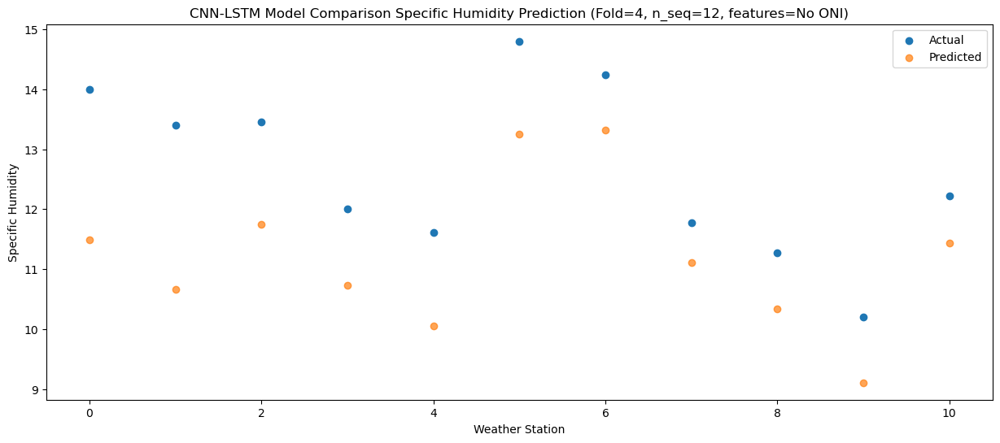

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   10.63   9.674465
1                 1   10.48   8.925289
2                 2   10.68   9.704684
3                 3    9.15   8.792821
4                 4    8.88   8.129121
5                 5   11.75  11.306285
6                 6   12.03  11.339843
7                 7    9.69   9.279455
8                 8   10.12   8.993519
9                 9    8.33   7.696178
10               10   11.21  10.341760


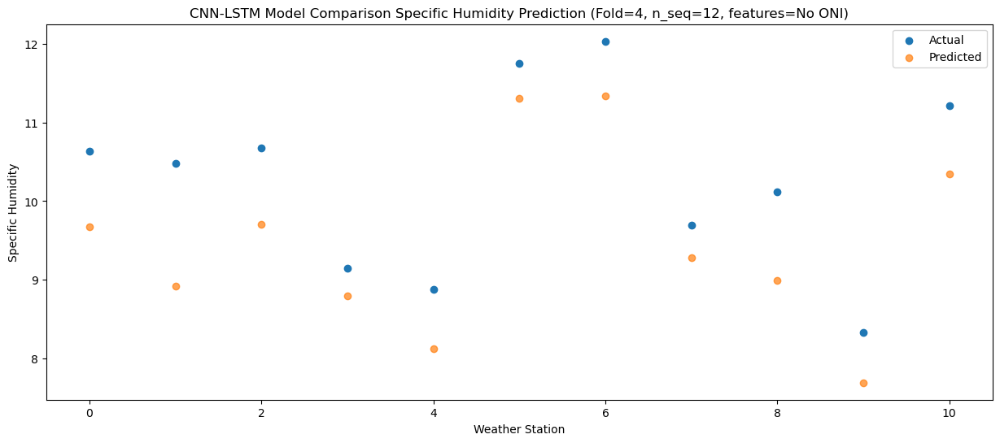

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    6.54   5.667636
1                 1    5.82   4.428598
2                 2    5.24   4.387801
3                 3    5.53   4.697342
4                 4    5.27   4.284374
5                 5   10.03   8.884326
6                 6    6.31   5.981585
7                 7    5.00   4.562822
8                 8    4.35   3.962739
9                 9    3.04   2.821884
10               10    5.97   5.648568


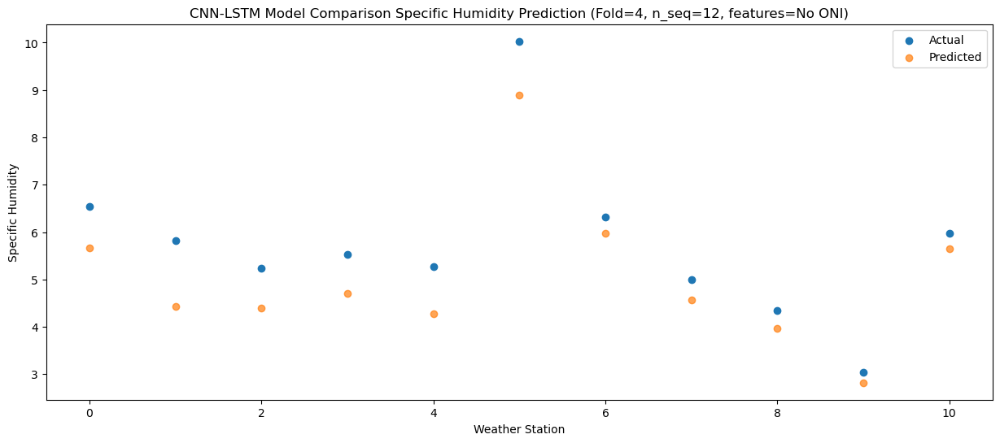

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    6.33   5.425395
1                 1    7.56   6.032664
2                 2    8.19   6.883599
3                 3    7.39   5.651157
4                 4    6.68   4.969410
5                 5    9.18   8.612168
6                 6    8.17   7.568679
7                 7    6.47   5.367574
8                 8    5.06   4.087667
9                 9    3.58   2.822692
10               10    5.93   5.204640


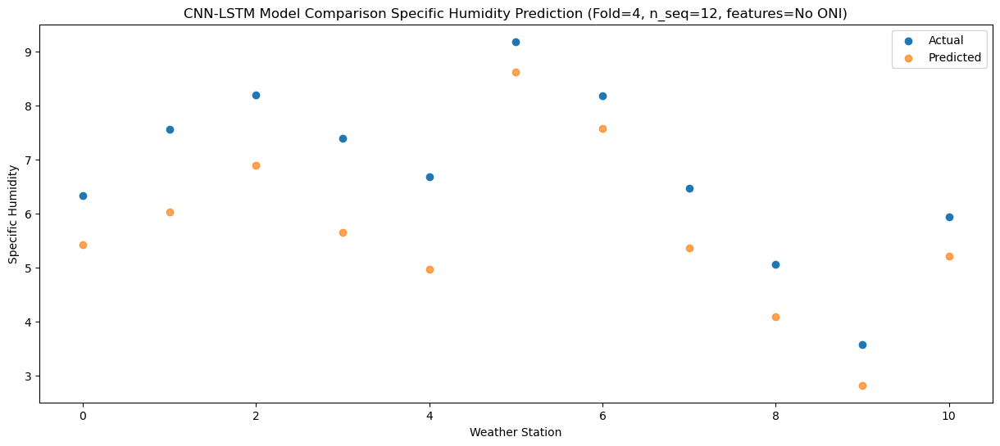

Model: "sequential_505"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_505 (Conv1D)         (None, 1, 1024)           2017280   
                                                                 
 max_pooling1d_505 (MaxPooli  (None, 1, 1024)          0         
 ng1D)                                                           
                                                                 
 dropout_1515 (Dropout)      (None, 1, 1024)           0         
                                                                 
 lstm_1010 (LSTM)            (None, 1, 1024)           8392704   
                                                                 
 dropout_1516 (Dropout)      (None, 1, 1024)           0         
                                                                 
 lstm_1011 (LSTM)            (None, 1024)              8392704   
                                                    

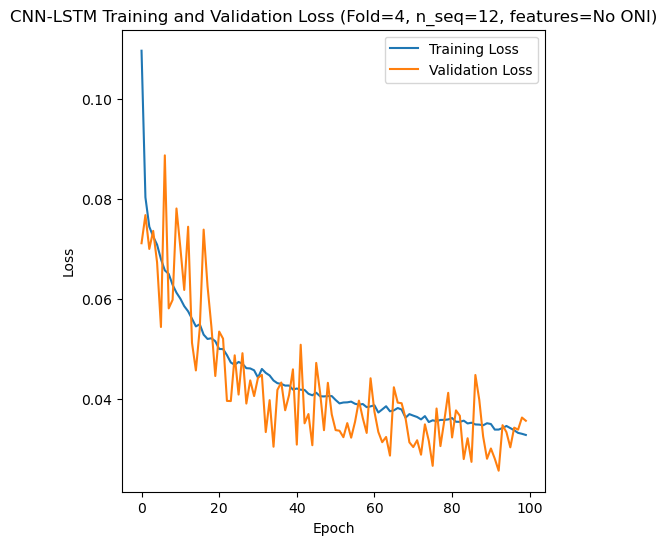

[[0.2536524958912889, 0.4206885641121598, 0.33217101600463367, 0.30076114812347793, 0.4576075423927937, 0.41762654288585, 0.5256273126551957, 0.665972612060595, 0.5716097196694296, 0.3071106873090131, 0.18815287981620313, 0.42634009910797405], [0.30633260344898344, 0.25841224139386604, 0.3936550574274694, 0.4238639263879796, 0.5628138478783395, 0.8082043564549624, 0.995252507016834, 0.8703903982128935, 0.4101178990052676, 0.61049641538921, 0.274370316718507, 0.8564464898450113], [0.29460920226103493, 0.6567012195846832, 0.6773356430633927, 0.9887118976063151, 1.5833975583552957, 1.3043423485284353, 1.2954138193395364, 1.1151873192154989, 1.2259726732532075, 0.4258838381173059, 0.5382489624353712, 0.9726989293166737], [0.29086854256577493, 0.23170993425626701, 0.28286869722731195, 0.5810017511233777, 1.2050144984625275, 1.858386203469029, 1.3086091750253606, 1.279794520625545, 1.2982544257125321, 0.6972822463232257, 0.46149128228891384, 0.4751564773037538], [0.26854826444122976, 0.91065

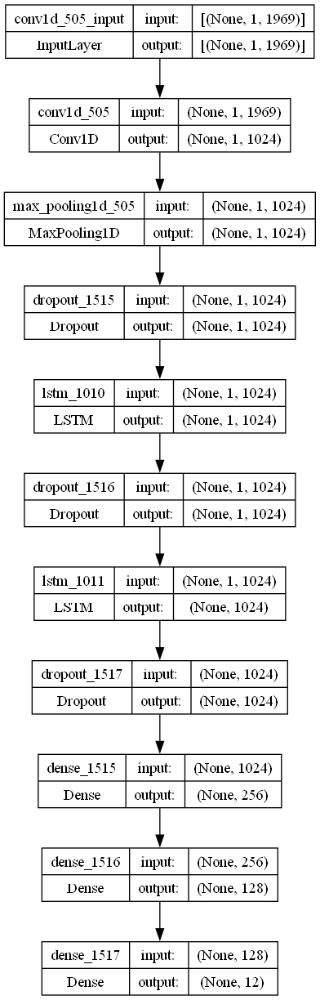

In [9]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

# fit the best CNN-LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from the best model
    filters = 1024
    lr = 0.09717994965838862
    optimizer = SGD(learning_rate = lr)
    activation_function = 'tanh'
    lstm_units = 1024
    dropout_rate = 0.18158906212107767

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# Make one forecast with a CNN-LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_cnnlstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_cnnlstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # Create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# Evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Specific Humidity")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse_avg_list = []
mae_avg_list = []
mape_avg_list = []
r2_score_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (specific humidity)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction

    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse_avg_list.append(rmse_list)
    mae_avg_list.append(mae_list)
    mape_avg_list.append(mape_list)
    r2_score_avg_list.append(r2_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)

    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        
        plot_forecasts(series_ws, forecasts_ws, n_test, n_seq, n_lag)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)
            
        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='CNN-LSTM Model Comparison Specific Humidity Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No ONI)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Specific Humidity')
        plt.legend()
        plt.show()

    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'CNN-LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No ONI)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse_avg_list)
print(mae_avg_list)
print(mape_avg_list)
print(r2_score_avg_list)
print(forecast_results)
print(actual_results)
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse_avg_list)
print("Average RMSE:"+str(np.mean(rmse_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "cnnlstm_model_optimized_SH_S12_No_ONI.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)